## Imports

In [1]:
import pandas as pd
from pandas.api.types import CategoricalDtype
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
import datetime
warnings.filterwarnings('ignore')
#print(sns.__version__)

## Load Data

Note: Data obtained from various sources (via scraping and manual entry) and compiled into .xlsx format prior to this workstream

In [2]:
#Read file into a DataFrame and print head.
xword_data = pd.ExcelFile('../../NYT_XWord_data_master.xlsx', engine='openpyxl')
print(xword_data.sheet_names)

['Sheet1']


In [3]:
df1 = xword_data.parse('Sheet1')

In [4]:
df1.head(35)

,Puzzle_Date,GMS_Completed,IS1_Completed,IS2_Completed,Completed_Date (IS1),Completed_Date (IS2),Day_of_Week,Time (s) (IS1),Time (s) (IS2),Global_Median_Solver_Time(s),...,90_180_Rot_Sym,LR_UD_Sym,Diag_Sym,Black_Square_Fill,Outside_Grid,Unchecked_Sq,Uniclue,Duplicate_Answers,Quantum,Wordplay
0,2024-03-01,1,1.0,1.0,2024-03-01 07:04:43,2024-03-01 16:59:50,Friday,515.0,609.0,1048,...,0,0,0,0,0,0,0,0,0,4.0
1,2024-02-29,1,1.0,1.0,2024-02-29 07:04:13,2024-02-29 12:26:46,Thursday,424.0,645.0,781,...,0,0,0,0,0,0,0,0,0,3.0
2,2024-02-28,1,1.0,1.0,2024-02-28 07:21:54,2024-02-28 18:02:10,Wednesday,359.0,422.0,477,...,0,0,0,0,0,0,0,0,0,3.0
3,2024-02-27,1,1.0,1.0,2024-02-27 07:04:48,2024-02-27 10:50:37,Tuesday,305.0,228.0,285,...,0,0,0,0,0,0,0,0,0,0.0
4,2024-02-26,1,1.0,1.0,2024-02-25 18:19:45,2024-02-26 16:06:10,Monday,247.0,258.0,300,...,0,0,0,0,0,0,0,0,0,1.0
5,2024-02-25,1,1.0,1.0,2024-02-24 18:42:10,2024-02-25 10:03:32,Sunday,865.0,1054.0,1500,...,0,0,0,0,0,0,0,0,0,12.0
6,2024-02-24,1,1.0,1.0,2024-02-24 07:23:10,2024-02-24 14:54:10,Saturday,604.0,871.0,1082,...,0,0,0,0,0,0,0,0,0,6.0
7,2024-02-23,1,1.0,1.0,2024-02-23 06:49:34,2024-02-24 09:51:55,Friday,518.0,1255.0,1043,...,1,0,0,0,0,0,0,0,0,3.0
8,2024-02-22,1,1.0,1.0,2024-02-22 08:13:32,2024-02-22 18:05:02,Thursday,531.0,920.0,1148,...,0,0,0,0,0,0,0,0,0,3.0
9,2024-02-21,1,1.0,1.0,2024-02-21 06:49:48,2024-02-21 10:33:24,Wednesday,317.0,453.0,552,...,0,0,0,0,0,0,0,0,0,2.0


In [5]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2252 entries, 0 to 2251
Data columns (total 72 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Puzzle_Date                   2252 non-null   datetime64[ns]
 1   GMS_Completed                 2252 non-null   int64         
 2   IS1_Completed                 1208 non-null   float64       
 3   IS2_Completed                 1227 non-null   float64       
 4   Completed_Date (IS1)          1208 non-null   datetime64[ns]
 5   Completed_Date (IS2)          1229 non-null   datetime64[ns]
 6   Day_of_Week                   2252 non-null   object        
 7   Time (s) (IS1)                1208 non-null   float64       
 8   Time (s) (IS2)                1229 non-null   float64       
 9   Global_Median_Solver_Time(s)  2252 non-null   int64         
 10  Difficulty                    2252 non-null   object        
 11  Median_Solver%_AVG_PM         

## Data Cleaning and Global Median Solver Feature Creation
A few generally useful operations for the exploratory analysis of Individual Solver 1 (IS1)

In [6]:
# Delete weird columns at the back end of the imported data
#df2 = df1.drop(columns=df1.columns[-6:], axis=1)

In [6]:
# Drop Some columns that, while potentially useful for predictive modeling, aren't necessary for the EDA.
df2 = df1.drop(['Difficulty', '1st_Constructor', '1st_Constuctor_Gender', '1st_Constructor_Puzzle_N', '1st_Constructor_Debut', '1st_Constructor_Scrabble_Avg', '1st_Constructor_Fresh%_Avg', '2nd_Constructor', '2nd_Constuctor_Gender', '2nd_Constructor_Puzzle_N', '2nd_Constructor_Debut', '2nd_Constructor_Scrabble_Avg', '2nd_Constructor_Fresh%_Avg', '3rd_Constructor', '3rd_Constuctor_Gender', '3rd_Constructor_Puzzle_N', '3rd_Constructor_Debut', '3rd_Constructor_Scrabble_Avg', '3rd_Constructor_Fresh%_Avg', 'Spans', '2_Stacks', '3_4_Stacks', 'Mirror_Sym', 'UD_Sym', 'Asym', 'Supersym', '90_180_Rot_Sym', 'LR_UD_Sym', 'Diag_Sym', 'Black_Square_Fill','Outside_Grid', 'Unchecked_Sq','Uniclue','Duplicate_Answers','Quantum'], axis=1)

In [7]:
# Rename some columns for brevity and clarity
df2.rename(columns={'Constructors(by seniority)': 'Constructors', 'Median_Solver%_AVG_PM':'Diff%_from_10pMA(GMS)', 'Day_of_Week': 'DOW', 'Puzzle_Date': 'P_Date', 'Median_Solver%_AVG_PM': 'GMST_Diff%_from_GMS_10p_MA'}, inplace=True)

In [8]:
# It will be useful generally to have puzzle dates as strings in other columns along with the datetimes 
df2['P_Date_str'] = df2['P_Date'].dt.strftime('%Y-%m-%d') #we want datetime as a string to index into here

In [9]:
# Convert global median solve times (GMTs) per puzzle to minutes and drop times in seconds
df2["GMST(m)"] = df2["Global_Median_Solver_Time(s)"]/60  #GMST = Global Median solve times
df2.drop(['Global_Median_Solver_Time(s)'], axis=1, inplace=True)

In [10]:
#GMS_pds_l40_dw
#Provides decay-weighted(dw), puzzle day-specific (pds) mean solve time performance for GMS over the previous 40 puzzles relative to a given puzzle
# Note also that, unlike the 10-puzzle moving average, this weighted average does NOT include the "puzzle at hand" itself

df2 = df2.sort_values(by=['DOW', 'P_Date'], ascending = False)

# Gradual decay
w = np.arange(1,41)
w = list(w)

# No decay
# w = np.ones(40)
# w = list(w)

df2["GMS_pds_l40_dw_1"] = df2.groupby(['DOW'])['GMST(m)'].shift(-1)*w[0]
df2["GMS_pds_l40_dw_2"] = df2.groupby(['DOW'])['GMST(m)'].shift(-2)*w[1]
df2["GMS_pds_l40_dw_3"] = df2.groupby(['DOW'])['GMST(m)'].shift(-3)*w[2]
df2["GMS_pds_l40_dw_4"] = df2.groupby(['DOW'])['GMST(m)'].shift(-4)*w[3]
df2["GMS_pds_l40_dw_5"] = df2.groupby(['DOW'])['GMST(m)'].shift(-5)*w[4]
df2["GMS_pds_l40_dw_6"] = df2.groupby(['DOW'])['GMST(m)'].shift(-6)*w[5]
df2["GMS_pds_l40_dw_7"] = df2.groupby(['DOW'])['GMST(m)'].shift(-7)*w[6]
df2["GMS_pds_l40_dw_8"] = df2.groupby(['DOW'])['GMST(m)'].shift(-8)*w[7]
df2["GMS_pds_l40_dw_9"] = df2.groupby(['DOW'])['GMST(m)'].shift(-9)*w[8]
df2["GMS_pds_l40_dw_10"] = df2.groupby(['DOW'])['GMST(m)'].shift(-10)*w[9]
df2["GMS_pds_l40_dw_11"] = df2.groupby(['DOW'])['GMST(m)'].shift(-11)*w[10]
df2["GMS_pds_l40_dw_12"] = df2.groupby(['DOW'])['GMST(m)'].shift(-12)*w[11]
df2["GMS_pds_l40_dw_13"] = df2.groupby(['DOW'])['GMST(m)'].shift(-13)*w[12]
df2["GMS_pds_l40_dw_14"] = df2.groupby(['DOW'])['GMST(m)'].shift(-14)*w[13]
df2["GMS_pds_l40_dw_15"] = df2.groupby(['DOW'])['GMST(m)'].shift(-15)*w[14]
df2["GMS_pds_l40_dw_16"] = df2.groupby(['DOW'])['GMST(m)'].shift(-16)*w[15]
df2["GMS_pds_l40_dw_17"] = df2.groupby(['DOW'])['GMST(m)'].shift(-17)*w[16]
df2["GMS_pds_l40_dw_18"] = df2.groupby(['DOW'])['GMST(m)'].shift(-18)*w[17]
df2["GMS_pds_l40_dw_19"] = df2.groupby(['DOW'])['GMST(m)'].shift(-19)*w[18]
df2["GMS_pds_l40_dw_20"] = df2.groupby(['DOW'])['GMST(m)'].shift(-20)*w[19]
df2["GMS_pds_l40_dw_21"] = df2.groupby(['DOW'])['GMST(m)'].shift(-21)*w[20]
df2["GMS_pds_l40_dw_22"] = df2.groupby(['DOW'])['GMST(m)'].shift(-22)*w[21]
df2["GMS_pds_l40_dw_23"] = df2.groupby(['DOW'])['GMST(m)'].shift(-23)*w[22]
df2["GMS_pds_l40_dw_24"] = df2.groupby(['DOW'])['GMST(m)'].shift(-24)*w[23]
df2["GMS_pds_l40_dw_25"] = df2.groupby(['DOW'])['GMST(m)'].shift(-25)*w[24]
df2["GMS_pds_l40_dw_26"] = df2.groupby(['DOW'])['GMST(m)'].shift(-26)*w[25]
df2["GMS_pds_l40_dw_27"] = df2.groupby(['DOW'])['GMST(m)'].shift(-27)*w[26]
df2["GMS_pds_l40_dw_28"] = df2.groupby(['DOW'])['GMST(m)'].shift(-28)*w[27]
df2["GMS_pds_l40_dw_29"] = df2.groupby(['DOW'])['GMST(m)'].shift(-29)*w[28]
df2["GMS_pds_l40_dw_30"] = df2.groupby(['DOW'])['GMST(m)'].shift(-30)*w[29]
df2["GMS_pds_l40_dw_31"] = df2.groupby(['DOW'])['GMST(m)'].shift(-31)*w[30]
df2["GMS_pds_l40_dw_32"] = df2.groupby(['DOW'])['GMST(m)'].shift(-32)*w[31]
df2["GMS_pds_l40_dw_33"] = df2.groupby(['DOW'])['GMST(m)'].shift(-33)*w[32]
df2["GMS_pds_l40_dw_34"] = df2.groupby(['DOW'])['GMST(m)'].shift(-34)*w[33]
df2["GMS_pds_l40_dw_35"] = df2.groupby(['DOW'])['GMST(m)'].shift(-35)*w[34]
df2["GMS_pds_l40_dw_36"] = df2.groupby(['DOW'])['GMST(m)'].shift(-36)*w[35]
df2["GMS_pds_l40_dw_37"] = df2.groupby(['DOW'])['GMST(m)'].shift(-37)*w[36]
df2["GMS_pds_l40_dw_38"] = df2.groupby(['DOW'])['GMST(m)'].shift(-38)*w[37]
df2["GMS_pds_l40_dw_39"] = df2.groupby(['DOW'])['GMST(m)'].shift(-39)*w[38]
df2["GMS_pds_l40_dw_40"] = df2.groupby(['DOW'])['GMST(m)'].shift(-40)*w[39]


df2["GMS_pds_l40_dw_1_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-1)/df2.groupby(['DOW'])['GMST(m)'].shift(-1))*w[0]
df2["GMS_pds_l40_dw_2_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-2)/df2.groupby(['DOW'])['GMST(m)'].shift(-2))*w[1]
df2["GMS_pds_l40_dw_3_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-3)/df2.groupby(['DOW'])['GMST(m)'].shift(-3))*w[2]
df2["GMS_pds_l40_dw_4_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-4)/df2.groupby(['DOW'])['GMST(m)'].shift(-4))*w[3]
df2["GMS_pds_l40_dw_5_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-5)/df2.groupby(['DOW'])['GMST(m)'].shift(-5))*w[4]
df2["GMS_pds_l40_dw_6_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-6)/df2.groupby(['DOW'])['GMST(m)'].shift(-6))*w[5]
df2["GMS_pds_l40_dw_7_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-7)/df2.groupby(['DOW'])['GMST(m)'].shift(-7))*w[6]
df2["GMS_pds_l40_dw_8_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-8)/df2.groupby(['DOW'])['GMST(m)'].shift(-8))*w[7]
df2["GMS_pds_l40_dw_9_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-9)/df2.groupby(['DOW'])['GMST(m)'].shift(-9))*w[8]
df2["GMS_pds_l40_dw_10_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-10)/df2.groupby(['DOW'])['GMST(m)'].shift(-10))*w[9]
df2["GMS_pds_l40_dw_11_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-11)/df2.groupby(['DOW'])['GMST(m)'].shift(-11))*w[10]
df2["GMS_pds_l40_dw_12_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-12)/df2.groupby(['DOW'])['GMST(m)'].shift(-12))*w[11]
df2["GMS_pds_l40_dw_13_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-13)/df2.groupby(['DOW'])['GMST(m)'].shift(-13))*w[12]
df2["GMS_pds_l40_dw_14_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-14)/df2.groupby(['DOW'])['GMST(m)'].shift(-14))*w[13]
df2["GMS_pds_l40_dw_15_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-15)/df2.groupby(['DOW'])['GMST(m)'].shift(-15))*w[14]
df2["GMS_pds_l40_dw_16_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-16)/df2.groupby(['DOW'])['GMST(m)'].shift(-16))*w[15]
df2["GMS_pds_l40_dw_17_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-17)/df2.groupby(['DOW'])['GMST(m)'].shift(-17))*w[16]
df2["GMS_pds_l40_dw_18_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-18)/df2.groupby(['DOW'])['GMST(m)'].shift(-18))*w[17]
df2["GMS_pds_l40_dw_19_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-19)/df2.groupby(['DOW'])['GMST(m)'].shift(-19))*w[18]
df2["GMS_pds_l40_dw_20_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-20)/df2.groupby(['DOW'])['GMST(m)'].shift(-20))*w[19]
df2["GMS_pds_l40_dw_21_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-21)/df2.groupby(['DOW'])['GMST(m)'].shift(-21))*w[20]
df2["GMS_pds_l40_dw_22_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-22)/df2.groupby(['DOW'])['GMST(m)'].shift(-22))*w[21]
df2["GMS_pds_l40_dw_23_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-23)/df2.groupby(['DOW'])['GMST(m)'].shift(-23))*w[22]
df2["GMS_pds_l40_dw_24_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-24)/df2.groupby(['DOW'])['GMST(m)'].shift(-24))*w[23]
df2["GMS_pds_l40_dw_25_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-25)/df2.groupby(['DOW'])['GMST(m)'].shift(-25))*w[24]
df2["GMS_pds_l40_dw_26_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-26)/df2.groupby(['DOW'])['GMST(m)'].shift(-26))*w[25]
df2["GMS_pds_l40_dw_27_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-27)/df2.groupby(['DOW'])['GMST(m)'].shift(-27))*w[26]
df2["GMS_pds_l40_dw_28_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-28)/df2.groupby(['DOW'])['GMST(m)'].shift(-28))*w[27]
df2["GMS_pds_l40_dw_29_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-29)/df2.groupby(['DOW'])['GMST(m)'].shift(-29))*w[28]
df2["GMS_pds_l40_dw_30_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-30)/df2.groupby(['DOW'])['GMST(m)'].shift(-30))*w[29]
df2["GMS_pds_l40_dw_31_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-31)/df2.groupby(['DOW'])['GMST(m)'].shift(-31))*w[30]
df2["GMS_pds_l40_dw_32_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-32)/df2.groupby(['DOW'])['GMST(m)'].shift(-32))*w[31]
df2["GMS_pds_l40_dw_33_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-33)/df2.groupby(['DOW'])['GMST(m)'].shift(-33))*w[32]
df2["GMS_pds_l40_dw_34_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-34)/df2.groupby(['DOW'])['GMST(m)'].shift(-34))*w[33]
df2["GMS_pds_l40_dw_35_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-35)/df2.groupby(['DOW'])['GMST(m)'].shift(-35))*w[34]
df2["GMS_pds_l40_dw_36_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-36)/df2.groupby(['DOW'])['GMST(m)'].shift(-36))*w[35]
df2["GMS_pds_l40_dw_37_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-37)/df2.groupby(['DOW'])['GMST(m)'].shift(-37))*w[36]
df2["GMS_pds_l40_dw_38_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-38)/df2.groupby(['DOW'])['GMST(m)'].shift(-38))*w[37]
df2["GMS_pds_l40_dw_39_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-39)/df2.groupby(['DOW'])['GMST(m)'].shift(-39))*w[38]
df2["GMS_pds_l40_dw_40_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-40)/df2.groupby(['DOW'])['GMST(m)'].shift(-40))*w[39]


df2["GMS_pds_l40_ws"] = df2[["GMS_pds_l40_dw_1", "GMS_pds_l40_dw_2", "GMS_pds_l40_dw_3", "GMS_pds_l40_dw_4", "GMS_pds_l40_dw_5", "GMS_pds_l40_dw_6", "GMS_pds_l40_dw_7", "GMS_pds_l40_dw_8", "GMS_pds_l40_dw_9", "GMS_pds_l40_dw_10", "GMS_pds_l40_dw_11", "GMS_pds_l40_dw_12", "GMS_pds_l40_dw_13", "GMS_pds_l40_dw_14", "GMS_pds_l40_dw_15", "GMS_pds_l40_dw_16", "GMS_pds_l40_dw_17", "GMS_pds_l40_dw_18", "GMS_pds_l40_dw_19", "GMS_pds_l40_dw_20", "GMS_pds_l40_dw_21", "GMS_pds_l40_dw_22", "GMS_pds_l40_dw_23", "GMS_pds_l40_dw_24", "GMS_pds_l40_dw_25",
                            "GMS_pds_l40_dw_26", "GMS_pds_l40_dw_27", "GMS_pds_l40_dw_28", "GMS_pds_l40_dw_29", "GMS_pds_l40_dw_30", "GMS_pds_l40_dw_31", "GMS_pds_l40_dw_32", "GMS_pds_l40_dw_33", "GMS_pds_l40_dw_34", "GMS_pds_l40_dw_35", "GMS_pds_l40_dw_36", "GMS_pds_l40_dw_37", "GMS_pds_l40_dw_38", "GMS_pds_l40_dw_39", "GMS_pds_l40_dw_40"]].sum(axis=1)
df2["GMS_pds_l40_ws_ct"] = df2[["GMS_pds_l40_dw_1_ct", "GMS_pds_l40_dw_2_ct", "GMS_pds_l40_dw_3_ct", "GMS_pds_l40_dw_4_ct", "GMS_pds_l40_dw_5_ct", "GMS_pds_l40_dw_6_ct", "GMS_pds_l40_dw_7_ct", "GMS_pds_l40_dw_8_ct", "GMS_pds_l40_dw_9_ct", "GMS_pds_l40_dw_10_ct", "GMS_pds_l40_dw_11_ct", "GMS_pds_l40_dw_12_ct", "GMS_pds_l40_dw_13_ct", "GMS_pds_l40_dw_14_ct", "GMS_pds_l40_dw_15_ct", "GMS_pds_l40_dw_16_ct", "GMS_pds_l40_dw_17_ct", "GMS_pds_l40_dw_18_ct", "GMS_pds_l40_dw_19_ct", "GMS_pds_l40_dw_20_ct", "GMS_pds_l40_dw_21_ct", "GMS_pds_l40_dw_22_ct", "GMS_pds_l40_dw_23_ct", "GMS_pds_l40_dw_24_ct", "GMS_pds_l40_dw_25_ct",
                               "GMS_pds_l40_dw_26_ct", "GMS_pds_l40_dw_27_ct", "GMS_pds_l40_dw_28_ct", "GMS_pds_l40_dw_29_ct", "GMS_pds_l40_dw_30_ct", "GMS_pds_l40_dw_31_ct", "GMS_pds_l40_dw_32_ct", "GMS_pds_l40_dw_33_ct", "GMS_pds_l40_dw_34_ct", "GMS_pds_l40_dw_35_ct", "GMS_pds_l40_dw_36_ct", "GMS_pds_l40_dw_37_ct", "GMS_pds_l40_dw_38_ct", "GMS_pds_l40_dw_39_ct", "GMS_pds_l40_dw_40_ct"]].sum(axis=1)
df2["GMS_pds_l40_dw"] = df2["GMS_pds_l40_ws"]/df2["GMS_pds_l40_ws_ct"]

# Deleting transient columns
df2 = df2.drop(["GMS_pds_l40_dw_1", "GMS_pds_l40_dw_2", "GMS_pds_l40_dw_3", "GMS_pds_l40_dw_4", "GMS_pds_l40_dw_5", "GMS_pds_l40_dw_6", "GMS_pds_l40_dw_7", "GMS_pds_l40_dw_8", "GMS_pds_l40_dw_9", "GMS_pds_l40_dw_10", "GMS_pds_l40_dw_11", "GMS_pds_l40_dw_12", "GMS_pds_l40_dw_13", "GMS_pds_l40_dw_14", "GMS_pds_l40_dw_15", "GMS_pds_l40_dw_16", "GMS_pds_l40_dw_17", "GMS_pds_l40_dw_18", "GMS_pds_l40_dw_19", "GMS_pds_l40_dw_20", "GMS_pds_l40_dw_21", "GMS_pds_l40_dw_22", "GMS_pds_l40_dw_23", "GMS_pds_l40_dw_24", "GMS_pds_l40_dw_25", "GMS_pds_l40_dw_26", "GMS_pds_l40_dw_27", "GMS_pds_l40_dw_28", "GMS_pds_l40_dw_29", "GMS_pds_l40_dw_30", "GMS_pds_l40_dw_31", "GMS_pds_l40_dw_32", "GMS_pds_l40_dw_33", "GMS_pds_l40_dw_34", "GMS_pds_l40_dw_35", "GMS_pds_l40_dw_36", "GMS_pds_l40_dw_37", "GMS_pds_l40_dw_38", "GMS_pds_l40_dw_39", "GMS_pds_l40_dw_40",  
                "GMS_pds_l40_dw_1_ct", "GMS_pds_l40_dw_2_ct", "GMS_pds_l40_dw_3_ct", "GMS_pds_l40_dw_4_ct", "GMS_pds_l40_dw_5_ct", "GMS_pds_l40_dw_6_ct", "GMS_pds_l40_dw_7_ct", "GMS_pds_l40_dw_8_ct", "GMS_pds_l40_dw_9_ct", "GMS_pds_l40_dw_10_ct", "GMS_pds_l40_dw_11_ct", "GMS_pds_l40_dw_12_ct", "GMS_pds_l40_dw_13_ct", "GMS_pds_l40_dw_14_ct", "GMS_pds_l40_dw_15_ct", "GMS_pds_l40_dw_16_ct", "GMS_pds_l40_dw_17_ct", "GMS_pds_l40_dw_18_ct", "GMS_pds_l40_dw_19_ct", "GMS_pds_l40_dw_20_ct", "GMS_pds_l40_dw_21_ct", "GMS_pds_l40_dw_22_ct", "GMS_pds_l40_dw_23_ct", "GMS_pds_l40_dw_24_ct", "GMS_pds_l40_dw_25_ct", "GMS_pds_l40_dw_26_ct", "GMS_pds_l40_dw_27_ct", "GMS_pds_l40_dw_28_ct", "GMS_pds_l40_dw_29_ct", "GMS_pds_l40_dw_30_ct", "GMS_pds_l40_dw_31_ct", "GMS_pds_l40_dw_32_ct", "GMS_pds_l40_dw_33_ct", "GMS_pds_l40_dw_34_ct", "GMS_pds_l40_dw_35_ct", "GMS_pds_l40_dw_36_ct", "GMS_pds_l40_dw_37_ct", "GMS_pds_l40_dw_38_ct", "GMS_pds_l40_dw_39_ct", "GMS_pds_l40_dw_40_ct",
                "GMS_pds_l40_ws", "GMS_pds_l40_ws_ct"], axis = 1)

In [11]:
# Calculate 10-puzzle moving average for global median solver (GMS) raw solve times, within Day of Week
# Unlike for Individual Solvers (see below), we do NOT have completion dates for median solver per puzzle. It is therefore assumed that completion date tracks with puzzle date (obviously not always going to be true, but approximates true closely enough for our purposes)
df2 = df2.sort_values(by=['DOW','P_Date'], ascending = True)
df2['GMST(m)_10p_MA'] = df2.groupby('DOW')['GMST(m)'].transform(lambda x: x.rolling(10, 3).mean().reset_index(drop=True))
df2 = df2.sort_values(by=['DOW','P_Date'], ascending = False)

In [12]:
# Calculate deviation from GMS_pds_l40_dw for GMS
df2['GMST_Diff%_from_GMS_pds_l40_dw'] = (((df2['GMST(m)'] - df2['GMS_pds_l40_dw']))/((df2['GMST(m)'] + df2['GMS_pds_l40_dw'])/2)*100).round(2)

df2 = df2.sort_values(by=['DOW','P_Date'], ascending = False)

In [13]:
# It will be useful to have year of puzzle issue in a separate column for analysis below
df2['P_Yr'] = df2['P_Date'].dt.to_period('Y')
df2['P_Yr'].value_counts()

2020    366
2023    365
2021    365
2019    365
2022    365
2018    365
2024     61
Freq: A-DEC, Name: P_Yr, dtype: int64

In [14]:
# Also, a column indicating pre-2023 puzzle issue date or 2023-2024 puzzle issue date
df2.loc[(df2["P_Yr"] != "2023") & (df2["P_Yr"] != "2024"), "2023+_puzzle"] = 0 #pre-2023 puzzle issue date
df2.loc[(df2["P_Yr"] == "2023") | (df2["P_Yr"] == "2024"), "2023+_puzzle"] = 1 #2023 or 2024 puzzle issue date
df2['2023+_puzzle'].value_counts()

0.0    1826
1.0     426
Name: 2023+_puzzle, dtype: int64

In [15]:
# A numerical column for puzzle day that starts with Sunday and ends with Saturday
df2.loc[(df2["DOW"] == "Sunday"), "DOW_num"] = 1 
df2.loc[(df2["DOW"] == "Monday"), "DOW_num"] = 2
df2.loc[(df2["DOW"] == "Tuesday"), "DOW_num"] = 3
df2.loc[(df2["DOW"] == "Wednesday"), "DOW_num"] = 4
df2.loc[(df2["DOW"] == "Thursday"), "DOW_num"] = 5
df2.loc[(df2["DOW"] == "Friday"), "DOW_num"] = 6
df2.loc[(df2["DOW"] == "Saturday"), "DOW_num"] = 7

In [16]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2252 entries, 2 to 2247
Data columns (total 44 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   P_Date                          2252 non-null   datetime64[ns]
 1   GMS_Completed                   2252 non-null   int64         
 2   IS1_Completed                   1208 non-null   float64       
 3   IS2_Completed                   1227 non-null   float64       
 4   Completed_Date (IS1)            1208 non-null   datetime64[ns]
 5   Completed_Date (IS2)            1229 non-null   datetime64[ns]
 6   DOW                             2252 non-null   object        
 7   Time (s) (IS1)                  1208 non-null   float64       
 8   Time (s) (IS2)                  1229 non-null   float64       
 9   GMST_Diff%_from_GMS_10p_MA      2252 non-null   int64         
 10  Grid Size                       2252 non-null   int64         
 11  No_C

In [17]:
# Move new columns to logical places in dataframe
col = df2.pop('P_Date_str')
df2.insert(1, col.name, col)

col = df2.pop('P_Yr')
df2.insert(2, col.name, col)

col = df2.pop('2023+_puzzle')
df2.insert(3, col.name, col)

col = df2.pop('DOW')
df2.insert(4, col.name, col)

col = df2.pop('DOW_num')
df2.insert(5, col.name, col)

col = df2.pop('GMST(m)')
df2.insert(6, col.name, col)

col = df2.pop('GMST(m)_10p_MA')
df2.insert(7, col.name, col)

col = df2.pop('GMST_Diff%_from_GMS_10p_MA')
df2.insert(8, col.name, col)

col = df2.pop('GMS_pds_l40_dw')
df2.insert(9, col.name, col)

col = df2.pop('GMST_Diff%_from_GMS_pds_l40_dw')
df2.insert(10, col.name, col)

In [18]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2252 entries, 2 to 2247
Data columns (total 44 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   P_Date                          2252 non-null   datetime64[ns]
 1   P_Date_str                      2252 non-null   object        
 2   P_Yr                            2252 non-null   period[A-DEC] 
 3   2023+_puzzle                    2252 non-null   float64       
 4   DOW                             2252 non-null   object        
 5   DOW_num                         2252 non-null   float64       
 6   GMST(m)                         2252 non-null   float64       
 7   GMST(m)_10p_MA                  2238 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA      2252 non-null   int64         
 9   GMS_pds_l40_dw                  2245 non-null   float64       
 10  GMST_Diff%_from_GMS_pds_l40_dw  2245 non-null   float64       
 11  GMS_

In [19]:
# Checkpoint
df2.to_csv('../data/df2.csv', index=False)

## Individual Solver 1 (IS1) Data Cleaning and Feature Creation

In [20]:
# Keep only puzzles for which IS1 has a solve time, and drop columns specific to Individual Solver 2 (IS2)
df_IS1 = df2.dropna(subset=['IS1_Completed'])
df_IS1.drop(["Completed_Date (IS2)", "Time (s) (IS2)", "GMS_Completed", "IS1_Completed", "IS2_Completed"], axis = 1, inplace=True)

In [21]:
df_IS1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1208 entries, 2 to 1204
Data columns (total 39 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   P_Date                          1208 non-null   datetime64[ns]
 1   P_Date_str                      1208 non-null   object        
 2   P_Yr                            1208 non-null   period[A-DEC] 
 3   2023+_puzzle                    1208 non-null   float64       
 4   DOW                             1208 non-null   object        
 5   DOW_num                         1208 non-null   float64       
 6   GMST(m)                         1208 non-null   float64       
 7   GMST(m)_10p_MA                  1208 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA      1208 non-null   int64         
 9   GMS_pds_l40_dw                  1208 non-null   float64       
 10  GMST_Diff%_from_GMS_pds_l40_dw  1208 non-null   float64       
 11  Comp

In [22]:
df_IS1.head()

,P_Date,P_Date_str,P_Yr,2023+_puzzle,DOW,DOW_num,GMST(m),GMST(m)_10p_MA,GMST_Diff%_from_GMS_10p_MA,GMS_pds_l40_dw,...,Scrabble_Illegal,Open_Squares,Freshness_Factor,Overall_Freshness%,Day_Freshness%,Duplicate_Clues,Circle_Count,Shade_Count,Unusual_Sym,Wordplay
2,2024-02-28,2024-02-28,2024,1.0,Wednesday,4.0,7.950000,11.301667,-38,11.383313,...,25,69,23.6,11.5,14.9,0,0,0,0,3.0
9,2024-02-21,2024-02-21,2024,1.0,Wednesday,4.0,9.200000,11.903333,-28,11.545650,...,33,78,29.5,296.0,46.9,0,0,0,0,2.0
16,2024-02-14,2024-02-14,2024,1.0,Wednesday,4.0,13.916667,11.901667,6,11.450508,...,35,66,43.0,72.9,96.1,0,0,0,1,2.0
23,2024-02-07,2024-02-07,2024,1.0,Wednesday,4.0,11.900000,11.850000,-5,11.583069,...,31,72,29.5,29.3,46.0,0,0,0,0,2.0
30,2024-01-31,2024-01-31,2024,1.0,Wednesday,4.0,10.866667,11.536667,-12,11.712541,...,33,67,29.4,28.7,44.4,0,0,17,0,5.0


In [23]:
# It will be useful to have IS1 puzzle completion dates as strings in other columns along with the datetimes 
df_IS1['Comp_Date_str'] = df_IS1['Completed_Date (IS1)'].dt.strftime('%Y-%m-%d') #we want datetime as a string to index into here

In [24]:
# Convert Individual Solver1 (IS1) solve times per puzzle to minutes and drop times in seconds
df_IS1["IST(m)"] = df_IS1["Time (s) (IS1)"]/60   #IST = Individual solver times 
df_IS1.drop(['Time (s) (IS1)'], axis=1, inplace=True)

In [25]:
# It will be useful to have year of puzzle completion for this solver in a separate column for analysis below
df_IS1['Comp_Yr'] = df_IS1['Completed_Date (IS1)'].dt.to_period('Y')
df_IS1['Comp_Yr'].value_counts()

2022    493
2023    424
2021    230
2024     61
Freq: A-DEC, Name: Comp_Yr, dtype: int64

In [26]:
# Also, a column indicating pre-2023 solve or 2023/204 solve
df_IS1.loc[(df_IS1["Comp_Yr"] == "2023") | (df_IS1["Comp_Yr"] == "2024"), "2023+_solve"] = 1 #2023_2024 solve
df_IS1.loc[(df_IS1["Comp_Yr"] != "2023") & (df_IS1["Comp_Yr"] != "2024"), "2023+_solve"] = 0 #pre-2023 solve
df_IS1['2023+_solve'].value_counts()

0.0    723
1.0    485
Name: 2023+_solve, dtype: int64

In [27]:
# Rename a column for brevity and clarity
df_IS1.rename(columns={'Completed_Date (IS1)': 'Comp_Date'}, inplace=True)

In [28]:
df_IS1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1208 entries, 2 to 1204
Data columns (total 42 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   P_Date                          1208 non-null   datetime64[ns]
 1   P_Date_str                      1208 non-null   object        
 2   P_Yr                            1208 non-null   period[A-DEC] 
 3   2023+_puzzle                    1208 non-null   float64       
 4   DOW                             1208 non-null   object        
 5   DOW_num                         1208 non-null   float64       
 6   GMST(m)                         1208 non-null   float64       
 7   GMST(m)_10p_MA                  1208 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA      1208 non-null   int64         
 9   GMS_pds_l40_dw                  1208 non-null   float64       
 10  GMST_Diff%_from_GMS_pds_l40_dw  1208 non-null   float64       
 11  Comp

In [29]:
# Move new columns to logical places in dataframe
col = df_IS1.pop('Comp_Date_str')
df_IS1.insert(12, col.name, col)

col = df_IS1.pop('Comp_Yr')
df_IS1.insert(13, col.name, col)

col = df_IS1.pop('2023+_solve')
df_IS1.insert(14, col.name, col)

col = df_IS1.pop('IST(m)')
df_IS1.insert(15, col.name, col)

In [30]:
df_IS1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1208 entries, 2 to 1204
Data columns (total 42 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   P_Date                          1208 non-null   datetime64[ns]
 1   P_Date_str                      1208 non-null   object        
 2   P_Yr                            1208 non-null   period[A-DEC] 
 3   2023+_puzzle                    1208 non-null   float64       
 4   DOW                             1208 non-null   object        
 5   DOW_num                         1208 non-null   float64       
 6   GMST(m)                         1208 non-null   float64       
 7   GMST(m)_10p_MA                  1208 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA      1208 non-null   int64         
 9   GMS_pds_l40_dw                  1208 non-null   float64       
 10  GMST_Diff%_from_GMS_pds_l40_dw  1208 non-null   float64       
 11  Comp

## Feature Calculations

In [32]:
# Calculate 10-puzzle moving average for individual solver (IS1) raw solve times, per Day of Week
#Unlike for GMS, we DO have completion dates for individual solver per puzzle. Therefore we use completion date, not puzzle date
df_IS1 = df_IS1.sort_values(by=['DOW','Comp_Date'], ascending = True)
df_IS1['IST(m)_10p_MA'] = df_IS1.groupby('DOW')['IST(m)'].transform(lambda x: x.rolling(10, 3).mean().reset_index(drop=True))
df_IS1 = df_IS1.sort_values(by=['DOW','Comp_Date'], ascending = False)

In [33]:
#IS_pds_l8_ndw
#Determined in DTW testing preprocessing step of Modeling (see that project for details) to be the optimal temporal integration window for this solver

#Provides NON decay-weighted(ndw), puzzle day-specific (pds) mean solve time performance for IS1 over the previous 8 puzzles relative to a given puzzle
# Note that the sort is by completion date for IS1, as completion date was available 
# Note also that, unlike the 10-puzzle moving average, this weighted average does NOT include the "puzzle at hand" itself

df_IS1 = df_IS1.sort_values(by=['DOW', 'Comp_Date'], ascending = False)

# Partial decay 
# w = [8,7,6,4,4,4,4,4]

# Gradual decay
# w = np.arange(1,9)
# w = list(w)

# No decay
w = np.ones(8)
w = list(w)

df_IS1["IS_pds_l8_ndw_1"] = df_IS1.groupby(['DOW'])['IST(m)'].shift(-1)*w[0]
df_IS1["IS_pds_l8_ndw_2"] = df_IS1.groupby(['DOW'])['IST(m)'].shift(-2)*w[1]
df_IS1["IS_pds_l8_ndw_3"] = df_IS1.groupby(['DOW'])['IST(m)'].shift(-3)*w[2]
df_IS1["IS_pds_l8_ndw_4"] = df_IS1.groupby(['DOW'])['IST(m)'].shift(-4)*w[3]
df_IS1["IS_pds_l8_ndw_5"] = df_IS1.groupby(['DOW'])['IST(m)'].shift(-5)*w[4]
df_IS1["IS_pds_l8_ndw_6"] = df_IS1.groupby(['DOW'])['IST(m)'].shift(-6)*w[5]
df_IS1["IS_pds_l8_ndw_7"] = df_IS1.groupby(['DOW'])['IST(m)'].shift(-7)*w[6]
df_IS1["IS_pds_l8_ndw_8"] = df_IS1.groupby(['DOW'])['IST(m)'].shift(-8)*w[7]

df_IS1["IS_pds_l8_ndw_1_ct"] = (df_IS1.groupby(['DOW'])['IST(m)'].shift(-1)/df_IS1.groupby(['DOW'])['IST(m)'].shift(-1))*w[0]
df_IS1["IS_pds_l8_ndw_2_ct"] = (df_IS1.groupby(['DOW'])['IST(m)'].shift(-2)/df_IS1.groupby(['DOW'])['IST(m)'].shift(-2))*w[1]
df_IS1["IS_pds_l8_ndw_3_ct"] = (df_IS1.groupby(['DOW'])['IST(m)'].shift(-3)/df_IS1.groupby(['DOW'])['IST(m)'].shift(-3))*w[2]
df_IS1["IS_pds_l8_ndw_4_ct"] = (df_IS1.groupby(['DOW'])['IST(m)'].shift(-4)/df_IS1.groupby(['DOW'])['IST(m)'].shift(-4))*w[3]
df_IS1["IS_pds_l8_ndw_5_ct"] = (df_IS1.groupby(['DOW'])['IST(m)'].shift(-5)/df_IS1.groupby(['DOW'])['IST(m)'].shift(-5))*w[4]
df_IS1["IS_pds_l8_ndw_6_ct"] = (df_IS1.groupby(['DOW'])['IST(m)'].shift(-6)/df_IS1.groupby(['DOW'])['IST(m)'].shift(-6))*w[5]
df_IS1["IS_pds_l8_ndw_7_ct"] = (df_IS1.groupby(['DOW'])['IST(m)'].shift(-7)/df_IS1.groupby(['DOW'])['IST(m)'].shift(-7))*w[6]
df_IS1["IS_pds_l8_ndw_8_ct"] = (df_IS1.groupby(['DOW'])['IST(m)'].shift(-8)/df_IS1.groupby(['DOW'])['IST(m)'].shift(-8))*w[7]

df_IS1["IS_pds_l8_ws"] = df_IS1[["IS_pds_l8_ndw_1", "IS_pds_l8_ndw_2", "IS_pds_l8_ndw_3", "IS_pds_l8_ndw_4", "IS_pds_l8_ndw_5", "IS_pds_l8_ndw_6", "IS_pds_l8_ndw_7", "IS_pds_l8_ndw_8"]].sum(axis=1)
df_IS1["IS_pds_l8_ws_ct"] = df_IS1[["IS_pds_l8_ndw_1_ct", "IS_pds_l8_ndw_2_ct", "IS_pds_l8_ndw_3_ct", "IS_pds_l8_ndw_4_ct", "IS_pds_l8_ndw_5_ct", "IS_pds_l8_ndw_6_ct", "IS_pds_l8_ndw_7_ct", "IS_pds_l8_ndw_8_ct"]].sum(axis=1)
df_IS1["IS_pds_l8_ndw"] = df_IS1["IS_pds_l8_ws"]/df_IS1["IS_pds_l8_ws_ct"]

# Deleting transient columns
df_IS1 = df_IS1.drop(["IS_pds_l8_ndw_1", "IS_pds_l8_ndw_2", "IS_pds_l8_ndw_3", "IS_pds_l8_ndw_4", "IS_pds_l8_ndw_5", "IS_pds_l8_ndw_6", "IS_pds_l8_ndw_7", "IS_pds_l8_ndw_8", "IS_pds_l8_ws", "IS_pds_l8_ndw_1_ct", "IS_pds_l8_ndw_2_ct", "IS_pds_l8_ndw_3_ct", "IS_pds_l8_ndw_4_ct", "IS_pds_l8_ndw_5_ct", "IS_pds_l8_ndw_6_ct", "IS_pds_l8_ndw_7_ct", "IS_pds_l8_ndw_8_ct", "IS_pds_l8_ws_ct"], axis = 1)

In [34]:
# Calculate deviation from puzzle day-specific recent solve form (IS_pds_l20_dw) per individual raw solve time for individual solver (IS1)
df_IS1['IST_Diff%_from_IS_pds_l8_ndw'] = (((df_IS1['IST(m)'] - df_IS1['IS_pds_l8_ndw']))/((df_IS1['IST(m)'] + df_IS1['IS_pds_l8_ndw'])/2)*100).round(2)

df_IS1 = df_IS1.sort_values(by=['DOW','Comp_Date'], ascending = False)

In [35]:
# Calculate solve time % difference for IST from Global Median Solve Time, per solve
# Used for Supplemental Figure 1
df_IS1['IST_Diff%_from_GMST'] = (((df_IS1['IST(m)'] - df_IS1['GMST(m)']))/((df_IS1['IST(m)'] + df_IS1['GMST(m)'])/2)*100).round(2)

# Now compute 10-puzzle moving average for this difference from global median solver
df_IS1 = df_IS1.sort_values(by=['DOW','Comp_Date'], ascending = True)
df_IS1['10pMA_of_IST_Diff%_from_GMST'] = df_IS1.groupby('DOW')['IST_Diff%_from_GMST'].transform(lambda x: x.rolling(10, 3).mean().reset_index(drop=True))

df_IS1 = df_IS1.sort_values(by=['DOW','Comp_Date'], ascending = False)

In [36]:
df_IS1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1208 entries, 2 to 931
Data columns (total 47 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   P_Date                          1208 non-null   datetime64[ns]
 1   P_Date_str                      1208 non-null   object        
 2   P_Yr                            1208 non-null   period[A-DEC] 
 3   2023+_puzzle                    1208 non-null   float64       
 4   DOW                             1208 non-null   object        
 5   DOW_num                         1208 non-null   float64       
 6   GMST(m)                         1208 non-null   float64       
 7   GMST(m)_10p_MA                  1208 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA      1208 non-null   int64         
 9   GMS_pds_l40_dw                  1208 non-null   float64       
 10  GMST_Diff%_from_GMS_pds_l40_dw  1208 non-null   float64       
 11  Comp_

In [37]:
# Move new columns to logical places in dataframe
col = df_IS1.pop('IST(m)_10p_MA')
df_IS1.insert(16, col.name, col)

col = df_IS1.pop('IS_pds_l8_ndw')
df_IS1.insert(17, col.name, col)

col = df_IS1.pop('IST_Diff%_from_IS_pds_l8_ndw')
df_IS1.insert(18, col.name, col)

col = df_IS1.pop('IST_Diff%_from_GMST')
df_IS1.insert(19, col.name, col)

col = df_IS1.pop('10pMA_of_IST_Diff%_from_GMST')
df_IS1.insert(20, col.name, col)

In [38]:
df_IS1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1208 entries, 2 to 931
Data columns (total 47 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   P_Date                          1208 non-null   datetime64[ns]
 1   P_Date_str                      1208 non-null   object        
 2   P_Yr                            1208 non-null   period[A-DEC] 
 3   2023+_puzzle                    1208 non-null   float64       
 4   DOW                             1208 non-null   object        
 5   DOW_num                         1208 non-null   float64       
 6   GMST(m)                         1208 non-null   float64       
 7   GMST(m)_10p_MA                  1208 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA      1208 non-null   int64         
 9   GMS_pds_l40_dw                  1208 non-null   float64       
 10  GMST_Diff%_from_GMS_pds_l40_dw  1208 non-null   float64       
 11  Comp_

In [39]:
# Checkpoint
df_IS1.to_csv('../data/df_IS1.csv', index=False)

#### Overview Statistics for IS1

In [40]:
# Compute total solve time for IS1, and solve time per solve period
print(df_IS1["IST(m)"].sum())
print(df_IS1.loc[df_IS1["Comp_Yr"]==("2021"), "IST(m)"].sum())
print(df_IS1.loc[df_IS1["Comp_Yr"]==("2022"), "IST(m)"].sum())
print(df_IS1.loc[df_IS1["Comp_Yr"]==("2023"), "IST(m)"].sum())
print(df_IS1.loc[df_IS1["Comp_Yr"]==("2024"), "IST(m)"].sum())

15808.566666666666
3162.5833333333335
6685.4
5383.983333333334
576.5999999999999


In [41]:
# Compute total solve time for GMS over the set of puzzles solved by IS1
print(df_IS1["GMST(m)"].sum())

21720.25


In [42]:
# Checkpoint
df_IS1.to_csv('../data/df_IS1.csv', index=False)

## Individual Solver 1 (IS1) Figure Creation

#### IS1 Solve Performance Over Time

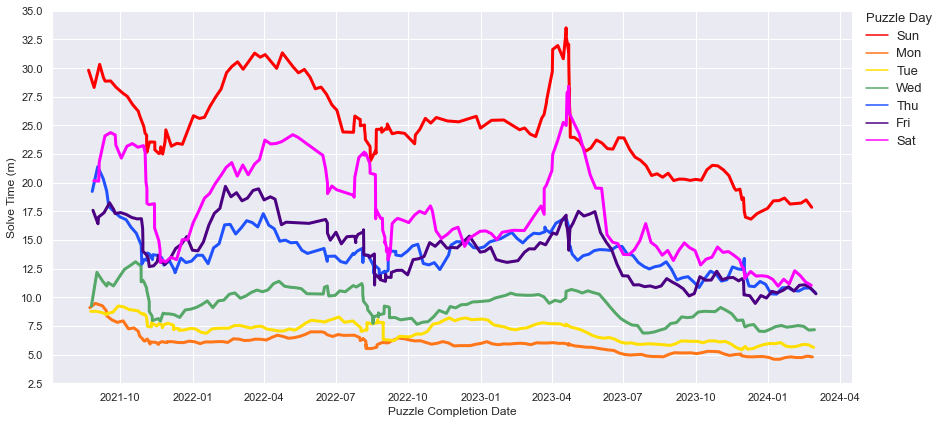

In [43]:
# Plot 10-puzzle moving average of IS1 Solve Times by Day of Week
#Fig. 2

sns.set(font_scale=1)

p = sns.relplot(
    data=df_IS1, marker = "", x="Comp_Date", y="IST(m)_10p_MA", hue="DOW", hue_order=["Sunday", "Monday", "Tuesday","Wednesday", "Thursday", "Friday", "Saturday"], height=6, aspect=2, palette = ["red", "#FF7518", "#ffdf00", "g", "#1F51FF", "indigo", "fuchsia"],
    kind="line", linewidth=3
).set(title="", 
    ylabel="Solve Time (m)",
    xlabel= "Puzzle Completion Date", yticks = [2.5, 5, 7.5, 10, 12.5, 15, 17.5, 20, 22.5, 25, 27.5, 30, 32.5, 35]
)

# Modify legend
leg = p._legend
leg.set_title("Puzzle Day")
leg.set_bbox_to_anchor([.89, .975])  # coordinates of lower left of bounding box
leg.get_title().set_fontsize(13)
leg._loc = 2  # if required you can set the loc
leg.get_texts()[0].set_fontsize(13)
leg.get_texts()[0].set_text('Sun')
leg.get_texts()[1].set_fontsize(13)
leg.get_texts()[1].set_text('Mon')
leg.get_texts()[2].set_fontsize(13)
leg.get_texts()[2].set_text('Tue')
leg.get_texts()[3].set_fontsize(13)
leg.get_texts()[3].set_text('Wed')
leg.get_texts()[4].set_fontsize(13)
leg.get_texts()[4].set_text('Thu')
leg.get_texts()[5].set_fontsize(13)
leg.get_texts()[5].set_text('Fri')
leg.get_texts()[6].set_fontsize(13)
leg.get_texts()[6].set_text('Sat')
leg._legend_box.align = "left"  # or left, or center

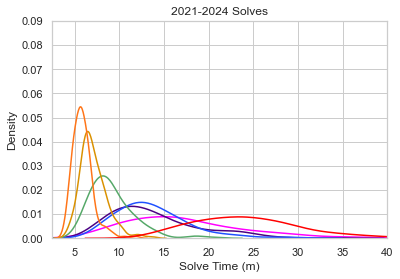

In [44]:
# Density Plot for Entire Sample Time Range (2021-2024)
# Figure 2

df_IS1['plot_seq_map'] = df_IS1['DOW_num'].map({1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5:'Thu', 6:'Fri', 7:'Sat'})

sns.set(style="whitegrid")
ax = sns.kdeplot(data=df_IS1, x = "IST(m)", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], hue_order=["Sun", "Mon", "Tue","Wed", "Thu", "Fri", "Sat"], legend=False)

#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(2.5, 40)
plt.ylim(0, .09)
plt.xticks([5,10,15,20,25,30,35,40])
plt.title('2021-2024 Solves')
ax.set_xlabel("Solve Time (m)")
plt.show()

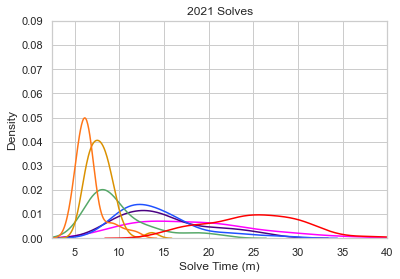

In [45]:
# Density Plot for 2021 Only 
# Figure 2
df1_2021 = df_IS1.loc[(df_IS1["Comp_Yr"] == "2021")]

df1_2021['plot_seq_map'] = df1_2021['DOW_num'].map({1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5:'Thu', 6:'Fri', 7:'Sat'})
sns.set(style="whitegrid")
ax = sns.kdeplot(data=df1_2021, x = "IST(m)", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], hue_order=["Sun", "Mon", "Tue","Wed", "Thu", "Fri", "Sat"], legend=False)

#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(2.5, 40)
plt.ylim(0, .09)
plt.xticks([5,10,15,20,25,30,35,40])
plt.title('2021 Solves')
ax.set_xlabel("Solve Time (m)")
plt.show()

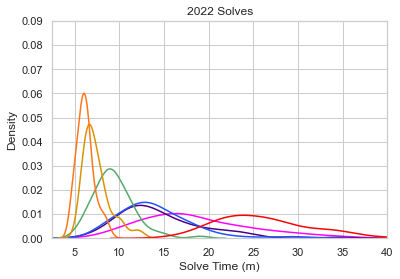

In [46]:
# Density Plot for 2022 Only 
# Figure 2
df1_2022 = df_IS1.loc[(df_IS1["Comp_Yr"] == "2022")]

df1_2022['plot_seq_map'] = df1_2022['DOW_num'].map({1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5:'Thu', 6:'Fri', 7:'Sat'})
sns.set(style="whitegrid")
ax = sns.kdeplot(data=df1_2022, x = "IST(m)", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], hue_order=["Sun", "Mon", "Tue","Wed", "Thu", "Fri", "Sat"], legend=False)

#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(2.5, 40)
plt.ylim(0, .09)
plt.xticks([5,10,15,20,25,30,35,40])
plt.title('2022 Solves')
ax.set_xlabel("Solve Time (m)")
plt.show()

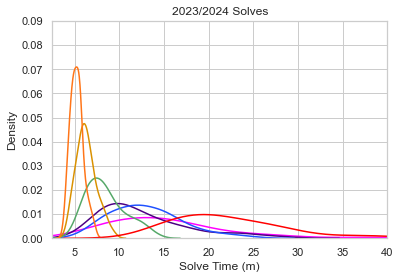

In [47]:
# Density Plot for 2023-2024 Only 
# Figure 2
df1_2023 = df_IS1.loc[(df_IS1["Comp_Yr"] == "2023") | (df_IS1["Comp_Yr"] == "2024")]

df1_2023['plot_seq_map'] = df1_2023['DOW_num'].map({1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5:'Thu', 6:'Fri', 7:'Sat'})
sns.set(style="whitegrid")
ax = sns.kdeplot(data=df1_2023, x = "IST(m)", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], hue_order=["Sun", "Mon", "Tue","Wed", "Thu", "Fri", "Sat"], legend=False)

#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(2.5, 40)
plt.ylim(0, .09)
plt.xticks([5,10,15,20,25,30,35,40])
plt.title('2023/2024 Solves')
ax.set_xlabel("Solve Time (m)")
plt.show()

In [48]:
#For obtaining final moving average values per day for Git summary
df_IS1 = df_IS1.sort_values(by=['Comp_Date'], ascending = False)
df_IS1[['DOW','IST(m)_10p_MA']].head(35)

,DOW,IST(m)_10p_MA
0,Friday,10.298333
1,Thursday,10.411667
2,Wednesday,7.173333
3,Tuesday,5.620000
4,Monday,4.795000
5,Sunday,17.848333
6,Saturday,11.043333
7,Friday,10.816667
8,Thursday,10.816667
9,Wednesday,7.135000


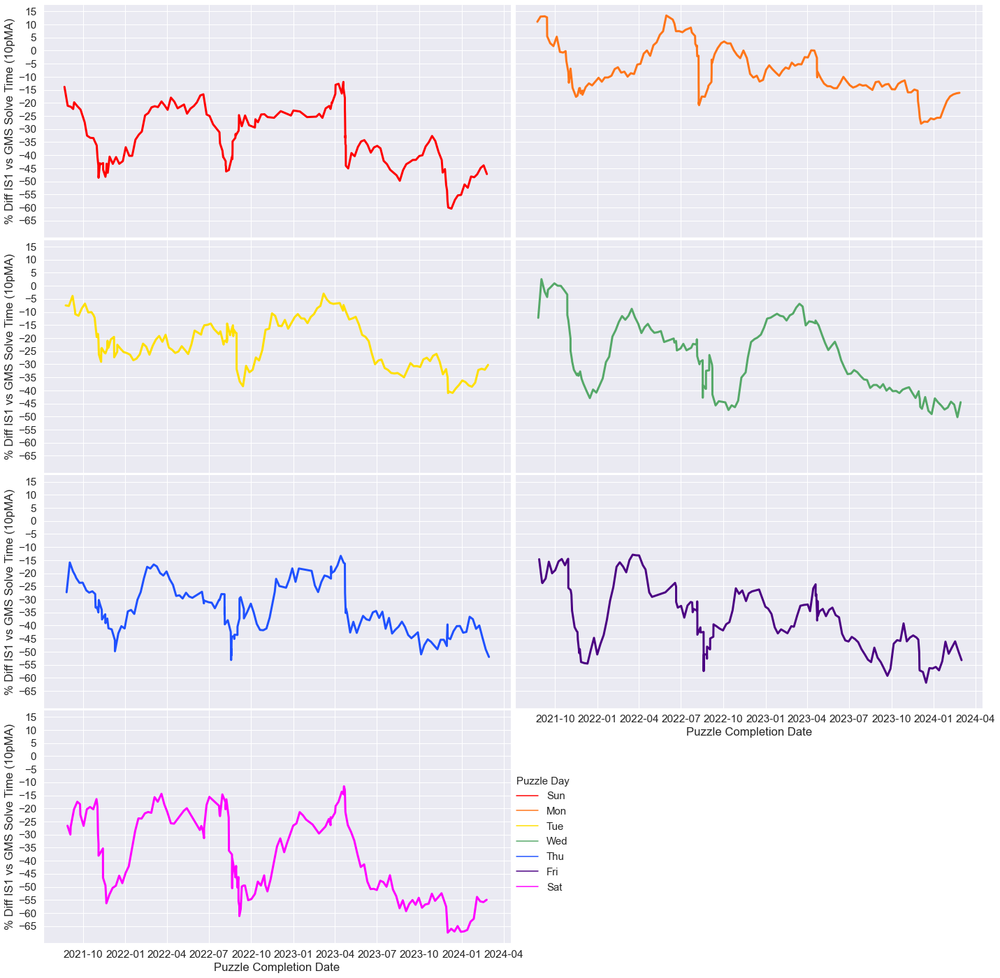

In [49]:
# Plot 10-puzzle moving average of % Difference in Individual Solve Times From Global Median Solve Times
# This normalizes for puzzle difficulty
# Figure S1

sns.set(font_scale=1.4)
#sns.set(rc={'axes.facecolor':'gray',"axes.grid":True,'xtick.labelsize':14,'ytick.labelsize':14})

p = sns.relplot(
    data=df_IS1, marker = "", x="Comp_Date", y="10pMA_of_IST_Diff%_from_GMST", hue="DOW", hue_order=["Sunday", "Monday", "Tuesday","Wednesday", "Thursday", "Friday", "Saturday"], height=5, aspect=2, palette = ["red", "#FF7518", "#ffdf00", "g", "#1F51FF", "indigo", "fuchsia"],
    kind="line", linewidth=3, col="DOW", col_wrap=2, col_order=["Sunday", "Monday", "Tuesday","Wednesday", "Thursday", "Friday", "Saturday"]
).set(title="", ylabel="% Diff IS1 vs GMS Solve Time (10pMA)",
    xlabel= "Puzzle Completion Date", yticks = [-65, -60, -55, -50, -45, -40, -35, -30, -25, -20, -15, -10, -5, 0, 5, 10, 15]
)

plt.subplots_adjust(wspace = 0.01) #decrease whitespace btwn subplot colums
plt.subplots_adjust(hspace = 0.01) #decrease whitespace btwn subplot rows

# # # Modify legend
leg = p._legend
leg.set_title("Puzzle Day")
leg.set_bbox_to_anchor([.46, .21])  # coordinates of lower left of bounding box
leg.get_title().set_fontsize(15)
leg._loc = 2  # if required you can set the loc
leg.get_texts()[0].set_fontsize(15)
leg.get_texts()[0].set_text('Sun')
leg.get_texts()[1].set_fontsize(15)
leg.get_texts()[1].set_text('Mon')
leg.get_texts()[2].set_fontsize(15)
leg.get_texts()[2].set_text('Tue')
leg.get_texts()[3].set_fontsize(15)
leg.get_texts()[3].set_text('Wed')
leg.get_texts()[4].set_fontsize(15)
leg.get_texts()[4].set_text('Thu')
leg.get_texts()[5].set_fontsize(15)
leg.get_texts()[5].set_text('Fri')
leg.get_texts()[6].set_fontsize(15)
leg.get_texts()[6].set_text('Sat')
leg._legend_box.align = "left"  # or left, or center

#title="10-Puzzle Moving Average of % Difference in Solve Times From Global Median Solve Times (Solver 1)", 

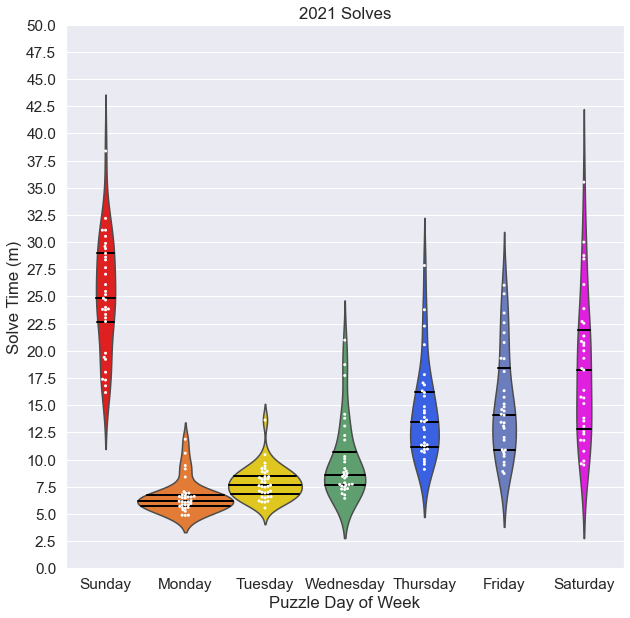

In [50]:
# Violin plots with swarm plot overlay by puzzle day 2021 solves only
# Figure 3

IS1_pre2022 = df_IS1.loc[df_IS1["Comp_Date_str"].str.contains("2021")]

plt.figure(figsize=(10,10))
sns.swarmplot(x="DOW" , y = "IST(m)",data=IS1_pre2022 , size=3.0 , order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], color="White")
ax = sns.violinplot(IS1_pre2022['DOW'], IS1_pre2022['IST(m)'], width = 1.2, inner = "quartile", order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], palette = ["red", "#FF7518", "#ffdf00", "g", "#1F51FF", "#5d76cb", "fuchsia"])
plt.ylim(0, 50)
plt.yticks([0, 2.5, 5, 7.5, 10, 12.5, 15, 17.5, 20, 22.5, 25, 27.5, 30, 32.5, 35, 37.5, 40, 42.5, 45, 47.5, 50])
ax.set_xlabel("Puzzle Day of Week")
ax.set_ylabel("Solve Time (m)")
ax.set_title("2021 Solves")

for l in ax.lines:
    l.set_linestyle('-')
    l.set_linewidth(2)
    l.set_color('black')
    l.set_alpha(1)
plt.show()

In [51]:
# Calculate Median and IQR per puzzle day, for 2021 solves
print(IS1_pre2022.loc[(IS1_pre2022["DOW"] == "Sunday"), "IST(m)"].describe().round(1))
print(IS1_pre2022.loc[(IS1_pre2022["DOW"] == "Monday"), "IST(m)"].describe().round(1))
print(IS1_pre2022.loc[(IS1_pre2022["DOW"] == "Tuesday"), "IST(m)"].describe().round(1))
print(IS1_pre2022.loc[(IS1_pre2022["DOW"] == "Wednesday"), "IST(m)"].describe().round(1))
print(IS1_pre2022.loc[(IS1_pre2022["DOW"] == "Thursday"), "IST(m)"].describe().round(1))
print(IS1_pre2022.loc[(IS1_pre2022["DOW"] == "Friday"), "IST(m)"].describe().round(1))
print(IS1_pre2022.loc[(IS1_pre2022["DOW"] == "Saturday"), "IST(m)"].describe().round(1))

count    33.0
mean     25.1
std       5.2
min      16.2
25%      22.7
50%      24.8
75%      29.0
max      38.4
Name: IST(m), dtype: float64
count    34.0
mean      6.6
std       1.6
min       4.9
25%       5.7
50%       6.2
75%       6.7
max      11.9
Name: IST(m), dtype: float64
count    36.0
mean      7.9
std       1.5
min       5.6
25%       6.8
50%       7.6
75%       8.5
max      13.6
Name: IST(m), dtype: float64
count    32.0
mean      9.9
std       3.7
min       6.4
25%       7.6
50%       8.5
75%      10.7
max      21.0
Name: IST(m), dtype: float64
count    32.0
mean     14.3
std       4.4
min       9.1
25%      11.2
50%      13.5
75%      16.2
max      27.8
Name: IST(m), dtype: float64
count    32.0
mean     15.1
std       4.9
min       8.7
25%      10.9
50%      14.1
75%      18.4
max      26.0
Name: IST(m), dtype: float64
count    31.0
mean     18.4
std       6.7
min       9.5
25%      12.8
50%      18.2
75%      22.0
max      35.5
Name: IST(m), dtype: float64


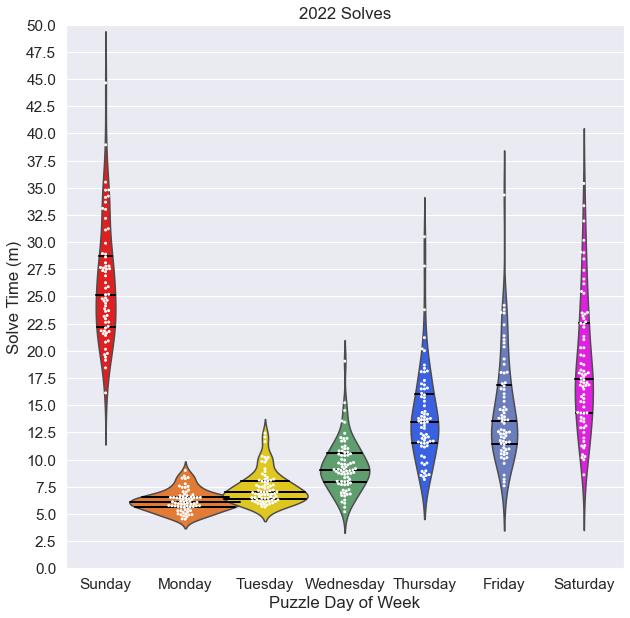

In [52]:
# Violin plots with swarm plot overlay by puzzle day -2022 solves only
#Figure 3

IS1_2022 = df_IS1.loc[df_IS1["Comp_Date_str"].str.contains("2022")]

plt.figure(figsize=(10,10))
sns.swarmplot(x="DOW" , y = "IST(m)",data=IS1_2022 , size=3.0 , order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], color="White")
ax = sns.violinplot(IS1_2022['DOW'], IS1_2022['IST(m)'], width = 1.4, inner = "quartile", order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], palette = ["red", "#FF7518", "#ffdf00", "g", "#1F51FF", "#5d76cb", "fuchsia"])
plt.ylim(0, 50)
plt.yticks([0, 2.5, 5, 7.5, 10, 12.5, 15, 17.5, 20, 22.5, 25, 27.5, 30, 32.5, 35, 37.5, 40, 42.5, 45, 47.5, 50])
ax.set_xlabel("Puzzle Day of Week")
ax.set_ylabel("Solve Time (m)")
ax.set_title("2022 Solves")

for l in ax.lines:
    l.set_linestyle('-')
    l.set_linewidth(2)
    l.set_color('black')
    l.set_alpha(1)
plt.show()

In [53]:
# Calculate Median and IQR per puzzle day, for 2022
print(IS1_2022.loc[(IS1_2022["DOW"] == "Sunday"), "IST(m)"].describe().round(1))
print(IS1_2022.loc[(IS1_2022["DOW"] == "Monday"), "IST(m)"].describe().round(1))
print(IS1_2022.loc[(IS1_2022["DOW"] == "Tuesday"), "IST(m)"].describe().round(1))
print(IS1_2022.loc[(IS1_2022["DOW"] == "Wednesday"), "IST(m)"].describe().round(1))
print(IS1_2022.loc[(IS1_2022["DOW"] == "Thursday"), "IST(m)"].describe().round(1))
print(IS1_2022.loc[(IS1_2022["DOW"] == "Friday"), "IST(m)"].describe().round(1))
print(IS1_2022.loc[(IS1_2022["DOW"] == "Saturday"), "IST(m)"].describe().round(1))

count    63.0
mean     26.3
std       5.4
min      16.1
25%      22.2
50%      25.2
75%      28.8
max      44.6
Name: IST(m), dtype: float64
count    70.0
mean      6.2
std       1.0
min       4.5
25%       5.7
50%       6.1
75%       6.6
max       9.0
Name: IST(m), dtype: float64
count    72.0
mean      7.4
std       1.5
min       5.6
25%       6.4
50%       7.0
75%       8.1
max      12.4
Name: IST(m), dtype: float64
count    76.0
mean      9.4
std       2.3
min       5.2
25%       7.9
50%       9.1
75%      10.6
max      19.0
Name: IST(m), dtype: float64
count    70.0
mean     14.0
std       4.3
min       8.2
25%      11.5
50%      13.5
75%      16.1
max      30.5
Name: IST(m), dtype: float64
count    68.0
mean     14.6
std       4.8
min       7.6
25%      11.5
50%      13.6
75%      16.8
max      34.3
Name: IST(m), dtype: float64
count    74.0
mean     18.6
std       6.0
min       8.6
25%      14.3
50%      17.4
75%      22.5
max      35.4
Name: IST(m), dtype: float64


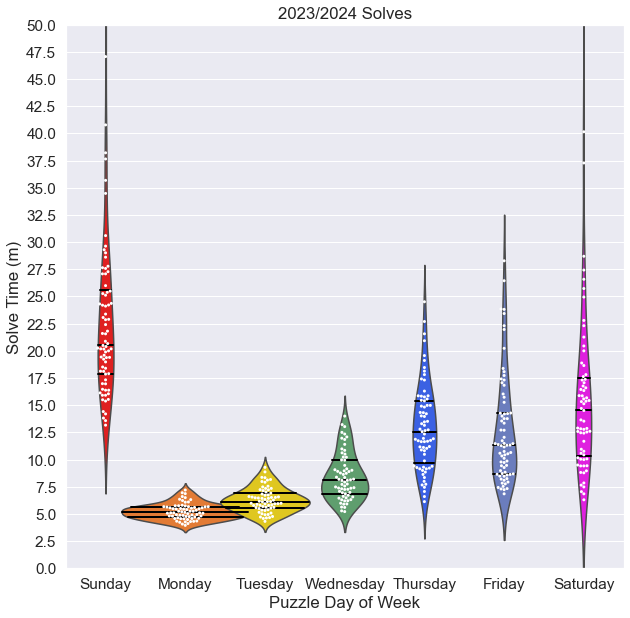

In [54]:
# Violin plots with swarm plot overlay by puzzle day -2023/4 only
# Figure 3

sns.set(font_scale=1.4)

IS1_2023 = df_IS1.loc[df_IS1["Comp_Date_str"].str.contains("2023") | df_IS1["Comp_Date_str"].str.contains("2024")]

plt.figure(figsize=(10,10))
sns.swarmplot(x="DOW" , y = "IST(m)",data=IS1_2023 , size=3.0 , order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], color="White")
ax = sns.violinplot(IS1_2023['DOW'], IS1_2023['IST(m)'], width = 1.6, inner = "quartile", order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], palette = ["red", "#FF7518", "#ffdf00", "g", "#1F51FF", "#5d76cb", "fuchsia"])
plt.ylim(0, 50)
plt.yticks([0, 2.5, 5, 7.5, 10, 12.5, 15, 17.5, 20, 22.5, 25, 27.5, 30, 32.5, 35, 37.5, 40, 42.5, 45, 47.5, 50])
ax.set_xlabel("Puzzle Day of Week")
ax.set_ylabel("Solve Time (m)")
ax.set_title("2023/2024 Solves")

for l in ax.lines:
    l.set_linestyle('-')
    l.set_linewidth(2)
    l.set_color('black')
    l.set_alpha(1)
plt.show()

In [55]:
# Calculate Median and IQR per puzzle day, for 2023/2024
print(IS1_2023.loc[(IS1_2023["DOW"] == "Sunday"), "IST(m)"].describe().round(1))
print(IS1_2023.loc[(IS1_2023["DOW"] == "Monday"), "IST(m)"].describe().round(1))
print(IS1_2023.loc[(IS1_2023["DOW"] == "Tuesday"), "IST(m)"].describe().round(1))
print(IS1_2023.loc[(IS1_2023["DOW"] == "Wednesday"), "IST(m)"].describe().round(1))
print(IS1_2023.loc[(IS1_2023["DOW"] == "Thursday"), "IST(m)"].describe().round(1))
print(IS1_2023.loc[(IS1_2023["DOW"] == "Friday"), "IST(m)"].describe().round(1))
print(IS1_2023.loc[(IS1_2023["DOW"] == "Saturday"), "IST(m)"].describe().round(1))

count    76.0
mean     22.8
std       7.5
min      13.2
25%      17.9
50%      20.6
75%      25.6
max      52.2
Name: IST(m), dtype: float64
count    68.0
mean      5.2
std       0.7
min       4.0
25%       4.7
50%       5.2
75%       5.7
max       7.2
Name: IST(m), dtype: float64
count    65.0
mean      6.3
std       1.1
min       4.3
25%       5.6
50%       6.1
75%       6.9
max       9.3
Name: IST(m), dtype: float64
count    65.0
mean      8.5
std       2.2
min       5.2
25%       6.8
50%       8.1
75%      10.0
max      14.0
Name: IST(m), dtype: float64
count    71.0
mean     13.0
std       4.0
min       6.1
25%       9.6
50%      12.6
75%      15.4
max      24.5
Name: IST(m), dtype: float64
count    73.0
mean     12.7
std       5.0
min       6.8
25%       8.7
50%      11.3
75%      14.3
max      28.3
Name: IST(m), dtype: float64
count    67.0
mean     15.8
std       8.3
min       6.3
25%      10.3
50%      14.5
75%      17.5
max      56.0
Name: IST(m), dtype: float64


### IS1 Performance vs Global Median Solver

In [56]:
# Create new df with all rows copied and placed below current rows. 
# This is so we can plot all data together as its own subplot 

df_IS1_copy = df_IS1.copy()
df_IS1_copy["DOW"] = "All"

df_IS1_v2 = pd.concat([df_IS1, df_IS1_copy],ignore_index=True)

In [57]:
# Construct numerical categories in desired plotting sequence for combinations of puzzle day and pre-2023 or 2023+
# This is a hack to be able to use lmplot with subplot split and get regression lines - need to figure out more elegant solution

# A numerical column for puzzle day that starts with Sunday and ends with Saturday
df_IS1_v2.loc[(df_IS1_v2["DOW"] == "All") & (df_IS1_v2["2023+_solve"] == 0) , "plot_seq"] = 1 
df_IS1_v2.loc[(df_IS1_v2["DOW"] == "All") & (df_IS1_v2["2023+_solve"] == 1) , "plot_seq"] = 2
df_IS1_v2.loc[(df_IS1_v2["DOW"] == "Sunday") & (df_IS1_v2["2023+_solve"] == 0) , "plot_seq"] = 3 
df_IS1_v2.loc[(df_IS1_v2["DOW"] == "Sunday") & (df_IS1_v2["2023+_solve"] == 1) , "plot_seq"] = 4
df_IS1_v2.loc[(df_IS1_v2["DOW"] == "Monday") & (df_IS1_v2["2023+_solve"] == 0) , "plot_seq"] = 5 
df_IS1_v2.loc[(df_IS1_v2["DOW"] == "Monday") & (df_IS1_v2["2023+_solve"] == 1) , "plot_seq"] = 6
df_IS1_v2.loc[(df_IS1_v2["DOW"] == "Tuesday") & (df_IS1_v2["2023+_solve"] == 0) , "plot_seq"] = 7 
df_IS1_v2.loc[(df_IS1_v2["DOW"] == "Tuesday") & (df_IS1_v2["2023+_solve"] == 1) , "plot_seq"] = 8
df_IS1_v2.loc[(df_IS1_v2["DOW"] == "Wednesday") & (df_IS1_v2["2023+_solve"] == 0) , "plot_seq"] = 9 
df_IS1_v2.loc[(df_IS1_v2["DOW"] == "Wednesday") & (df_IS1_v2["2023+_solve"] == 1) , "plot_seq"] = 10
df_IS1_v2.loc[(df_IS1_v2["DOW"] == "Thursday") & (df_IS1_v2["2023+_solve"] == 0) , "plot_seq"] = 11 
df_IS1_v2.loc[(df_IS1_v2["DOW"] == "Thursday") & (df_IS1_v2["2023+_solve"] == 1) , "plot_seq"] = 12
df_IS1_v2.loc[(df_IS1_v2["DOW"] == "Friday") & (df_IS1_v2["2023+_solve"] == 0) , "plot_seq"] = 13
df_IS1_v2.loc[(df_IS1_v2["DOW"] == "Friday") & (df_IS1_v2["2023+_solve"] == 1) , "plot_seq"] = 14
df_IS1_v2.loc[(df_IS1_v2["DOW"] == "Saturday") & (df_IS1_v2["2023+_solve"] == 0) , "plot_seq"] = 15 
df_IS1_v2.loc[(df_IS1_v2["DOW"] == "Saturday") & (df_IS1_v2["2023+_solve"] == 1) , "plot_seq"] = 16

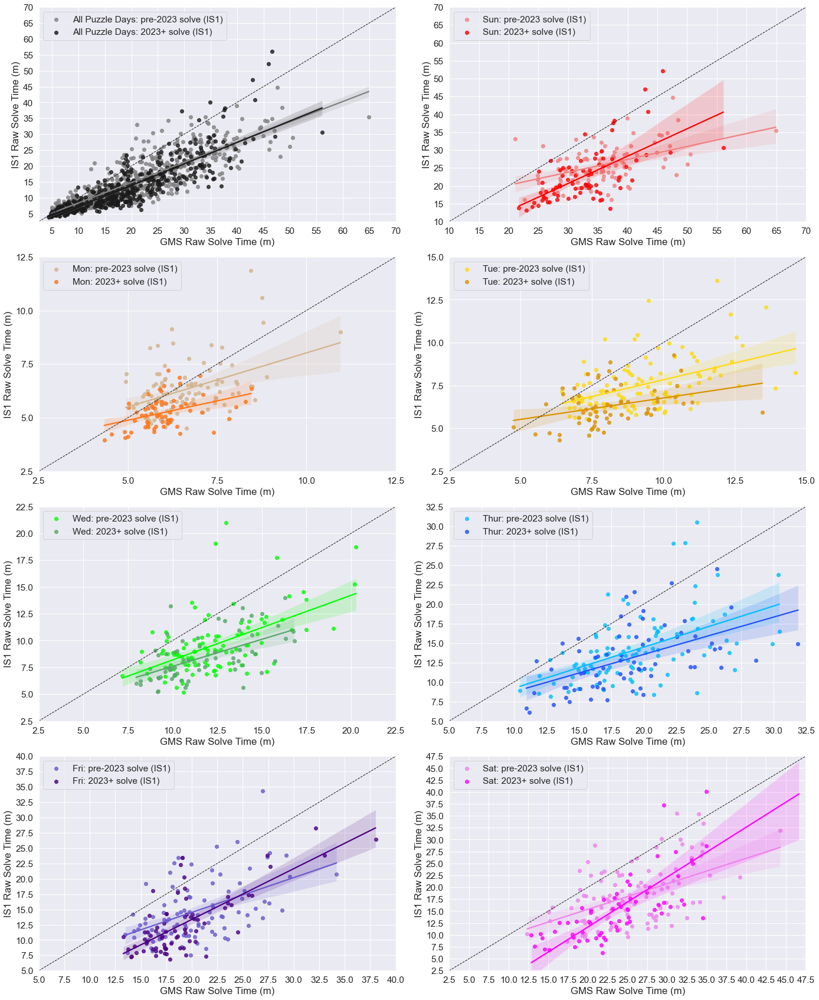

In [58]:
# Scatterplots of individual raw solve times vs global median solve times, per puzzle day
#Figure 4

df_IS1_v2 = df_IS1_v2.sort_values(by=['plot_seq'], ascending = True)

sns.set(font_scale=1.4)

df_IS1_v2['plot_seq_map'] = df_IS1_v2['plot_seq'].map({1: 'All Puzzle Days: pre-2023 solve (IS1)', 2: 'All Puzzle Days: 2023+ solve (IS1)', 3:'Sun: pre-2023 solve (IS1)', 4:'Sun: 2023+ solve (IS1)', 5:'Mon: pre-2023 solve (IS1)', 6:'Mon: 2023+ solve (IS1)', 7:'Tue: pre-2023 solve (IS1)', 8:'Tue: 2023+ solve (IS1)', 9:'Wed: pre-2023 solve (IS1)', 10:'Wed: 2023+ solve (IS1)', 11:'Thur: pre-2023 solve (IS1)', 12:'Thur: 2023+ solve (IS1)', 13:'Fri: pre-2023 solve (IS1)', 14:'Fri: 2023+ solve (IS1)', 15:'Sat: pre-2023 solve (IS1)', 16:'Sat: 2023+ solve (IS1)'})

#sequence = {0:'pre-2023 solve', 1:'2023 solve', 2:'pre-2023 solve', 3:'2023 solve', 4:'pre-2023 solve', 5:'2023 solve', 6:'pre-2023 solve', 7:'2023 solve', 8:'pre-2023 solve', 9:'2023 solve', 10:'pre-2023 solve', 11:'2023 solve', 12:'pre-2023 solve', 13:'2023 solve'}

p = sns.lmplot(
    data=df_IS1_v2, x="GMST(m)", y="IST(m)", hue="plot_seq_map", col="DOW", col_order=["All", "Sunday", "Monday", "Tuesday","Wednesday", "Thursday", "Friday", "Saturday"], col_wrap=2, palette=["grey", "k", "lightcoral", "red", "tan", "#FF7518", "#FDDA0D", "#da9100", "lime", "g", "deepskyblue", "#1F51FF", "slateblue", "indigo", "violet", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False
).set(title="", xlabel= "GMS Raw Solve Time (m)",
    ylabel="IS1 Raw Solve Time (m)", xticks = [2.5, 5, 7.5, 10, 12.5, 15, 17.5, 20, 22.5, 25, 27.5, 30, 32.5, 35, 37.5, 40, 42.5, 45, 47.5, 50, 52.5, 55, 57.5, 60], yticks = [2.5, 5, 7.5, 10, 12.5, 15, 17.5, 20, 22.5, 25, 27.5, 30, 32.5, 35, 37.5, 40, 42.5, 45, 47.5, 50, 52.5, 55, 57.5, 60]  
)

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

#Adjust subplots individually
p.axes[0].set_ylim((2.5,70))
p.axes[0].set_xlim((2.5,70))
p.axes[1].set_ylim((10,70))
p.axes[1].set_xlim((10,70))
p.axes[2].set_ylim((2.5,12.5))
p.axes[2].set_xlim((2.5,12.5))
p.axes[3].set_ylim((2.5,15))
p.axes[3].set_xlim((2.5,15))
p.axes[4].set_ylim((2.5,22.5))
p.axes[4].set_xlim((2.5,22.5))
p.axes[5].set_ylim((5,32.5))
p.axes[5].set_xlim((5,32.5))
p.axes[6].set_ylim((5, 40))
p.axes[6].set_xlim((5, 40))
p.axes[7].set_ylim((2.5, 47.5))
p.axes[7].set_xlim((2.5, 47.55))

p.axes[0].set_xticks((5,10,15,20,25,30,35,40,45,50,55,60,65,70))
p.axes[0].set_yticks((5,10,15,20,25,30,35,40,45,50,55,60,65,70))
p.axes[1].set_xticks((10,15,20,25,30,35,40,45,50,55,60,65,70))
p.axes[1].set_yticks((10,15,20,25,30,35,40,45,50,55,60,65,70))

p.axes[0].plot([2.5, 70], [2.5, 70], 'k', linestyle='dashed', linewidth=1)
p.axes[1].plot([10, 70], [10, 70], 'k', linestyle='dashed', linewidth=1)
p.axes[2].plot([2.5, 12.5], [2.5, 12.5], 'k', linestyle='dashed', linewidth=1)
p.axes[3].plot([2.5, 15], [2.5, 15], 'k', linestyle='dashed', linewidth=1)
p.axes[4].plot([2.5, 22.5], [2.5, 22.5], 'k', linestyle='dashed', linewidth=1)
p.axes[5].plot([5, 32.5], [5, 32.5], 'k', linestyle='dashed', linewidth=1)
p.axes[6].plot([5, 40], [5, 40], 'k', linestyle='dashed', linewidth=1)
p.axes[7].plot([2.5, 47.5], [2.5, 47.5], 'k', linestyle='dashed', linewidth=1)

_= p.axes[0].legend()
_= p.axes[1].legend()
_= p.axes[2].legend()
_= p.axes[3].legend()
_= p.axes[4].legend()
_= p.axes[5].legend()
_= p.axes[6].legend()
_= p.axes[7].legend()

In [59]:
# Correlations for pre-2023 for IST vs GMST
# Careful not to use _v2, since that version has duplicated data for plotting only
df_IS1_pre2023 = df_IS1.loc[(df_IS1["2023+_solve"] == 0)] #pre-2023 solves only
df_All = df_IS1_pre2023.copy() #all puzzle days
df_Sun = df_IS1_pre2023.loc[df_IS1_pre2023["DOW"]==("Sunday")]
df_Mon = df_IS1_pre2023.loc[df_IS1_pre2023["DOW"]==("Monday")]
df_Tue = df_IS1_pre2023.loc[df_IS1_pre2023["DOW"]==("Tuesday")]
df_Wed = df_IS1_pre2023.loc[df_IS1_pre2023["DOW"]==("Wednesday")]
df_Thu = df_IS1_pre2023.loc[df_IS1_pre2023["DOW"]==("Thursday")]
df_Fri = df_IS1_pre2023.loc[df_IS1_pre2023["DOW"]==("Friday")]
df_Sat = df_IS1_pre2023.loc[df_IS1_pre2023["DOW"]==("Saturday")]

print(df_All['IST(m)'].corr(df_All['GMST(m)']))
print(df_Sun['IST(m)'].corr(df_Sun['GMST(m)']))
print(df_Mon['IST(m)'].corr(df_Mon['GMST(m)']))
print(df_Tue['IST(m)'].corr(df_Tue['GMST(m)']))
print(df_Wed['IST(m)'].corr(df_Wed['GMST(m)']))
print(df_Thu['IST(m)'].corr(df_Thu['GMST(m)']))
print(df_Fri['IST(m)'].corr(df_Fri['GMST(m)']))
print(df_Sat['IST(m)'].corr(df_Sat['GMST(m)']))

0.8708540937788052
0.48287604223120356
0.42231976732144166
0.45080653397236986
0.5468294383764816
0.5126321136858961
0.48249780312114043
0.4910588651616659


In [60]:
# Correlations for 2023_24 for IST vs GMST
# Careful not to use _v2, since that version has duplicated data for plotting only
df_IS1_2023_24 = df_IS1.loc[(df_IS1["2023+_solve"] == 1)] #2023-2024 solves only
df_All = df_IS1_2023_24.copy() #all puzzle days
df_Sun = df_IS1_2023_24.loc[df_IS1_2023_24["DOW"]==("Sunday")]
df_Mon = df_IS1_2023_24.loc[df_IS1_2023_24["DOW"]==("Monday")]
df_Tue = df_IS1_2023_24.loc[df_IS1_2023_24["DOW"]==("Tuesday")]
df_Wed = df_IS1_2023_24.loc[df_IS1_2023_24["DOW"]==("Wednesday")]
df_Thu = df_IS1_2023_24.loc[df_IS1_2023_24["DOW"]==("Thursday")]
df_Fri = df_IS1_2023_24.loc[df_IS1_2023_24["DOW"]==("Friday")]
df_Sat = df_IS1_2023_24.loc[df_IS1_2023_24["DOW"]==("Saturday")]

print(df_All['IST(m)'].corr(df_All['GMST(m)']))
print(df_Sun['IST(m)'].corr(df_Sun['GMST(m)']))
print(df_Mon['IST(m)'].corr(df_Mon['GMST(m)']))
print(df_Tue['IST(m)'].corr(df_Tue['GMST(m)']))
print(df_Wed['IST(m)'].corr(df_Wed['GMST(m)']))
print(df_Thu['IST(m)'].corr(df_Thu['GMST(m)']))
print(df_Fri['IST(m)'].corr(df_Fri['GMST(m)']))
print(df_Sat['IST(m)'].corr(df_Sat['GMST(m)']))

0.870240111831527
0.6317568633028915
0.39711425297568337
0.33134806259494737
0.5648926724360894
0.5210809873906133
0.7391786930067885
0.7886747715547031


In [61]:
# IS1 vs GMS by Puzzle Day: pre-2023 solves
# Careful not to use _v2, since that version has duplicated data for plotting only

IST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["IST(m)"] < df_IS1["GMST(m)"])])
GMST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["IST(m)"] > df_IS1["GMST(m)"])])
Ties = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["IST(m)"] == df_IS1["GMST(m)"])])
All_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(All_IST_win_pct)

IST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Sunday") & (df_IS1["IST(m)"] < df_IS1["GMST(m)"])])
GMST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Sunday") & (df_IS1["IST(m)"] > df_IS1["GMST(m)"])])
Ties = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Sunday") & (df_IS1["IST(m)"] == df_IS1["GMST(m)"])])
Sun_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Sun_IST_win_pct)

IST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Monday") & (df_IS1["IST(m)"] < df_IS1["GMST(m)"])])
GMST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Monday") & (df_IS1["IST(m)"] > df_IS1["GMST(m)"])])
Ties = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Monday") & (df_IS1["IST(m)"] == df_IS1["GMST(m)"])])
Mon_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Mon_IST_win_pct)

IST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Tuesday") & (df_IS1["IST(m)"] < df_IS1["GMST(m)"])])
GMST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Tuesday") & (df_IS1["IST(m)"] > df_IS1["GMST(m)"])])
Ties = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Tuesday") & (df_IS1["IST(m)"] == df_IS1["GMST(m)"])])
Tue_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Tue_IST_win_pct)

IST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Wednesday") & (df_IS1["IST(m)"] < df_IS1["GMST(m)"])])
GMST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Wednesday") & (df_IS1["IST(m)"] > df_IS1["GMST(m)"])])
Ties = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Wednesday") & (df_IS1["IST(m)"] == df_IS1["GMST(m)"])])
Wed_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Wed_IST_win_pct)

IST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Thursday") & (df_IS1["IST(m)"] < df_IS1["GMST(m)"])])
GMST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Thursday") & (df_IS1["IST(m)"] > df_IS1["GMST(m)"])])
Ties = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Thursday") & (df_IS1["IST(m)"] == df_IS1["GMST(m)"])])
Thu_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Thu_IST_win_pct)

IST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Friday") & (df_IS1["IST(m)"] < df_IS1["GMST(m)"])])
GMST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Friday") & (df_IS1["IST(m)"] > df_IS1["GMST(m)"])])
Ties = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Friday") & (df_IS1["IST(m)"] == df_IS1["GMST(m)"])])
Fri_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Fri_IST_win_pct)

IST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Saturday") & (df_IS1["IST(m)"] < df_IS1["GMST(m)"])])
GMST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Saturday") & (df_IS1["IST(m)"] > df_IS1["GMST(m)"])])
Ties = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Saturday") & (df_IS1["IST(m)"] == df_IS1["GMST(m)"])])
Sat_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Sat_IST_win_pct)

86.72199170124482
96.875
63.46153846153846
88.88888888888889
87.96296296296296
91.17647058823529
90.0
89.52380952380953


In [62]:
# Win % for IS1 vs GMS by Puzzle Day: 2023_2024 solves
# Careful not to use _v2, since that version has duplicated data for plotting only

IST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["IST(m)"] < df_IS1["GMST(m)"])])
GMST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["IST(m)"] > df_IS1["GMST(m)"])])
Ties = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["IST(m)"] == df_IS1["GMST(m)"])])
All_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(All_IST_win_pct)

IST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Sunday") & (df_IS1["IST(m)"] < df_IS1["GMST(m)"])])
GMST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Sunday") & (df_IS1["IST(m)"] > df_IS1["GMST(m)"])])
Ties = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Sunday") & (df_IS1["IST(m)"] == df_IS1["GMST(m)"])])
Sun_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Sun_IST_win_pct)

IST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Monday") & (df_IS1["IST(m)"] < df_IS1["GMST(m)"])])
GMST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Monday") & (df_IS1["IST(m)"] > df_IS1["GMST(m)"])])
Ties = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Monday") & (df_IS1["IST(m)"] == df_IS1["GMST(m)"])])
Mon_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Mon_IST_win_pct)

IST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Tuesday") & (df_IS1["IST(m)"] < df_IS1["GMST(m)"])])
GMST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Tuesday") & (df_IS1["IST(m)"] > df_IS1["GMST(m)"])])
Ties = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Tuesday") & (df_IS1["IST(m)"] == df_IS1["GMST(m)"])])
Tue_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Tue_IST_win_pct)

IST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Wednesday") & (df_IS1["IST(m)"] < df_IS1["GMST(m)"])])
GMST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Wednesday") & (df_IS1["IST(m)"] > df_IS1["GMST(m)"])])
Ties = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Wednesday") & (df_IS1["IST(m)"] == df_IS1["GMST(m)"])])
Wed_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Wed_IST_win_pct)

IST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Thursday") & (df_IS1["IST(m)"] < df_IS1["GMST(m)"])])
GMST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Thursday") & (df_IS1["IST(m)"] > df_IS1["GMST(m)"])])
Ties = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Thursday") & (df_IS1["IST(m)"] == df_IS1["GMST(m)"])])
Thu_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Thu_IST_win_pct)

IST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Friday") & (df_IS1["IST(m)"] < df_IS1["GMST(m)"])])
GMST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Friday") & (df_IS1["IST(m)"] > df_IS1["GMST(m)"])])
Ties = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Friday") & (df_IS1["IST(m)"] == df_IS1["GMST(m)"])])
Fri_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Fri_IST_win_pct)

IST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Saturday") & (df_IS1["IST(m)"] < df_IS1["GMST(m)"])])
GMST_wins = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Saturday") & (df_IS1["IST(m)"] > df_IS1["GMST(m)"])])
Ties = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Saturday") & (df_IS1["IST(m)"] == df_IS1["GMST(m)"])])
Sat_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Sat_IST_win_pct)


91.1340206185567
92.10526315789474
85.29411764705883
84.61538461538461
95.38461538461539
90.14084507042254
94.52054794520548
95.52238805970148


In [63]:
# Mean difference for raw IST vs GMST pre2023 
# Careful not to use _v2, since that version has duplicated data for plotting only

df_IS1['IST_raw_Diff_GMST'] = (df_IS1['IST(m)'] - df_IS1['GMST(m)'])

print(df_IS1.loc[(df_IS1["2023+_solve"] == 0), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Sunday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Monday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Tuesday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Wednesday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Thursday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Friday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Saturday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))

          mean
           std
mean -4.608506
std   5.201312
          mean
           std
mean -9.839583
std   6.569228
          mean
           std
mean -0.319712
std   1.209805
          mean
           std
mean -1.779630
std   1.735395
          mean
           std
mean -2.701852
std   2.524555
          mean
           std
mean -5.201961
std   4.163437
          mean
           std
mean -5.687333
std   4.556284
          mean
           std
mean -7.340635
std   5.996178


In [64]:
# Mean difference for raw IST vs GMST 2023_2024 
# Careful not to use _v2, since that version has duplicated data for plotting only
#df_IS1['IST_raw_Diff_GMST'] = (df_IS1['IST(m)'] - df_IS1['GMST(m)'])

print(df_IS1.loc[(df_IS1["2023+_solve"] == 1), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Sunday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Monday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Tuesday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Wednesday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Thursday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Friday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Saturday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))

          mean
           std
mean -5.319038
std   4.921669
          mean
           std
mean -9.996491
std   5.961012
          mean
           std
mean -0.764461
std   0.836863
          mean
           std
mean -1.812564
std   1.523591
          mean
           std
mean -3.265128
std   2.153156
          mean
           std
mean -5.857512
std   4.072448
          mean
           std
mean -6.513242
std   3.454110
          mean
           std
mean -8.158458
std   5.127195


In [63]:
#df_IS1 = df_IS1.drop(["IST_raw_Diff_GMST"], axis=1, inplace=True)

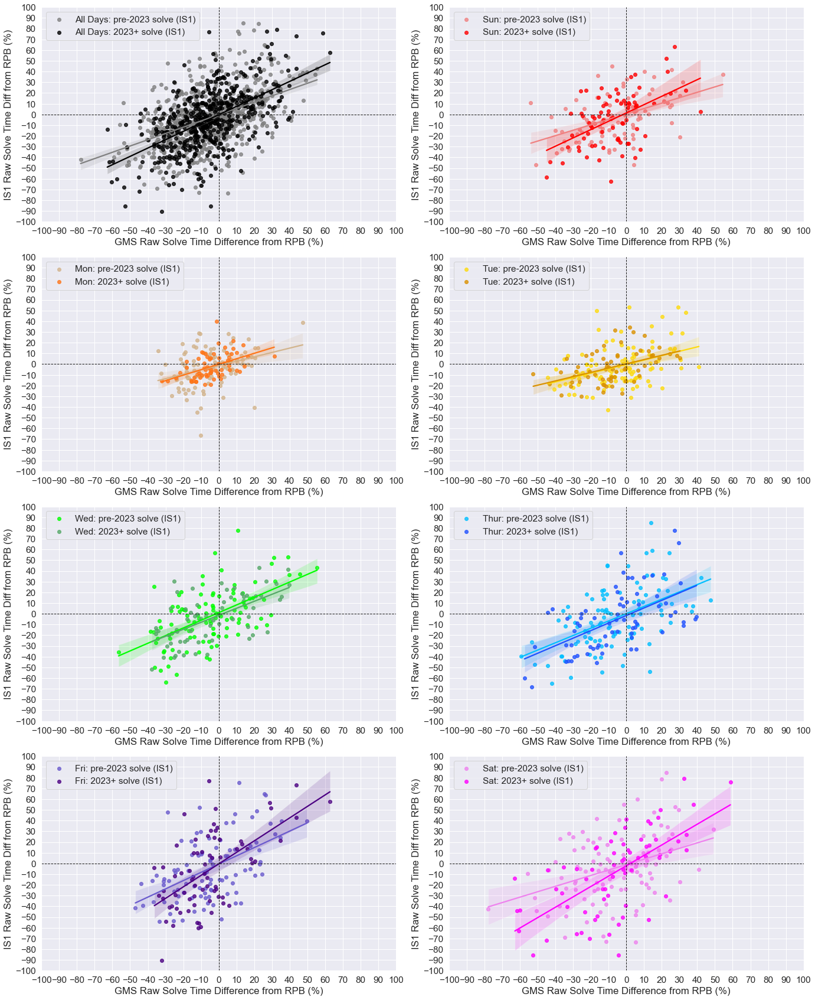

In [71]:
# Scatterplots of difference from time-decay weighted previous 20-puzzle average for individual solver for a given solve vs same for global median solver, per puzzle day
# This isolates RELATIVE performance for the individual solver on a given puzzle vs their recent performance, and how that relative performance compares to that for the median solver
# Figure 5

df_IS1_v2 = df_IS1_v2.sort_values(by=['plot_seq'], ascending = True)

sns.set(font_scale=1.4)

df_IS1_v2['plot_seq_map'] = df_IS1_v2['plot_seq'].map({1: 'All Days: pre-2023 solve (IS1)', 2: 'All Days: 2023+ solve (IS1)', 3:'Sun: pre-2023 solve (IS1)', 4:'Sun: 2023+ solve (IS1)', 5:'Mon: pre-2023 solve (IS1)', 6:'Mon: 2023+ solve (IS1)', 7:'Tue: pre-2023 solve (IS1)', 8:'Tue: 2023+ solve (IS1)', 9:'Wed: pre-2023 solve (IS1)', 10:'Wed: 2023+ solve (IS1)', 11:'Thur: pre-2023 solve (IS1)', 12:'Thur: 2023+ solve (IS1)', 13:'Fri: pre-2023 solve (IS1)', 14:'Fri: 2023+ solve (IS1)', 15:'Sat: pre-2023 solve (IS1)', 16:'Sat: 2023+ solve (IS1)'})

#sequence = {0:'pre-2023 solve', 1:'2023 solve', 2:'pre-2023 solve', 3:'2023 solve', 4:'pre-2023 solve', 5:'2023 solve', 6:'pre-2023 solve', 7:'2023 solve', 8:'pre-2023 solve', 9:'2023 solve', 10:'pre-2023 solve', 11:'2023 solve', 12:'pre-2023 solve', 13:'2023 solve'}

p = sns.lmplot(
    data=df_IS1_v2, x="GMST_Diff%_from_GMS_pds_l40_dw", y="IST_Diff%_from_IS_pds_l8_ndw", hue="plot_seq_map", col="DOW", col_order=["All", "Sunday", "Monday", "Tuesday","Wednesday", "Thursday", "Friday", "Saturday"], col_wrap=2, palette=["grey","black","lightcoral", "red", "tan", "#FF7518", "#FDDA0D", "#da9100", "lime", "g", "deepskyblue", "#1F51FF", "slateblue", "indigo", "violet", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False
).set(title="", xlabel= "GMS Raw Solve Time Difference from RPB (%)",
    ylabel="IS1 Raw Solve Time Diff from RPB (%)", xticks = [-100,-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90,100], yticks = [-100,-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90,100]  
)

#Adjust subplots individually
p.axes[0].set_ylim((-100,100))
p.axes[0].set_xlim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[1].set_xlim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[2].set_xlim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[3].set_xlim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[4].set_xlim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[5].set_xlim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[6].set_xlim((-100,100))
p.axes[7].set_ylim((-100,100))
p.axes[7].set_xlim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

p.axes[0].plot([0, 0], [-100, 100], 'k', linestyle='dashed', linewidth=1)
p.axes[0].plot([-100, 100], [0, 0], 'k', linestyle='dashed', linewidth=1)
p.axes[1].plot([0, 0], [-100, 100], 'k', linestyle='dashed', linewidth=1)
p.axes[1].plot([-100, 100], [0, 0], 'k', linestyle='dashed', linewidth=1)
p.axes[2].plot([0, 0], [-100, 100], 'k', linestyle='dashed', linewidth=1)
p.axes[2].plot([-100, 100], [0, 0], 'k', linestyle='dashed', linewidth=1)
p.axes[3].plot([0, 0], [-100, 100], 'k', linestyle='dashed', linewidth=1)
p.axes[3].plot([-100, 100], [0, 0], 'k', linestyle='dashed', linewidth=1)
p.axes[4].plot([0, 0], [-100, 100], 'k', linestyle='dashed', linewidth=1)
p.axes[4].plot([-100, 100], [0, 0], 'k', linestyle='dashed', linewidth=1)
p.axes[5].plot([0, 0], [-100, 100], 'k', linestyle='dashed', linewidth=1)
p.axes[5].plot([-100, 100], [0, 0], 'k', linestyle='dashed', linewidth=1)
p.axes[6].plot([0, 0], [-100, 100], 'k', linestyle='dashed', linewidth=1)
p.axes[6].plot([-100, 100], [0, 0], 'k', linestyle='dashed', linewidth=1)
p.axes[7].plot([0, 0], [-100, 100], 'k', linestyle='dashed', linewidth=1)
p.axes[7].plot([-100, 100], [0, 0], 'k', linestyle='dashed', linewidth=1)

_= p.axes[0].legend(loc = 'upper left')
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [72]:
df_IS1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1208 entries, 0 to 936
Data columns (total 49 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   P_Date                          1208 non-null   datetime64[ns]
 1   P_Date_str                      1208 non-null   object        
 2   P_Yr                            1208 non-null   period[A-DEC] 
 3   2023+_puzzle                    1208 non-null   float64       
 4   DOW                             1208 non-null   object        
 5   DOW_num                         1208 non-null   float64       
 6   GMST(m)                         1208 non-null   float64       
 7   GMST(m)_10p_MA                  1208 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA      1208 non-null   int64         
 9   GMS_pds_l40_dw                  1208 non-null   float64       
 10  GMST_Diff%_from_GMS_pds_l40_dw  1208 non-null   float64       
 11  Comp_

In [73]:
#Quadrant Analysis pre-2023 (note: very very rare exact zero difference puzzles are ignored for this calculation)
# Careful not to use _v2, since that version has duplicated data for plotting only

Upper_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Sunday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Sunday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Sunday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Sunday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Monday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Monday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Monday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Monday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Tuesday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Tuesday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Tuesday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Tuesday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Wednesday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Wednesday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Wednesday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Wednesday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Thursday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Thursday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Thursday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Thursday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Friday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Friday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Friday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Friday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Saturday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Saturday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Saturday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Saturday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

42.877094972067034 23.18435754189944 18.01675977653631 15.921787709497206
44.21052631578947 29.47368421052631 14.736842105263156 11.578947368421053
41.74757281553398 20.388349514563107 22.330097087378643 15.53398058252427
42.99065420560748 22.429906542056074 14.018691588785046 20.5607476635514
42.99065420560748 22.429906542056074 21.49532710280374 13.084112149532709
42.57425742574257 25.742574257425744 17.82178217821782 13.861386138613863
46.464646464646464 22.22222222222222 16.161616161616163 15.151515151515152
39.42307692307692 20.192307692307693 19.230769230769234 21.153846153846153


In [74]:
#Quadrant Analysis 2023+ (note: very very rare exact zero difference puzzles are ignored for this calculation)

# Careful not to use _v2, since that version has duplicated data for plotting only

Upper_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Sunday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Sunday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Sunday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Sunday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Monday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Monday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Monday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Monday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Tuesday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Tuesday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Tuesday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Tuesday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Wednesday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Wednesday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Wednesday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Wednesday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Thursday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Thursday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Thursday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Thursday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Friday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Friday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Friday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Friday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Saturday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Saturday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Saturday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] > 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Saturday") & (df_IS1["IST_Diff%_from_IS_pds_l8_ndw"] < 0) & (df_IS1["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

49.072164948453604 23.711340206185564 17.7319587628866 9.484536082474227
47.368421052631575 22.36842105263158 22.36842105263158 7.894736842105263
47.05882352941176 19.11764705882353 20.588235294117645 13.23529411764706
53.84615384615385 21.53846153846154 18.461538461538463 6.153846153846154
47.69230769230769 30.76923076923077 10.76923076923077 10.76923076923077
45.07042253521127 21.12676056338028 14.084507042253522 19.718309859154928
53.42465753424658 20.54794520547945 21.91780821917808 4.10958904109589
49.25373134328358 31.343283582089555 14.925373134328357 4.477611940298507


In [75]:
# Correlation analysis pre-2023
# Careful not to use _v2, since that version has duplicated data for plotting only

All_pre2023 = df_IS1.loc[(df_IS1["2023+_solve"]==0)]
print(All_pre2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(All_pre2023['IST_Diff%_from_IS_pds_l8_ndw']))

Sun_pre2023 = df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Sunday")]
print(Sun_pre2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Sun_pre2023['IST_Diff%_from_IS_pds_l8_ndw']))

Mon_pre2023 = df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Monday")]
print(Mon_pre2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Mon_pre2023['IST_Diff%_from_IS_pds_l8_ndw']))

Tue_pre2023 = df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Tuesday")]
print(Tue_pre2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Tue_pre2023['IST_Diff%_from_IS_pds_l8_ndw']))

Wed_pre2023 = df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Wednesday")]
print(Wed_pre2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Wed_pre2023['IST_Diff%_from_IS_pds_l8_ndw']))

Thu_pre2023 = df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Thursday")]
print(Thu_pre2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Thu_pre2023['IST_Diff%_from_IS_pds_l8_ndw']))

Fri_pre2023 = df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Friday")]
print(Fri_pre2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Fri_pre2023['IST_Diff%_from_IS_pds_l8_ndw']))

Sat_pre2023 = df_IS1.loc[(df_IS1["2023+_solve"] == 0) & (df_IS1["DOW"] == "Saturday")]
print(Sat_pre2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Sat_pre2023['IST_Diff%_from_IS_pds_l8_ndw']))

0.46442799099069265
0.4935630723097696
0.3344586897787517
0.40590144819803686
0.5740477935427984
0.5180442628585213
0.5183001698706
0.36739418583566036


In [76]:
# Correlation analysis 2023+
# Careful not to use _v2, since that version has duplicated data for plotting only

All_2023 = df_IS1.loc[(df_IS1["2023+_solve"]==1)]
print(All_2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(All_2023['IST_Diff%_from_IS_pds_l8_ndw']))

Sun_2023 = df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Sunday")]
print(Sun_2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Sun_2023['IST_Diff%_from_IS_pds_l8_ndw']))

Mon_2023 = df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Monday")]
print(Mon_2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Mon_2023['IST_Diff%_from_IS_pds_l8_ndw']))

Tue_2023 = df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Tuesday")]
print(Tue_2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Tue_2023['IST_Diff%_from_IS_pds_l8_ndw']))

Wed_2023 = df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Wednesday")]
print(Wed_2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Wed_2023['IST_Diff%_from_IS_pds_l8_ndw']))

Thu_2023 = df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Thursday")]
print(Thu_2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Thu_2023['IST_Diff%_from_IS_pds_l8_ndw']))

Fri_2023 = df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Friday")]
print(Fri_2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Fri_2023['IST_Diff%_from_IS_pds_l8_ndw']))

Sat_2023 = df_IS1.loc[(df_IS1["2023+_solve"] == 1) & (df_IS1["DOW"] == "Saturday")]
print(Sat_2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Sat_2023['IST_Diff%_from_IS_pds_l8_ndw']))

0.5673426684612298
0.5158993446957881
0.4790427759666665
0.45701239159381873
0.6127274400982807
0.5675148647827122
0.5893956905561683
0.6501443838992865


### Constructor Analysis
Which constructors does individual solver 1 (IS1) struggle against? Which ones does IS1 do well against? This analysis is with respect to average deviation for solve performance on given puzzle from recent (time-weighted) performance per constructor/constructor team (aligns with what we have available for the global median solver). 

In [81]:
# Get stats for Individual Solver
constructor_avgs_IS = df_IS1.groupby(['Constructors'])['IST_Diff%_from_IS_pds_l8_ndw'].agg(constructor_mean_IS=(np.mean), puzzle_count_IS=(np.count_nonzero))
constructor_avgs_IS["constructor_mean_IS"] = constructor_avgs_IS["constructor_mean_IS"].round(2)

#Get stats for Global Mean Solver
constructor_avgs_GMT = df_IS1.groupby(['Constructors'])['GMST_Diff%_from_GMS_pds_l40_dw'].agg(constructor_mean_GMS=(np.mean), puzzle_count_GMS=(np.count_nonzero))
constructor_avgs_GMT["constructor_mean_GMS"] = constructor_avgs_GMT["constructor_mean_GMS"].round(2)

#Merge Individual and Global Mean stats into single df
constructor_avgs = constructor_avgs_IS.merge(constructor_avgs_GMT, on='Constructors', how='inner')

puzzle_min_threshold = 4 #min number of puzzles in sample for constructor/constructor team to be kept in the analysis 

# Pare down to only constructor(s) with at least n puzzles for which IS1 has completed
constructor_avgs_filter = constructor_avgs.loc[constructor_avgs['puzzle_count_IS'] >= puzzle_min_threshold] 

In [82]:
constructor_avgs_filter.head(35)

,constructor_mean_IS,puzzle_count_IS,constructor_mean_GMS,puzzle_count_GMS
Constructors,,,,
Aaron M. Rosenberg,-5.18,4.0,0.81,4.0
Adam Aaronson,-14.02,7.0,-18.59,7.0
Adam Wagner,1.50,15.0,-3.36,15.0
Adrian Johnson,22.78,5.0,-8.16,5.0
Aimee Lucido,-28.20,5.0,-12.02,5.0
Alex Eaton-Salners,16.17,9.0,9.67,9.0
Andrea Carla Michaels and Kevin Christian,-7.87,4.0,-4.70,4.0
Barbara Lin,-3.20,8.0,-5.72,8.0
Billy Bratton,-16.24,5.0,-23.24,5.0


In [83]:
constructor_avgs_filter.info()

<class 'pandas.core.frame.DataFrame'>
Index: 78 entries, Aaron M. Rosenberg to Zhouqin Burnikel
Data columns (total 4 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   constructor_mean_IS   78 non-null     float64
 1   puzzle_count_IS       78 non-null     float64
 2   constructor_mean_GMS  78 non-null     float64
 3   puzzle_count_GMS      78 non-null     float64
dtypes: float64(4)
memory usage: 3.0+ KB


In [80]:
constructor_avgs_filter.to_csv('../data/constructor_avgs_filter.csv', index=True)

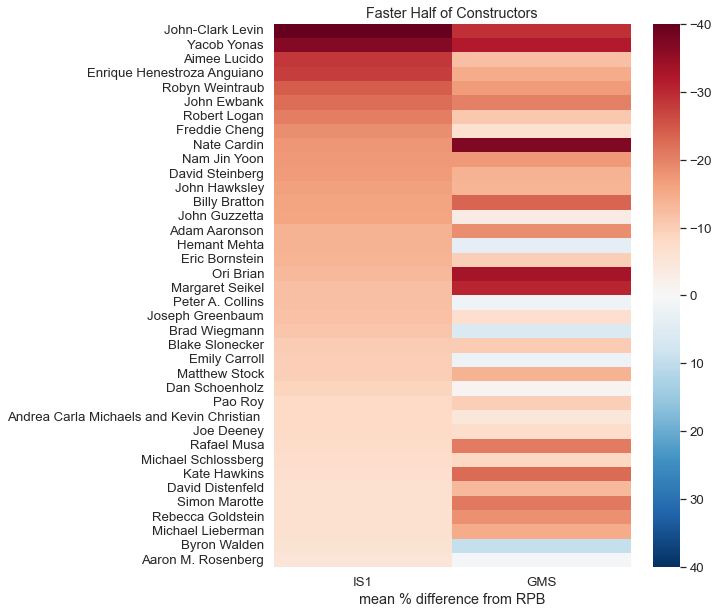

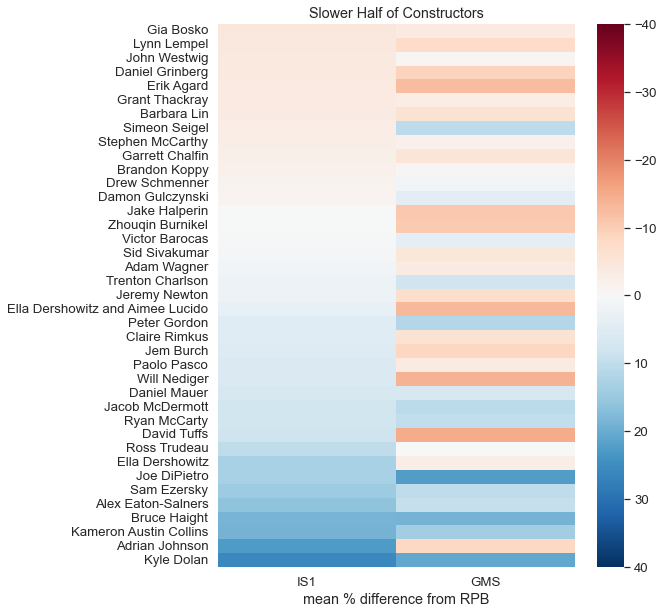

In [87]:
# Construct Heat Map, sorted by fastest to slowest for IS1
# Fig. 6

#Remove puzzle ns columns and sort for heatmapping
avgs = constructor_avgs_filter[["constructor_mean_IS", "constructor_mean_GMS"]]
avgs = avgs.sort_values(by=['constructor_mean_IS'], ascending = True)

first_half_end = int((len(avgs)/2)-1)
avgs_end = int(len(avgs))
first_half = avgs[0:first_half_end]
second_half = avgs[(first_half_end+1):avgs_end]

first_half = first_half.sort_values(by=['constructor_mean_IS'], ascending = True)
plt.figure(figsize=(8,10))
sns.set(font_scale=1.2)
ax = sns.heatmap(first_half, xticklabels=['IS1', 'GMS'], cmap="RdBu", vmin=-40, vmax=40, yticklabels=True)
plt.gcf().axes[1].invert_yaxis() #flip color bar to show fastest at the top
plt.xlabel('mean % difference from RPB')
plt.ylabel('')
plt.title("Faster Half of Constructors")
plt.show()

second_half = second_half.sort_values(by=['constructor_mean_IS'], ascending = True)
plt.figure(figsize=(8,10))
sns.set(font_scale=1.2)
ax2 = sns.heatmap(second_half, xticklabels=['IS1', 'GMS'], cmap="RdBu", vmin=-40, vmax=40, yticklabels=True)
plt.gcf().axes[1].invert_yaxis() #flip color bar to show fastest at the top
plt.xlabel('mean % difference from RPB')
plt.ylabel('')
plt.title("Slower Half of Constructors")
plt.show()

In [88]:
print(constructor_avgs_filter[["constructor_mean_IS"]].agg(['min', 'max']))
print(constructor_avgs_filter[["constructor_mean_GMS"]].agg(['min', 'max']))

     constructor_mean_IS
min               -41.49
max                25.71
     constructor_mean_GMS
min                -37.17
max                 22.41


In [89]:
# Calculate past performance (using COMP date to sort) for IS1 against a given constructor (% difference from RPB) for each puzzle in sample
# Individual Solver mean past performance versus a given constructor(s), per puzzle. 
# This is calculated off of deviation from 8-RPB, so that it can be collapsed across puzzle days
# Getting the count as well will allow filtering by past number of puzzles for a second version of the figure

df_IS1 = df_IS1.sort_values(by=['Constructors','Comp_Date'], ascending = False)

df_IS1 = df_IS1.iloc[::-1]
df_IS1['IS_per_constr_avg_past_diff_from_RPB'] = df_IS1.groupby(['Constructors'])['IST_Diff%_from_IS_pds_l8_ndw'].transform(lambda x: x.rolling(window=100, min_periods = 1).mean().round(2).shift(1))
df_IS1['IS_per_constr_past_diff_from_RPB_ct'] = df_IS1.groupby(['Constructors'])['IST_Diff%_from_IS_pds_l8_ndw'].transform(lambda x: x.rolling(window=100, min_periods = 1).count().shift(1))
df_IS1 = df_IS1.iloc[::-1]

# col = df_IS1.pop('GMS_per_constr_avg_past_diff_from_10pMA')
# df_IS1.insert(17, col.name, col)

In [90]:
# Checkpoint
df_IS1.to_csv('../data/df_IS1.csv', index=False)

In [91]:
# Create df that includes only puzzles with Constructor(s) where there are >=3 prior puzzles by them
df_IS1_filter = df_IS1.loc[(df_IS1["IS_per_constr_past_diff_from_RPB_ct"] >= 3)]
df_IS1_filter.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 253 entries, 1026 to 234
Data columns (total 51 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   P_Date                                253 non-null    datetime64[ns]
 1   P_Date_str                            253 non-null    object        
 2   P_Yr                                  253 non-null    period[A-DEC] 
 3   2023+_puzzle                          253 non-null    float64       
 4   DOW                                   253 non-null    object        
 5   DOW_num                               253 non-null    float64       
 6   GMST(m)                               253 non-null    float64       
 7   GMST(m)_10p_MA                        253 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA            253 non-null    int64         
 9   GMS_pds_l40_dw                        253 non-null    float64       
 10 

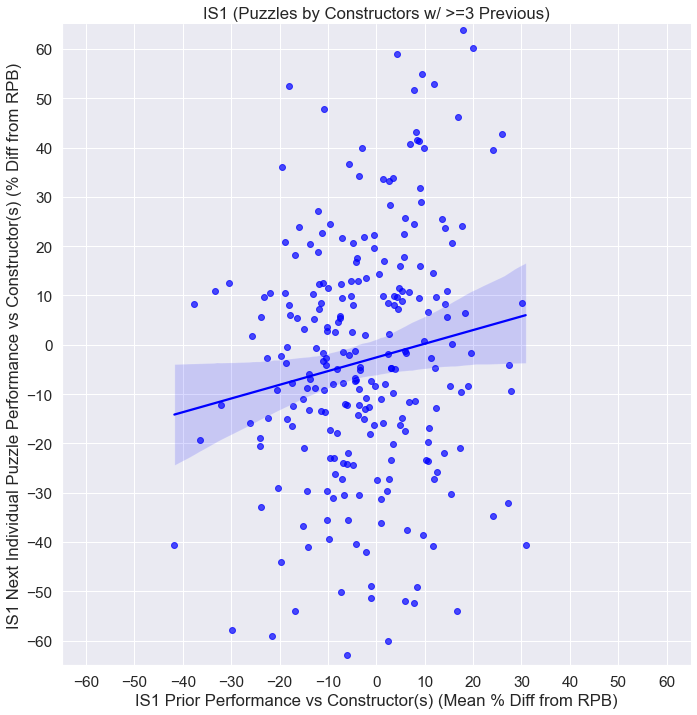

In [92]:
# Idea here is to get correlation between past performance vs a given constructor and performance on a given puzzle, in a way that is normalized for both puzzle day difficulty and recent past performance
# Fig. 7

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=df_IS1_filter, x="IS_per_constr_avg_past_diff_from_RPB", y="IST_Diff%_from_IS_pds_l8_ndw",
    height=10, aspect=1, legend=False, scatter_kws = {"color": "blue", "alpha": 0.7}, line_kws = {"color": "blue"}
).set(title="IS1 (Puzzles by Constructors w/ >=3 Previous)", xlabel= "IS1 Prior Performance vs Constructor(s) (Mean % Diff from RPB)",
    ylabel="IS1 Next Individual Puzzle Performance vs Constructor(s) (% Diff from RPB)", xticks =[-60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60], yticks =[-60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60]
)

# #Adjust subplots individually
_= p.set(ylim=(-65, 65))
_= p.set(xlim=(-65, 65))

In [93]:
# Correlation Calculation (Pearson r)
print(df_IS1_filter['IS_per_constr_avg_past_diff_from_RPB'].corr(df_IS1_filter['IST_Diff%_from_IS_pds_l8_ndw']))

0.1322620304246874


In [94]:
# Calculate past performance (using PUZZLE ISSUE date to sort) for GMS against a given constructor (% difference from RPB) for each puzzle in sample
# GMS mean past performance versus a given constructor(s), per puzzle. 
# This is calculated off of deviation from DTW last 20-puzzle moving average, so that it can be collapsed across puzzle days
# Getting the count as well will allow filtering by past number of puzzles for a second version of the figure
#Important reminder that 'GMST_Diff%_from_GMS_pds_l20_dw' was calculated per puzzle BEFORE stripping down to only IS1 solves (and sorting using puzzle issue date)

df_IS1 = df_IS1.sort_values(by=['Constructors','P_Date'], ascending = False)

df_IS1 = df_IS1.iloc[::-1]
df_IS1['GMS_per_constr_avg_past_diff_from_RPB'] = df_IS1.groupby(['Constructors'])['GMST_Diff%_from_GMS_pds_l40_dw'].transform(lambda x: x.rolling(window=100, min_periods = 1).mean().round(2).shift(1))
df_IS1['GMS_per_constr_past_diff_from_RPB_ct'] = df_IS1.groupby(['Constructors'])['GMST_Diff%_from_GMS_pds_l40_dw'].transform(lambda x: x.rolling(window=100, min_periods = 1).count().shift(1))
df_IS1 = df_IS1.iloc[::-1]

# col = df_IS1.pop('GMS_per_constr_avg_past_diff_from_10pMA')
# df_IS1.insert(17, col.name, col)

In [95]:
# Create df that includes only puzzles with Constructor(s) where there are >=3 prior puzzles by them
df_IS1_filter = df_IS1.loc[(df_IS1["GMS_per_constr_past_diff_from_RPB_ct"] >= 3)]
df_IS1_filter.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 257 entries, 759 to 234
Data columns (total 53 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 257 non-null    datetime64[ns]
 1   P_Date_str                             257 non-null    object        
 2   P_Yr                                   257 non-null    period[A-DEC] 
 3   2023+_puzzle                           257 non-null    float64       
 4   DOW                                    257 non-null    object        
 5   DOW_num                                257 non-null    float64       
 6   GMST(m)                                257 non-null    float64       
 7   GMST(m)_10p_MA                         257 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA             257 non-null    int64         
 9   GMS_pds_l40_dw                         257 non-null    float64 

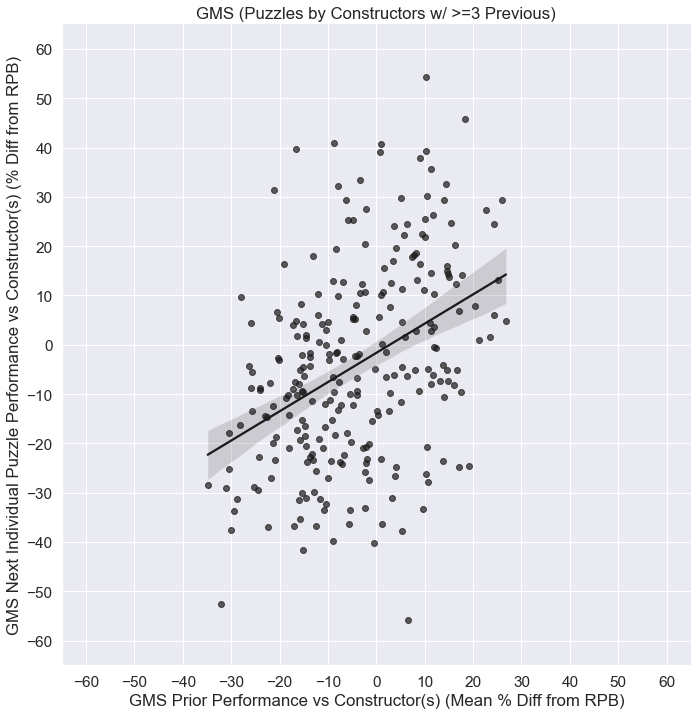

In [96]:
# Idea here is to get correlation between past performance vs a given constructor and performance on a given puzzle, in a way that is normalized for both puzzle day difficulty and recent past performance
# Fig. 7

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=df_IS1_filter, x="GMS_per_constr_avg_past_diff_from_RPB", y="GMST_Diff%_from_GMS_pds_l40_dw",
    height=10, aspect=1, legend=False, scatter_kws = {"color": "k", "alpha": 0.7}, line_kws = {"color": "k"}
).set(title="GMS (Puzzles by Constructors w/ >=3 Previous)", xlabel= "GMS Prior Performance vs Constructor(s) (Mean % Diff from RPB)",
    ylabel="GMS Next Individual Puzzle Performance vs Constructor(s) (% Diff from RPB)", xticks =[-60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60], yticks =[-60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60]
)

# #Adjust subplots individually
_= p.set(ylim=(-65, 65))
_= p.set(xlim=(-65, 65))

In [97]:
# Correlation Calculation (Pearson r)
print(df_IS1_filter['GMS_per_constr_avg_past_diff_from_RPB'].corr(df_IS1_filter['GMST_Diff%_from_GMS_pds_l40_dw']))

0.40168562787406664


### Completion Time of Day Analysis

In [98]:
IS1_df2 = df_IS1.copy()

In [99]:
#Creates a column where Individual Solver completion timestamps are binned to the hour in 24-hour cycle
IS1_df2['Comp_Hr'] = IS1_df2['Comp_Date'].dt.hour
IS1_df2['Comp_Hr'].value_counts()
IS1_df2['Comp_Hr']= IS1_df2['Comp_Hr'].astype('int64')
IS1_df2 = IS1_df2.sort_values('Comp_Hr')

In [100]:
IS1_df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1208 entries, 287 to 204
Data columns (total 54 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 1208 non-null   datetime64[ns]
 1   P_Date_str                             1208 non-null   object        
 2   P_Yr                                   1208 non-null   period[A-DEC] 
 3   2023+_puzzle                           1208 non-null   float64       
 4   DOW                                    1208 non-null   object        
 5   DOW_num                                1208 non-null   float64       
 6   GMST(m)                                1208 non-null   float64       
 7   GMST(m)_10p_MA                         1208 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA             1208 non-null   int64         
 9   GMS_pds_l40_dw                         1208 non-null   float64

In [101]:
col = IS1_df2.pop('Comp_Hr')
IS1_df2.insert(9, col.name, col)

In [102]:
# Construct numerical categories in desired plotting sequence for combinations of puzzle day and pre-2023 or 2023+

IS1_df2.loc[(IS1_df2["DOW"] == "Sunday") & (IS1_df2["2023+_solve"] == 0) , "plot_seq"] = 1 
IS1_df2.loc[(IS1_df2["DOW"] == "Sunday") & (IS1_df2["2023+_solve"] == 1) , "plot_seq"] = 2
IS1_df2.loc[(IS1_df2["DOW"] == "Monday") & (IS1_df2["2023+_solve"] == 0) , "plot_seq"] = 3 
IS1_df2.loc[(IS1_df2["DOW"] == "Monday") & (IS1_df2["2023+_solve"] == 1) , "plot_seq"] = 4
IS1_df2.loc[(IS1_df2["DOW"] == "Tuesday") & (IS1_df2["2023+_solve"] == 0) , "plot_seq"] = 5 
IS1_df2.loc[(IS1_df2["DOW"] == "Tuesday") & (IS1_df2["2023+_solve"] == 1) , "plot_seq"] = 6
IS1_df2.loc[(IS1_df2["DOW"] == "Wednesday") & (IS1_df2["2023+_solve"] == 0) , "plot_seq"] = 7 
IS1_df2.loc[(IS1_df2["DOW"] == "Wednesday") & (IS1_df2["2023+_solve"] == 1) , "plot_seq"] = 8
IS1_df2.loc[(IS1_df2["DOW"] == "Thursday") & (IS1_df2["2023+_solve"] == 0) , "plot_seq"] = 9 
IS1_df2.loc[(IS1_df2["DOW"] == "Thursday") & (IS1_df2["2023+_solve"] == 1) , "plot_seq"] = 10
IS1_df2.loc[(IS1_df2["DOW"] == "Friday") & (IS1_df2["2023+_solve"] == 0) , "plot_seq"] = 11 
IS1_df2.loc[(IS1_df2["DOW"] == "Friday") & (IS1_df2["2023+_solve"] == 1) , "plot_seq"] = 12
IS1_df2.loc[(IS1_df2["DOW"] == "Saturday") & (IS1_df2["2023+_solve"] == 0) , "plot_seq"] = 13 
IS1_df2.loc[(IS1_df2["DOW"] == "Saturday") & (IS1_df2["2023+_solve"] == 1) , "plot_seq"] = 14

In [103]:
# For subplot collapsed across puzzle days for puzzle completions by hour of day, make a copy of all data, label it '0' and concatenate with
#main df

IS1_df2_copy = IS1_df2.copy()
IS1_df2_copy["DOW_num"] = 0

IS1_df2a = pd.concat([IS1_df2, IS1_df2_copy],ignore_index=True)

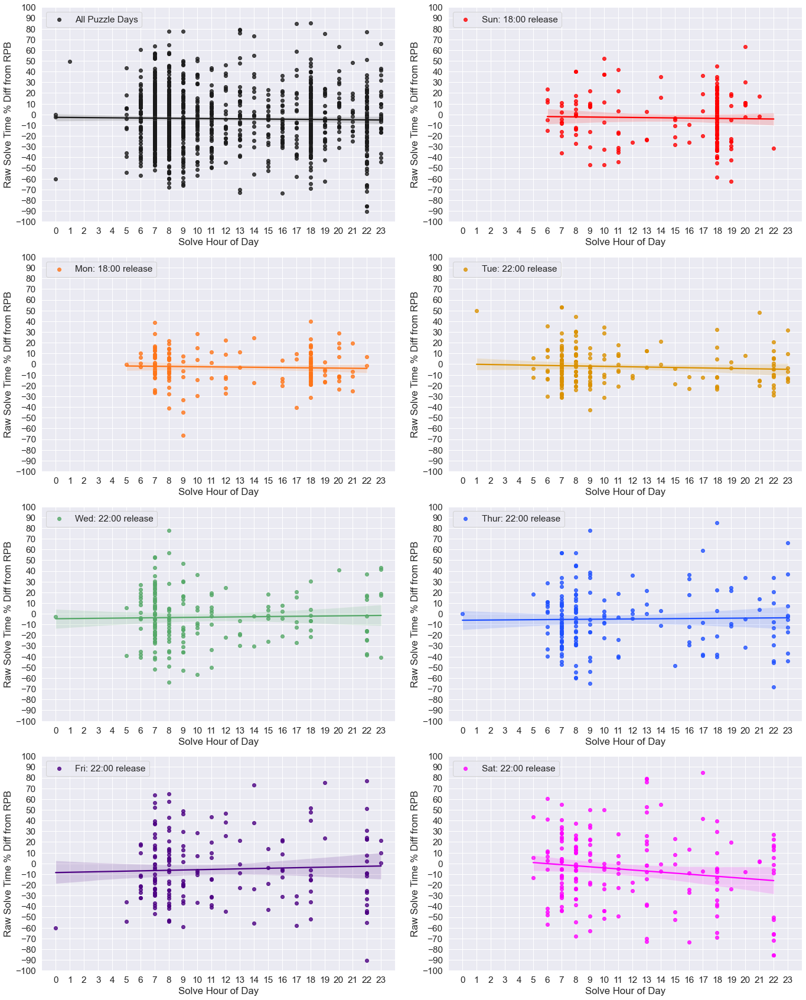

In [104]:
# Individual Solver 1 (IS1) Puzzle Completions by Solve Hour
# Fig. 8

IS1_df2a = IS1_df2a.sort_values(by=['DOW_num'], ascending = True)

IS1_df2a['plot_seq_map'] = IS1_df2a['DOW_num'].map({0: 'All Puzzle Days', 1:'Sun: 18:00 release', 2:'Mon: 18:00 release', 3:'Tue: 22:00 release', 4:'Wed: 22:00 release', 5: 'Thur: 22:00 release', 6:'Fri: 22:00 release', 7:'Sat: 22:00 release'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df2a, x="Comp_Hr", y="IST_Diff%_from_IS_pds_l8_ndw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], col_wrap=2, palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False
).set(title="", xlabel= "Solve Hour of Day",
    ylabel="Raw Solve Time % Diff from RPB", yticks = [-100,-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90,100], xticks = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]  
)

#Adjust subplots individually
p.axes[0].set_ylim((-100,100))
p.axes[0].set_xlim((-1,24))
p.axes[1].set_ylim((-100,100))
p.axes[1].set_xlim((-1,24))
p.axes[2].set_ylim((-100,100))
p.axes[2].set_xlim((-1,24))
p.axes[3].set_ylim((-100,100))
p.axes[3].set_xlim((-1,24))
p.axes[4].set_ylim((-100,100))
p.axes[4].set_xlim((-1,24))
p.axes[5].set_ylim((-100,100))
p.axes[5].set_xlim((-1,24))
p.axes[6].set_ylim((-100,100))
p.axes[6].set_xlim((-1,24))
p.axes[7].set_ylim((-100,100))
p.axes[7].set_xlim((-1,24))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

IS1_df2a.drop(['plot_seq_map'], axis=1, inplace=True)

In [105]:
#counts of common hours for puzzle completion for IS1
print(len(IS1_df2.loc[(IS1_df2["Comp_Hr"] >= 0)])) #all solves (denominator)
print(len(IS1_df2.loc[(IS1_df2["Comp_Hr"] >= 18)])) #evening solves
print(len(IS1_df2.loc[(IS1_df2["Comp_Hr"] >= 21)])) #late evening solves
print(len(IS1_df2.loc[(IS1_df2["Comp_Hr"] >= 7) & (IS1_df2["Comp_Hr"] <= 8)])) #early morning solves

1208
343
116
436


In [106]:
print(len(IS1_df2.loc[(IS1_df2["Comp_Hr"] >= 6) & (IS1_df2["Comp_Hr"] <= 10)])) #morning solves
print(len(IS1_df2.loc[(IS1_df2["Comp_Hr"] >= 18) & (IS1_df2["Comp_Hr"] <= 22)])) #evening solves

646
318


In [107]:
#compare very fast solves in 2200 hour with very fast solves across entire cycle
print(len(IS1_df2.loc[(IS1_df2["Comp_Hr"] == 22)]))
print(len(IS1_df2.loc[(IS1_df2["Comp_Hr"] != 22)]))

print(len(IS1_df2.loc[(IS1_df2["Comp_Hr"] == 22) & (IS1_df2["IST_Diff%_from_IS_pds_l8_ndw"] <= -50)]))
print(len(IS1_df2.loc[(IS1_df2["Comp_Hr"] != 22) & (IS1_df2["IST_Diff%_from_IS_pds_l8_ndw"] <= -50)]))

77
1131
10
32


### Correlation of Puzzle, Answer and Past Performance Feature Parameters to Individual IS1 Puzzle Solve Times 

In [108]:
# Make a deep copy of individual solver df
IS1_df3 = IS1_df2.copy()

In [109]:
IS1_df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1208 entries, 287 to 204
Data columns (total 55 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 1208 non-null   datetime64[ns]
 1   P_Date_str                             1208 non-null   object        
 2   P_Yr                                   1208 non-null   period[A-DEC] 
 3   2023+_puzzle                           1208 non-null   float64       
 4   DOW                                    1208 non-null   object        
 5   DOW_num                                1208 non-null   float64       
 6   GMST(m)                                1208 non-null   float64       
 7   GMST(m)_10p_MA                         1208 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA             1208 non-null   int64         
 9   Comp_Hr                                1208 non-null   int64  

In [109]:
# Create new df with all rows copied and placed below current rows. 
# This is so we can plot all 15x15 data together as a subplot in the feature correlation scatterplot figures 

# IS1_df3_copy = IS1_df3.loc[(IS1_df3["DOW_num"] != 1)] #15x15 only
# IS1_df3_copy["DOW_num"] = 0

# IS1_df3a = pd.concat([IS1_df3, IS1_df3_copy],ignore_index=True)

In [110]:
#IS1_df3a.to_csv('../data/IS1_df3a.csv', index=False)

In [110]:
# Restricting time range to beginning of 2022 onward to minimize baseline solve time (RPB) shift effects on correlations to puzzle features

IS1_df4 = IS1_df3.loc[(IS1_df3["Comp_Yr"]==("2022")) | (IS1_df3["Comp_Yr"]==("2023")) | (IS1_df3["Comp_Yr"]==("2024"))]

# #print(df_IS1.loc[df_IS1["Comp_Yr"]==("2021"), "IST(m)"].sum())

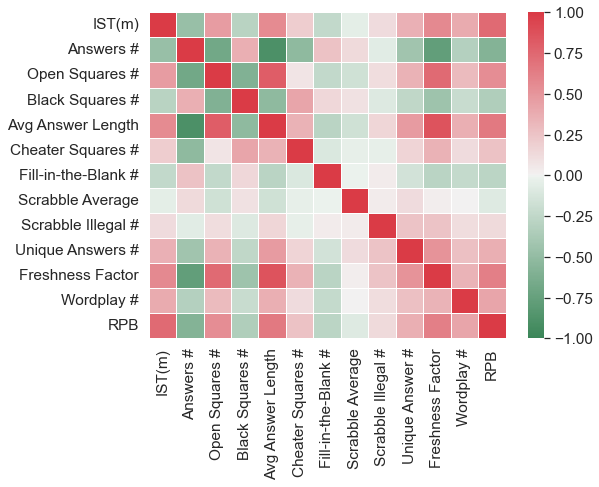

In [111]:
# 15x15 Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map
# Fig. 9

IS1_15x15 = IS1_df4.loc[IS1_df4["DOW"]!=("Sunday")]
puzzle_features = IS1_15x15[["IST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "IS_pds_l8_ndw"]]

corr = puzzle_features.corr()

labels = {
'IST(m)':'IST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',     
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill-in-the-Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay':'Wordplay #',
'IS_pds_l8_ndw': 'RPB'
}

corr = corr.rename(labels)

# remove the top right triangle - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['IST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill-in-the-Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #','RPB'])
#_= ans.set_yticklabels(['IST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Average Answer Length', 'Rebus #', 'Cheater Squares #', 'Fill in the Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Recent Adj Perf', 'Past Perf vs Constructor(s)'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

In [112]:
IS1_15x15.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 839 entries, 287 to 204
Data columns (total 55 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 839 non-null    datetime64[ns]
 1   P_Date_str                             839 non-null    object        
 2   P_Yr                                   839 non-null    period[A-DEC] 
 3   2023+_puzzle                           839 non-null    float64       
 4   DOW                                    839 non-null    object        
 5   DOW_num                                839 non-null    float64       
 6   GMST(m)                                839 non-null    float64       
 7   GMST(m)_10p_MA                         839 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA             839 non-null    int64         
 9   Comp_Hr                                839 non-null    int64   

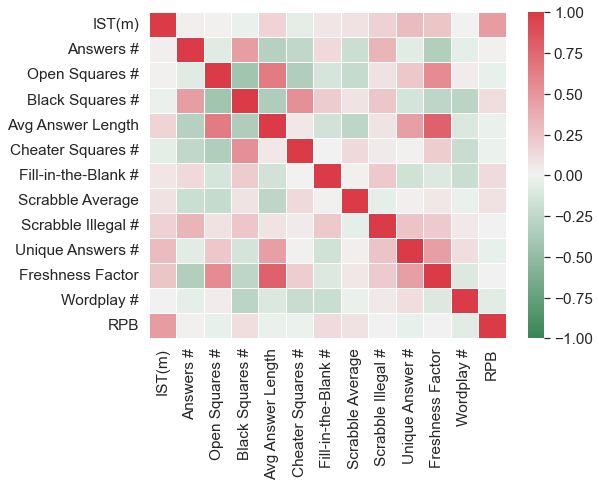

In [113]:
# 21x21 (Sunday) Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map
# Fig. 9

IS1_21x21 = IS1_df4.loc[IS1_df4["DOW"]==("Sunday")]
puzzle_features = IS1_21x21[["IST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "IS_pds_l8_ndw"]]

corr = puzzle_features.corr()

labels = {
'IST(m)':'IST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',     
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill-in-the-Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay':'Wordplay #',
'IS_pds_l8_ndw': 'RPB'    
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['IST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill-in-the-Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

In [115]:
IS1_21x21.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 138 entries, 447 to 650
Data columns (total 55 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 138 non-null    datetime64[ns]
 1   P_Date_str                             138 non-null    object        
 2   P_Yr                                   138 non-null    period[A-DEC] 
 3   2023+_puzzle                           138 non-null    float64       
 4   DOW                                    138 non-null    object        
 5   DOW_num                                138 non-null    float64       
 6   GMST(m)                                138 non-null    float64       
 7   GMST(m)_10p_MA                         138 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA             138 non-null    int64         
 9   Comp_Hr                                138 non-null    int64   

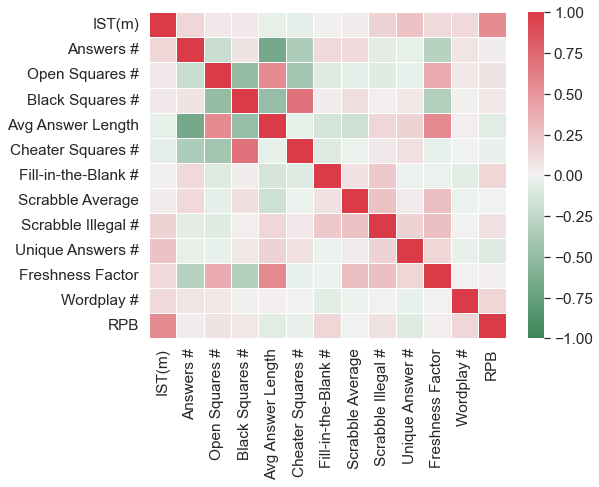

In [114]:
# Monday Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map
# Fig. S2

IS1_df4_Mon = IS1_df4.loc[IS1_df4["DOW"]==("Monday")]
puzzle_features = IS1_df4_Mon[["IST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "IS_pds_l8_ndw"]]

corr = puzzle_features.corr()

labels = {
'IST(m)':'IST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',   
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill-in-the-Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay':'Wordplay #',
'IS_pds_l8_ndw': 'RPB',    
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['IST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill-in-the-Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

In [115]:
IS1_df4_Mon.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 138 entries, 459 to 95
Data columns (total 55 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 138 non-null    datetime64[ns]
 1   P_Date_str                             138 non-null    object        
 2   P_Yr                                   138 non-null    period[A-DEC] 
 3   2023+_puzzle                           138 non-null    float64       
 4   DOW                                    138 non-null    object        
 5   DOW_num                                138 non-null    float64       
 6   GMST(m)                                138 non-null    float64       
 7   GMST(m)_10p_MA                         138 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA             138 non-null    int64         
 9   Comp_Hr                                138 non-null    int64    

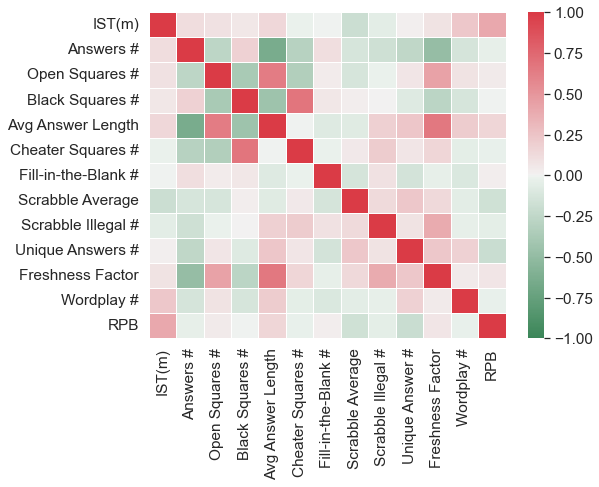

In [116]:
# Tuesday Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map
#Fig. S2

IS1_df4_Tue = IS1_df4.loc[IS1_df4["DOW"]==("Tuesday")]
puzzle_features = IS1_df4_Tue[["IST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "IS_pds_l8_ndw"]]

corr = puzzle_features.corr()

labels = {
'IST(m)':'IST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',   
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill-in-the-Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay': 'Wordplay #',
'IS_pds_l8_ndw': 'RPB'    
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['IST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill-in-the-Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

In [117]:
IS1_df4_Tue.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 137 entries, 528 to 122
Data columns (total 55 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 137 non-null    datetime64[ns]
 1   P_Date_str                             137 non-null    object        
 2   P_Yr                                   137 non-null    period[A-DEC] 
 3   2023+_puzzle                           137 non-null    float64       
 4   DOW                                    137 non-null    object        
 5   DOW_num                                137 non-null    float64       
 6   GMST(m)                                137 non-null    float64       
 7   GMST(m)_10p_MA                         137 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA             137 non-null    int64         
 9   Comp_Hr                                137 non-null    int64   

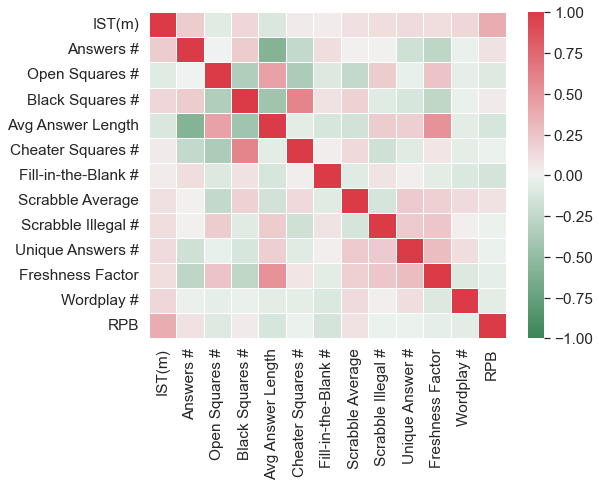

In [118]:
# Wednesday Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map

IS1_df4_Wed = IS1_df4.loc[IS1_df4["DOW"]==("Wednesday")]
puzzle_features = IS1_df4_Wed[["IST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "IS_pds_l8_ndw"]]

corr = puzzle_features.corr()

labels = {
'IST(m)':'IST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',   
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill-in-the-Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay': 'Wordplay #',
'IS_pds_l8_ndw': 'RPB'
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['IST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill-in-the-Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

In [119]:
IS1_df4_Wed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 141 entries, 310 to 282
Data columns (total 55 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 141 non-null    datetime64[ns]
 1   P_Date_str                             141 non-null    object        
 2   P_Yr                                   141 non-null    period[A-DEC] 
 3   2023+_puzzle                           141 non-null    float64       
 4   DOW                                    141 non-null    object        
 5   DOW_num                                141 non-null    float64       
 6   GMST(m)                                141 non-null    float64       
 7   GMST(m)_10p_MA                         141 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA             141 non-null    int64         
 9   Comp_Hr                                141 non-null    int64   

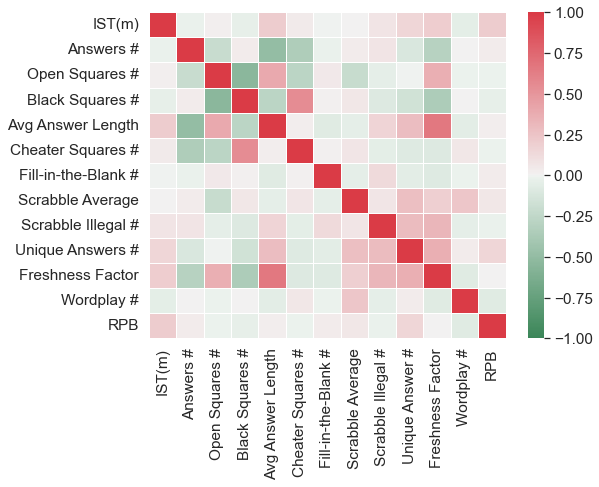

In [120]:
# Thursday Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map

IS1_df4_Thurs = IS1_df4.loc[IS1_df4["DOW"]==("Thursday")]
puzzle_features = IS1_df4_Thurs[["IST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "IS_pds_l8_ndw"]]

corr = puzzle_features.corr()

labels = {
'IST(m)':'IST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',    
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill-in-the-Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay':'Wordplay #',
'IS_pds_l8_ndw': 'RPB',    
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['IST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill-in-the-Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])
#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

In [121]:
IS1_df4_Thurs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 141 entries, 281 to 204
Data columns (total 55 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 141 non-null    datetime64[ns]
 1   P_Date_str                             141 non-null    object        
 2   P_Yr                                   141 non-null    period[A-DEC] 
 3   2023+_puzzle                           141 non-null    float64       
 4   DOW                                    141 non-null    object        
 5   DOW_num                                141 non-null    float64       
 6   GMST(m)                                141 non-null    float64       
 7   GMST(m)_10p_MA                         141 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA             141 non-null    int64         
 9   Comp_Hr                                141 non-null    int64   

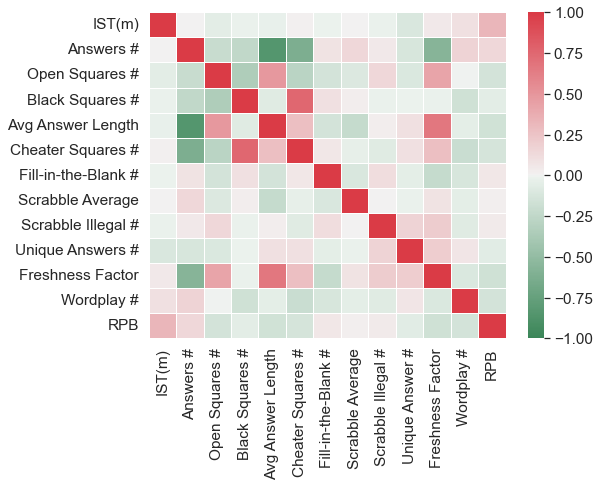

In [122]:
# Friday Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map

IS1_df4_Fri = IS1_df4.loc[IS1_df4["DOW"]==("Friday")]
puzzle_features = IS1_df4_Fri[["IST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "IS_pds_l8_ndw"]]

corr = puzzle_features.corr()

labels = {
'IST(m)':'IST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',   
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill-in-the-Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay':'Wordplay #',
'IS_pds_l8_ndw': 'RPB'
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['IST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill-in-the-Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

In [123]:
IS1_df4_Fri.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 141 entries, 287 to 301
Data columns (total 55 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 141 non-null    datetime64[ns]
 1   P_Date_str                             141 non-null    object        
 2   P_Yr                                   141 non-null    period[A-DEC] 
 3   2023+_puzzle                           141 non-null    float64       
 4   DOW                                    141 non-null    object        
 5   DOW_num                                141 non-null    float64       
 6   GMST(m)                                141 non-null    float64       
 7   GMST(m)_10p_MA                         141 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA             141 non-null    int64         
 9   Comp_Hr                                141 non-null    int64   

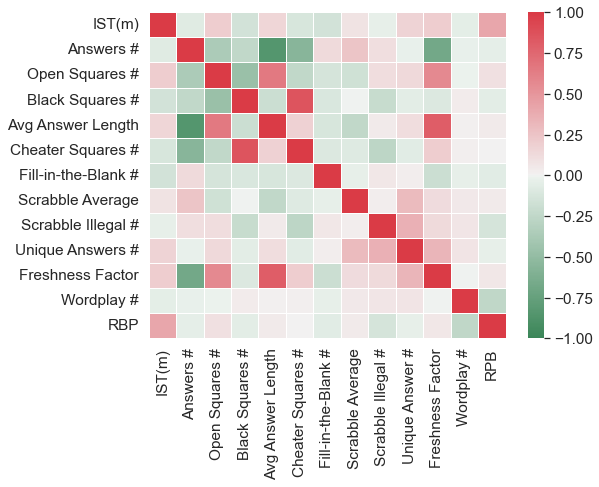

In [124]:
# Saturday Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map

IS1_df4_Sat = IS1_df4.loc[IS1_df4["DOW"]==("Saturday")]
puzzle_features = IS1_df4_Sat[["IST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "IS_pds_l8_ndw"]]

corr = puzzle_features.corr()

labels = {
'IST(m)':'IST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',   
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill-in-the-Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay':'Wordplay #',
'IS_pds_l8_ndw': 'RBP'
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['IST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill-in-the-Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

In [125]:
IS1_df4_Sat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 141 entries, 265 to 244
Data columns (total 55 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 141 non-null    datetime64[ns]
 1   P_Date_str                             141 non-null    object        
 2   P_Yr                                   141 non-null    period[A-DEC] 
 3   2023+_puzzle                           141 non-null    float64       
 4   DOW                                    141 non-null    object        
 5   DOW_num                                141 non-null    float64       
 6   GMST(m)                                141 non-null    float64       
 7   GMST(m)_10p_MA                         141 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA             141 non-null    int64         
 9   Comp_Hr                                141 non-null    int64   

### Scatterplots of Relationship of Grid, Answer and Past-Performance Parameters to IS1 Per Puzzle Performance

In [126]:
IS1_df4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 978 entries, 287 to 204
Data columns (total 55 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 978 non-null    datetime64[ns]
 1   P_Date_str                             978 non-null    object        
 2   P_Yr                                   978 non-null    period[A-DEC] 
 3   2023+_puzzle                           978 non-null    float64       
 4   DOW                                    978 non-null    object        
 5   DOW_num                                978 non-null    float64       
 6   GMST(m)                                978 non-null    float64       
 7   GMST(m)_10p_MA                         978 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA             978 non-null    int64         
 9   Comp_Hr                                978 non-null    int64   

In [127]:
# Create new df with all 15x15 puzzle rows (in the previously filtered date range) copied and placed below current rows. 
# This is so we can plot all 15x15 data together as a subplot in the feature correlation scatterplot figures 

IS1_df4_copy = IS1_df4.loc[(IS1_df4["DOW_num"] != 1)] #15x15 only
IS1_df4_copy["DOW_num"] = 0

IS1_df4a = pd.concat([IS1_df4, IS1_df4_copy],ignore_index=True)

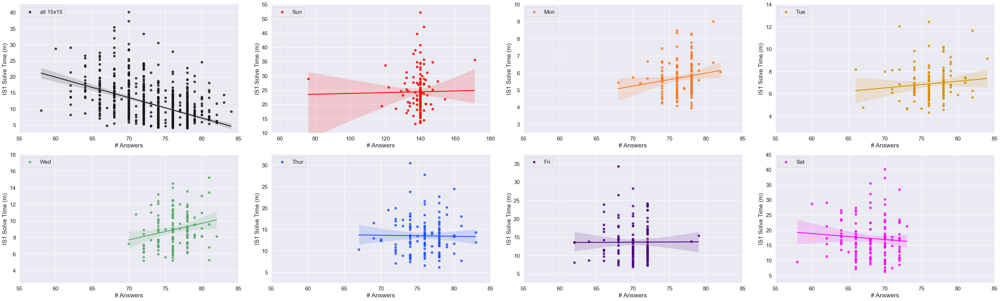

In [128]:
# Number of Answers vs IS1 Raw Solve Times
#Non-normed version
# Fig. 10

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Words", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Answers",
    ylabel="IS1 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((55,85))
p.axes[1].set_xlim((55,180))
p.axes[2].set_xlim((55,85))
p.axes[3].set_xlim((55,85))
p.axes[4].set_xlim((55,85))
p.axes[5].set_xlim((55,85))
p.axes[6].set_xlim((55,85))
p.axes[7].set_xlim((55,85))

p.axes[0].set_ylim((2.5,42.5))
p.axes[1].set_ylim((10,55))
p.axes[2].set_ylim((2.5,10))
p.axes[3].set_ylim((2.5,14))
p.axes[4].set_ylim((2.5,18))
p.axes[5].set_ylim((2.5,32.5))
p.axes[6].set_ylim((2.5,37.5))
p.axes[7].set_ylim((2.5,45))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

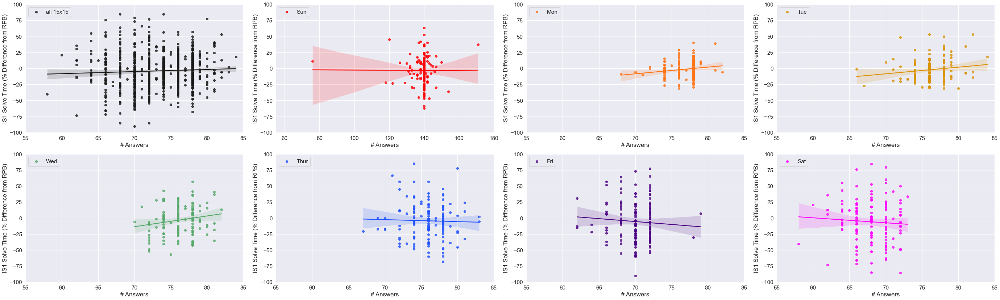

In [129]:
# Number of Answers vs IS1 Raw Solve Times
#RPB normed version
# Fig. 10

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Words", y="IST_Diff%_from_IS_pds_l8_ndw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Answers",
    ylabel="IS1 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((55,85))
p.axes[1].set_xlim((55,180))
p.axes[2].set_xlim((55,85))
p.axes[3].set_xlim((55,85))
p.axes[4].set_xlim((55,85))
p.axes[5].set_xlim((55,85))
p.axes[6].set_xlim((55,85))
p.axes[7].set_xlim((55,85))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [130]:
# Calculate IS1 Pearson R for 15x15 grids for this feature
IS1_15x15 = IS1_df4.loc[IS1_df4["DOW"]!=("Sunday")] #only need to filter down this one time, and can apply to correlations for all subsequent features analysed

print(IS1_15x15['IST(m)'].corr(IS1_15x15['Words']))

-0.4715566951075462


In [131]:
# Calculate GMS Pearson R for 15x15 grids for this feature

print(IS1_15x15['GMST(m)'].corr(IS1_15x15['Words']))

-0.6121264660355871


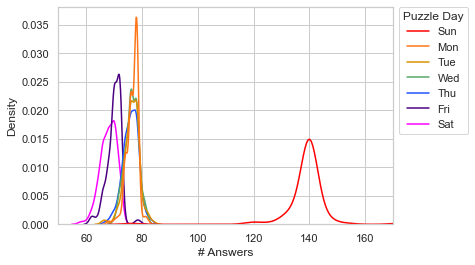

In [132]:
# Density plot of number of answers in puzzles solved by IS1
IS1_df4['plot_seq_map'] = IS1_df4['DOW_num'].map({1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5:'Thu', 6:'Fri', 7:'Sat'})
IS1_df4 = IS1_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS1_df4, x = "Words", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(50, 170)
ax.set_xlabel("# Answers")
plt.show()

In [133]:
IS1_df4["Words"].agg(['min', 'max'])

min     58
max    171
Name: Words, dtype: int64

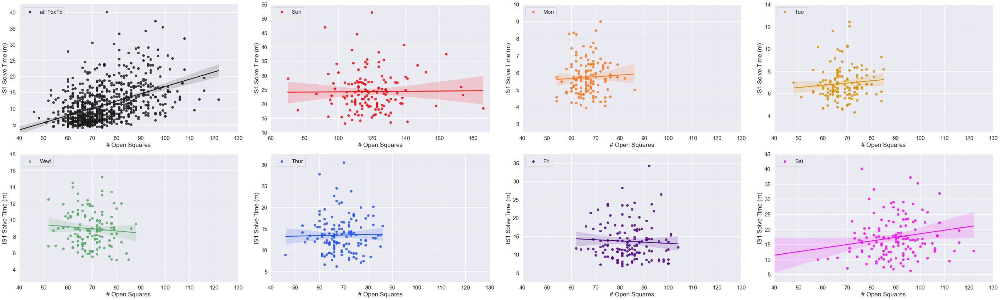

In [134]:
# Open Squares vs IS1 Raw Solve Times
# Fig. 11

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Open_Squares", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Open Squares",
    ylabel="IS1 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((40,130))
p.axes[1].set_xlim((60,190))
p.axes[2].set_xlim((40,130))
p.axes[3].set_xlim((40,130))
p.axes[4].set_xlim((40,130))
p.axes[5].set_xlim((40,130))
p.axes[6].set_xlim((40,130))
p.axes[7].set_xlim((40,130))

p.axes[0].set_ylim((2.5,42.5))
p.axes[1].set_ylim((10,55))
p.axes[2].set_ylim((2.5,10))
p.axes[3].set_ylim((2.5,14))
p.axes[4].set_ylim((2.5,18))
p.axes[5].set_ylim((2.5,32.5))
p.axes[6].set_ylim((2.5,37.5))
p.axes[7].set_ylim((2.5,45))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

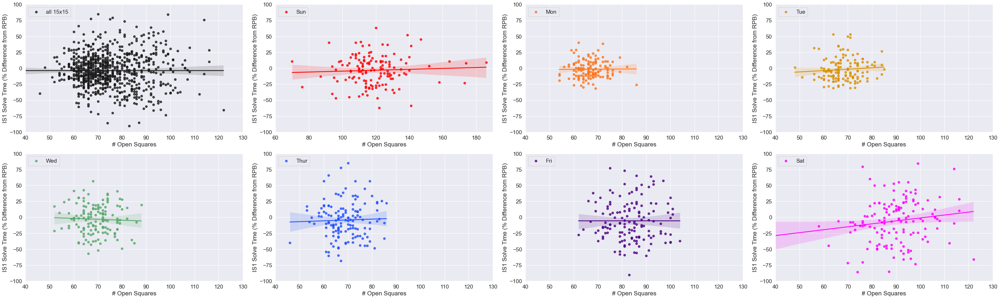

In [135]:
# Open Squares vs IS1 Raw Solve Times
#RPB normed version
#Fig. 11

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Open_Squares", y="IST_Diff%_from_IS_pds_l8_ndw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Open Squares",
    ylabel="IS1 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((40,130))
p.axes[1].set_xlim((60,190))
p.axes[2].set_xlim((40,130))
p.axes[3].set_xlim((40,130))
p.axes[4].set_xlim((40,130))
p.axes[5].set_xlim((40,130))
p.axes[6].set_xlim((40,130))
p.axes[7].set_xlim((40,130))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [136]:
# Calculate IS1 Pearson R for 15x15 grids for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['IST(m)'].corr(IS1_15x15['Open_Squares']))

0.46622596644309056


In [137]:
# Calculate GMS Pearson R for 15x15 grids for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['GMST(m)'].corr(IS1_15x15['Open_Squares']))

0.6035308013724362


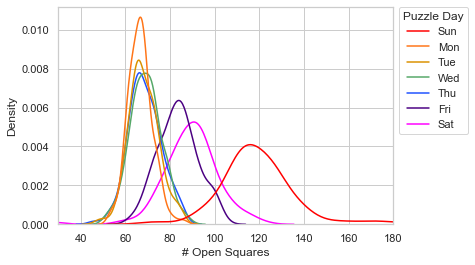

In [138]:
# Density plot of number of open squares in puzzles solved by IS1

IS1_df4 = IS1_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS1_df4, x = "Open_Squares", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(30, 180)
ax.set_xlabel("# Open Squares")
plt.show()

In [139]:
IS1_df4["Open_Squares"].agg(['min', 'max'])

min     29
max    186
Name: Open_Squares, dtype: int64

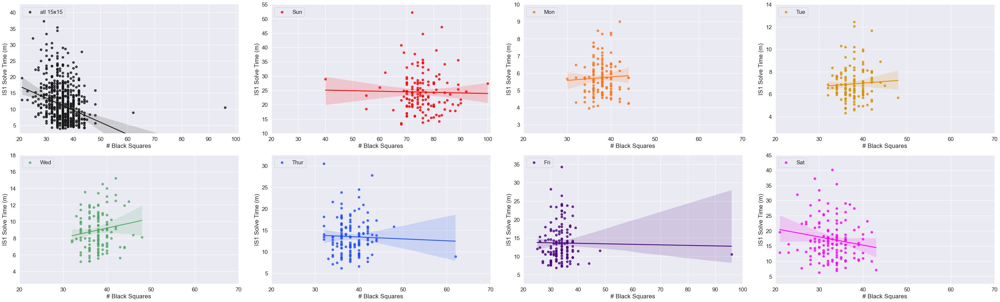

In [140]:
# Black Squares (blocks) vs IS1 Raw Solve Times
# Fig. 12

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Blocks", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Black Squares",
    ylabel="IS1 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((20,101))
p.axes[1].set_xlim((20,101))
p.axes[2].set_xlim((20,70))
p.axes[3].set_xlim((20,70))
p.axes[4].set_xlim((20,70))
p.axes[5].set_xlim((20,70))
p.axes[6].set_xlim((20,100))
p.axes[7].set_xlim((20,70))

p.axes[0].set_ylim((2.5,42.5))
p.axes[1].set_ylim((10,55))
p.axes[2].set_ylim((2.5,10))
p.axes[3].set_ylim((2.5,14))
p.axes[4].set_ylim((2.5,18))
p.axes[5].set_ylim((2.5,32.5))
p.axes[6].set_ylim((2.5,37.5))
p.axes[7].set_ylim((2.5,45))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

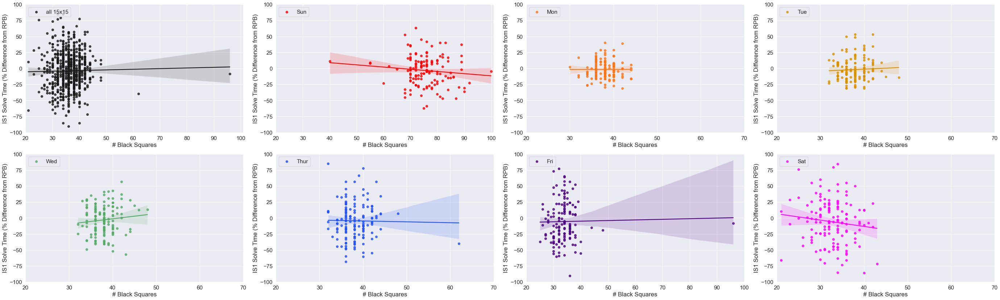

In [141]:
# Black Squares (blocks) vs IS1 Raw Solve Times
#RPB normed version
# Fig. 12

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Blocks", y="IST_Diff%_from_IS_pds_l8_ndw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Black Squares",
    ylabel="IS1 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((20,101))
p.axes[1].set_xlim((20,101))
p.axes[2].set_xlim((20,70))
p.axes[3].set_xlim((20,70))
p.axes[4].set_xlim((20,70))
p.axes[5].set_xlim((20,70))
p.axes[6].set_xlim((20,100))
p.axes[7].set_xlim((20,70))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [142]:
# Calculate Pearson R for IS1 15x15 grids for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['IST(m)'].corr(IS1_15x15['Blocks']))

-0.28934293151529694


In [143]:
# Calculate Pearson R for GMS 15x15 grids for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['GMST(m)'].corr(IS1_15x15['Blocks']))

-0.3808369851790265


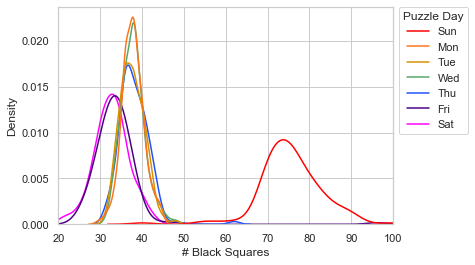

In [144]:
# Density plot of number of black squares (blocks) in puzzles solved by IS1
# Rememember to use df3 because df4 has the copied-in data for plotting all completed puzzles together

IS1_df4 = IS1_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS1_df4, x = "Blocks", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(20, 100)
ax.set_xlabel("# Black Squares")
plt.show()

In [145]:
IS1_df4["Blocks"].agg(['min', 'max'])

min     21
max    100
Name: Blocks, dtype: int64

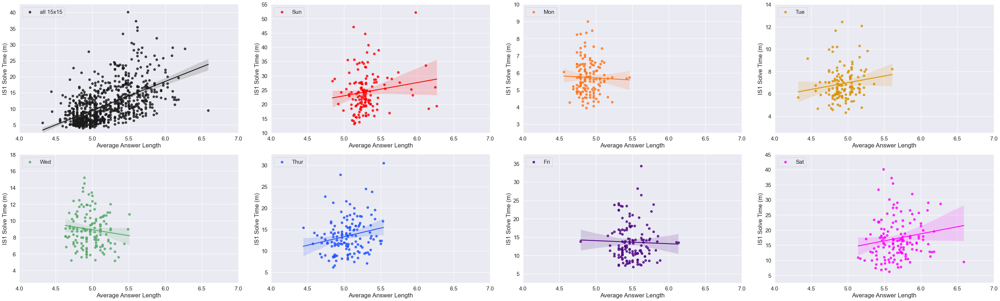

In [146]:
# Average Answer Length vs IS1 Raw Solve Times
# Fig. 13

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="AWL", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "Average Answer Length",
    ylabel="IS1 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((4,7))
p.axes[1].set_xlim((4,7))
p.axes[2].set_xlim((4,7))
p.axes[3].set_xlim((4,7))
p.axes[4].set_xlim((4,7))
p.axes[5].set_xlim((4,7))
p.axes[6].set_xlim((4,7))
p.axes[7].set_xlim((4,7))

p.axes[0].set_ylim((2.5,42.5))
p.axes[1].set_ylim((10,55))
p.axes[2].set_ylim((2.5,10))
p.axes[3].set_ylim((2.5,14))
p.axes[4].set_ylim((2.5,18))
p.axes[5].set_ylim((2.5,32.5))
p.axes[6].set_ylim((2.5,37.5))
p.axes[7].set_ylim((2.5,45))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

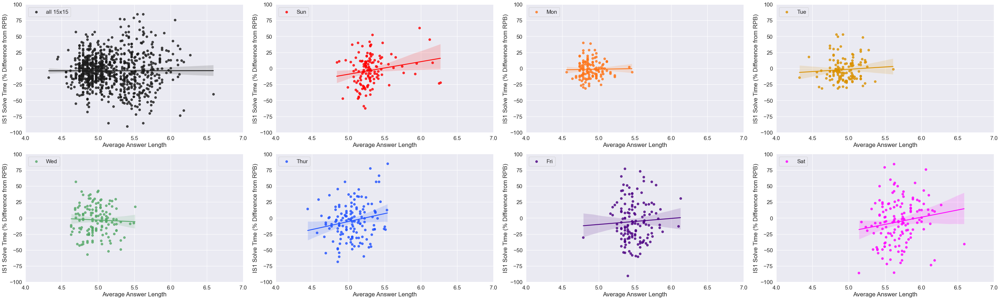

In [147]:
# Average Answer Length vs IS1 Raw Solve Times
#RPB Normed Version
# Fig. 13

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="AWL", y="IST_Diff%_from_IS_pds_l8_ndw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "Average Answer Length",
    ylabel="IS1 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((4,7))
p.axes[1].set_xlim((4,7))
p.axes[2].set_xlim((4,7))
p.axes[3].set_xlim((4,7))
p.axes[4].set_xlim((4,7))
p.axes[5].set_xlim((4,7))
p.axes[6].set_xlim((4,7))
p.axes[7].set_xlim((4,7))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [148]:
# Calculate Pearson R for IS1 for 15x15 grids for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['IST(m)'].corr(IS1_15x15['AWL']))

0.5556717265322642


In [149]:
# Calculate Pearson R for GMS for 15x15 grids for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['GMST(m)'].corr(IS1_15x15['AWL']))

0.7088248475706289


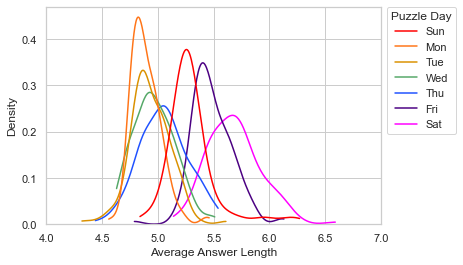

In [150]:
# Density plot of average answer length in puzzles solved by IS1

IS1_df4 = IS1_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS1_df4, x = "AWL", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True, cut=0, clip=(3,7))

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(4, 7)
ax.set_xlabel("Average Answer Length")
plt.show()

In [151]:
IS1_df4["AWL"].agg(['min', 'max'])

min    4.32
max    6.59
Name: AWL, dtype: float64

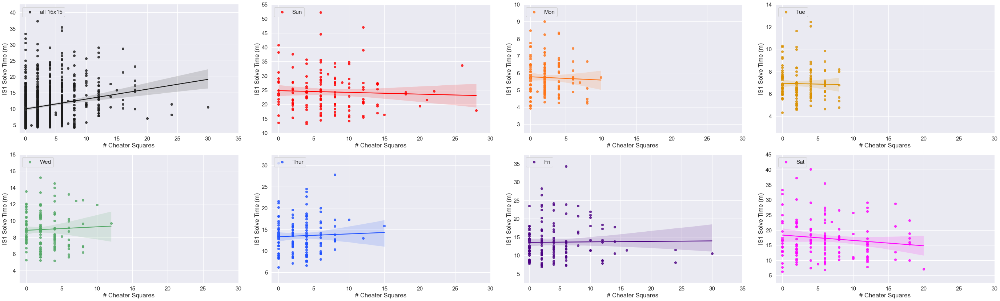

In [152]:
# Cheater Squares vs IS1 Raw Solve Times
# Fig. 14

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Cheater_Squares", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Cheater Squares",
    ylabel="IS1 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,35))
p.axes[1].set_xlim((-1,30))
p.axes[2].set_xlim((-1,30))
p.axes[3].set_xlim((-1,30))
p.axes[4].set_xlim((-1,30))
p.axes[5].set_xlim((-1,30))
p.axes[6].set_xlim((-1,35))
p.axes[7].set_xlim((-1,30))

p.axes[0].set_ylim((2.5,42.5))
p.axes[1].set_ylim((10,55))
p.axes[2].set_ylim((2.5,10))
p.axes[3].set_ylim((2.5,14))
p.axes[4].set_ylim((2.5,18))
p.axes[5].set_ylim((2.5,32.5))
p.axes[6].set_ylim((2.5,37.5))
p.axes[7].set_ylim((2.5,45))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

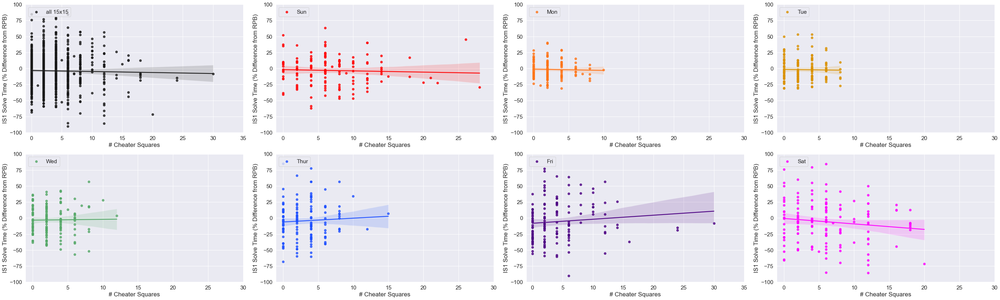

In [153]:
# Cheater Squares vs IS1 Raw Solve Times
#RPB normed version
# Fig. 14

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Cheater_Squares", y="IST_Diff%_from_IS_pds_l8_ndw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Cheater Squares",
    ylabel="IS1 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,35))
p.axes[1].set_xlim((-1,30))
p.axes[2].set_xlim((-1,30))
p.axes[3].set_xlim((-1,30))
p.axes[4].set_xlim((-1,30))
p.axes[5].set_xlim((-1,30))
p.axes[6].set_xlim((-1,35))
p.axes[7].set_xlim((-1,30))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [154]:
# Calculate Pearson R for 15x15 grids for IS1 for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['IST(m)'].corr(IS1_15x15['Cheater_Squares']))

0.1973881406355311


In [155]:
# Calculate Pearson R for 15x15 grids for GMS for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['GMST(m)'].corr(IS1_15x15['Cheater_Squares']))

0.23700514322341698


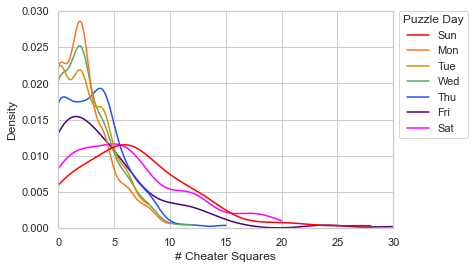

In [156]:
# Density plot of number of cheater squares in puzzles solved by IS1
# Rememember to use df3 because df4 has the copied-in data for plotting all completed puzzles together

IS1_df4 = IS1_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS1_df4, x = "Cheater_Squares", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True, cut=0, clip=(0,30))

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(0, 30)
ax.set_xlabel("# Cheater Squares")
plt.show()

In [157]:
IS1_df4["Cheater_Squares"].agg(['min', 'max'])

min     0
max    30
Name: Cheater_Squares, dtype: int64

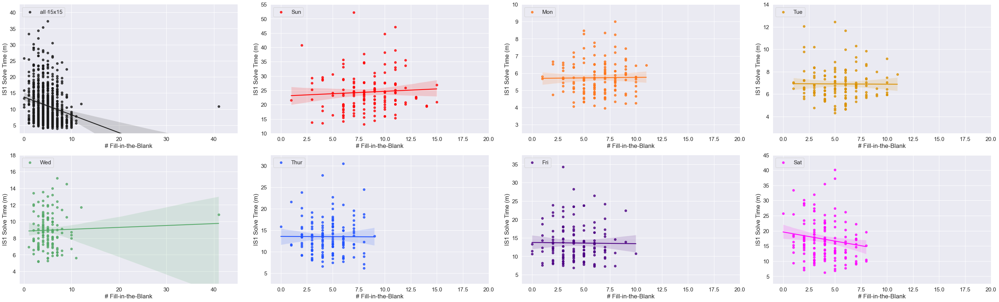

In [158]:
# Fill-in-the-blank clues vs IS1 Raw Solve Times
# Fig. 15

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="FITB", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Fill-in-the-Blank",
    ylabel="IS1 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,45))
p.axes[1].set_xlim((-1,20))
p.axes[2].set_xlim((-1,20))
p.axes[3].set_xlim((-1,20))
p.axes[4].set_xlim((-1,45))
p.axes[5].set_xlim((-1,20))
p.axes[6].set_xlim((-1,20))
p.axes[7].set_xlim((-1,20))

p.axes[0].set_ylim((2.5,42.5))
p.axes[1].set_ylim((10,55))
p.axes[2].set_ylim((2.5,10))
p.axes[3].set_ylim((2.5,14))
p.axes[4].set_ylim((2.5,18))
p.axes[5].set_ylim((2.5,32.5))
p.axes[6].set_ylim((2.5,37.5))
p.axes[7].set_ylim((2.5,45))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

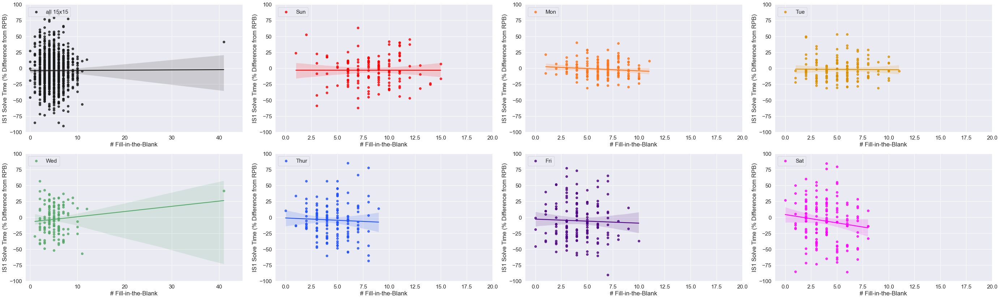

In [159]:
# Fill-in-the-blank clues vs IS1 Raw Solve Times
# Fig. 15

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="FITB", y="IST_Diff%_from_IS_pds_l8_ndw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Fill-in-the-Blank",
    ylabel="IS1 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,45))
p.axes[1].set_xlim((-1,20))
p.axes[2].set_xlim((-1,20))
p.axes[3].set_xlim((-1,20))
p.axes[4].set_xlim((-1,45))
p.axes[5].set_xlim((-1,20))
p.axes[6].set_xlim((-1,20))
p.axes[7].set_xlim((-1,20))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [160]:
# Calculate Pearson R for 15x15 grids for IS1 for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['IST(m)'].corr(IS1_15x15['FITB']))

-0.23552721821552822


In [161]:
# Calculate Pearson R for 15x15 grids for GMS for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['GMST(m)'].corr(IS1_15x15['FITB']))

-0.2625651210895577


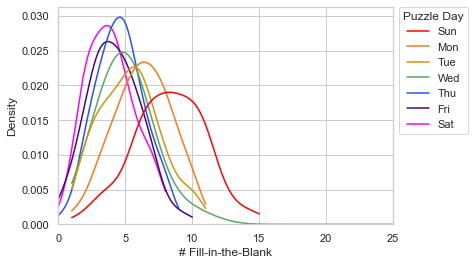

In [162]:
# Density plot of number of fill-in-the-blank clues in puzzles solved by IS1
# Rememember to use df3 because df4 has the copied-in data for plotting all completed puzzles together

IS1_df4 = IS1_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS1_df4, x = "FITB", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True, cut=0, clip=(0,45))

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(0, 25)
ax.set_xlabel("# Fill-in-the-Blank")
plt.show()

In [163]:
IS1_df4["FITB"].agg(['min', 'max'])

min     0
max    41
Name: FITB, dtype: int64

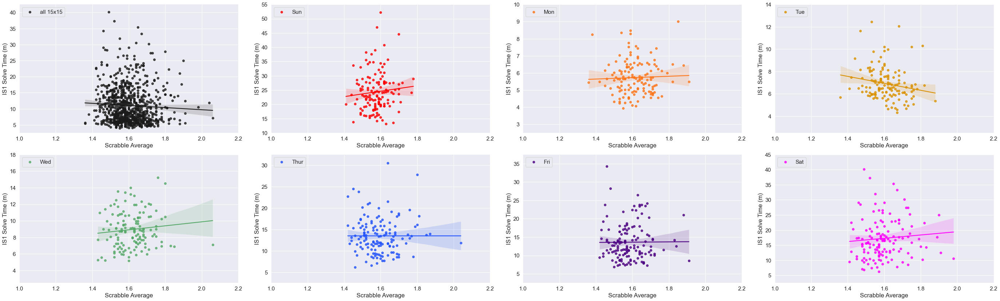

In [164]:
# Scrabble Average vs IS1 Raw Solve Times
# Fig. 16

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Scrabble_Avg", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "Scrabble Average",
    ylabel="IS1 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((1,2.2))
p.axes[1].set_xlim((1,2.2))
p.axes[2].set_xlim((1,2.2))
p.axes[3].set_xlim((1,2.2))
p.axes[4].set_xlim((1,2.2))
p.axes[5].set_xlim((1,2.2))
p.axes[6].set_xlim((1,2.2))
p.axes[7].set_xlim((1,2.2))

p.axes[0].set_ylim((2.5,42.5))
p.axes[1].set_ylim((10,55))
p.axes[2].set_ylim((2.5,10))
p.axes[3].set_ylim((2.5,14))
p.axes[4].set_ylim((2.5,18))
p.axes[5].set_ylim((2.5,32.5))
p.axes[6].set_ylim((2.5,37.5))
p.axes[7].set_ylim((2.5,45))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

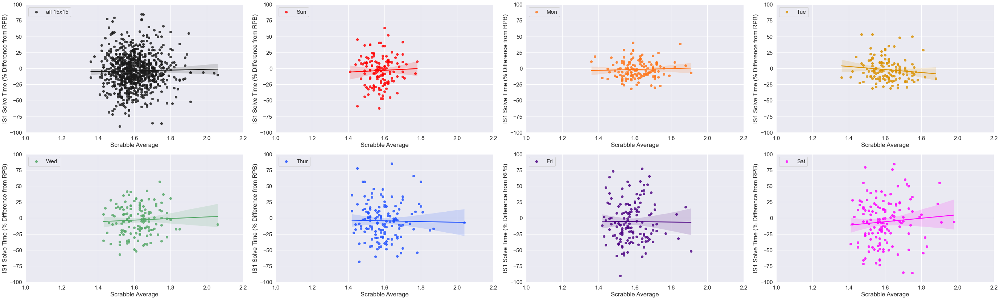

In [165]:
# Scrabble Average vs IS1 Raw Solve Times
#RPB normed version
#Fig. 16

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Scrabble_Avg", y="IST_Diff%_from_IS_pds_l8_ndw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "Scrabble Average",
    ylabel="IS1 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((1,2.2))
p.axes[1].set_xlim((1,2.2))
p.axes[2].set_xlim((1,2.2))
p.axes[3].set_xlim((1,2.2))
p.axes[4].set_xlim((1,2.2))
p.axes[5].set_xlim((1,2.2))
p.axes[6].set_xlim((1,2.2))
p.axes[7].set_xlim((1,2.2))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [166]:
# Calculate Pearson R for 15x15 grids for IS1 for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['IST(m)'].corr(IS1_15x15['Scrabble_Avg']))

-0.054556325594570625


In [167]:
# Calculate Pearson R for 15x15 grids for GMS for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['GMST(m)'].corr(IS1_15x15['Scrabble_Avg']))

-0.07193054711476395


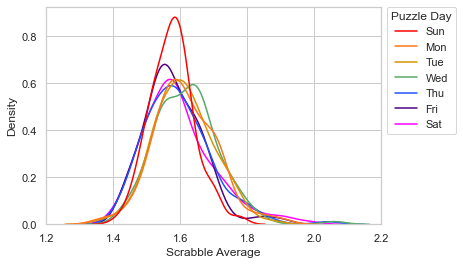

In [168]:
# Density plot of Scrabble Average in puzzles solved by IS1

IS1_df4 = IS1_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS1_df4, x = "Scrabble_Avg", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(1.2, 2.2)
ax.set_xlabel("Scrabble Average")
plt.show()

In [169]:
IS1_df4["Scrabble_Avg"].agg(['min', 'max'])

min    1.36
max    2.06
Name: Scrabble_Avg, dtype: float64

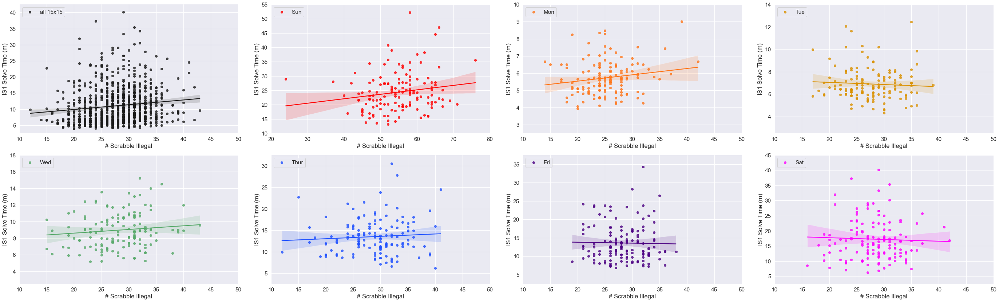

In [170]:
# Scrabble Illegal # vs IS1 Raw Solve Times
# Fig. 17

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Scrabble_Illegal", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Scrabble Illegal",
    ylabel="IS1 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((10,50))
p.axes[1].set_xlim((20,80))
p.axes[2].set_xlim((10,50))
p.axes[3].set_xlim((10,50))
p.axes[4].set_xlim((10,50))
p.axes[5].set_xlim((10,50))
p.axes[6].set_xlim((10,50))
p.axes[7].set_xlim((10,50))

p.axes[0].set_ylim((2.5,42.5))
p.axes[1].set_ylim((10,55))
p.axes[2].set_ylim((2.5,10))
p.axes[3].set_ylim((2.5,14))
p.axes[4].set_ylim((2.5,18))
p.axes[5].set_ylim((2.5,32.5))
p.axes[6].set_ylim((2.5,37.5))
p.axes[7].set_ylim((2.5,45))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

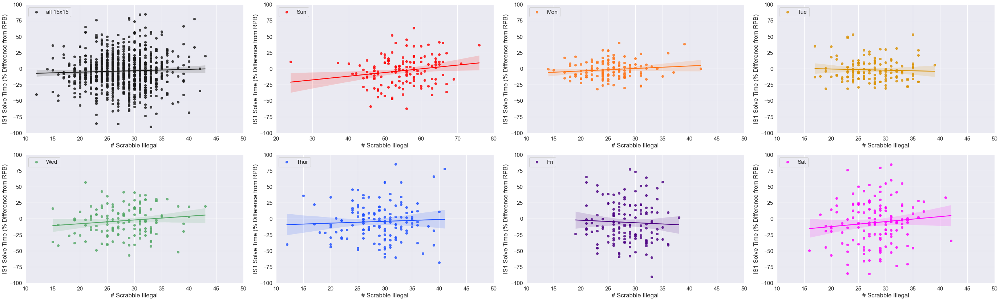

In [171]:
# Scrabble Illegal # vs IS1 Raw Solve Times
#RPB normed version
# Fig. 17

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Scrabble_Illegal", y="IST_Diff%_from_IS_pds_l8_ndw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Scrabble Illegal",
    ylabel="IS1 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((10,50))
p.axes[1].set_xlim((20,80))
p.axes[2].set_xlim((10,50))
p.axes[3].set_xlim((10,50))
p.axes[4].set_xlim((10,50))
p.axes[5].set_xlim((10,50))
p.axes[6].set_xlim((10,50))
p.axes[7].set_xlim((10,50))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [172]:
# Calculate Pearson R for IS1 for 15x15 grids for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['IST(m)'].corr(IS1_15x15['Scrabble_Illegal']))

0.12419707185276847


In [173]:
# Calculate Pearson R for GMS for 15x15 grids for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['GMST(m)'].corr(IS1_15x15['Scrabble_Illegal']))

0.18555134427462655


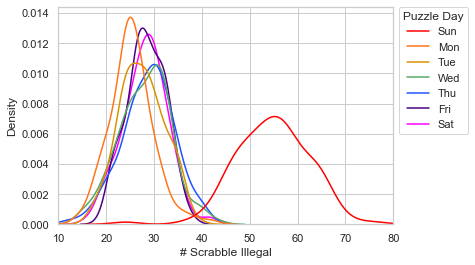

In [174]:
# Density plot of Scrabble Illegal # in puzzles solved by IS1

IS1_df4 = IS1_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS1_df4, x = "Scrabble_Illegal", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(10, 80)
ax.set_xlabel("# Scrabble Illegal")
plt.show()

In [175]:
IS1_df4["Scrabble_Illegal"].agg(['min', 'max'])

min    12
max    76
Name: Scrabble_Illegal, dtype: int64

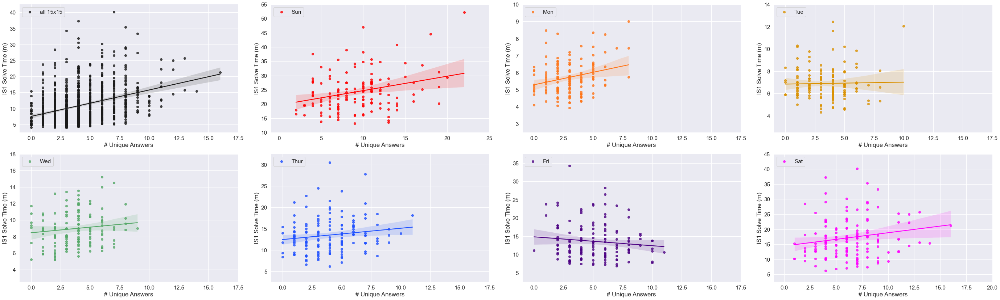

In [176]:
# Unique Answers # # vs IS1 Raw Solve Times
# non-normed version
# Fig. 18

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Unique_Answers", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Unique Answers",
    ylabel="IS1 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,17.5))
p.axes[1].set_xlim((-1,25))
p.axes[2].set_xlim((-1,17.5))
p.axes[3].set_xlim((-1,17.5))
p.axes[4].set_xlim((-1,17.5))
p.axes[5].set_xlim((-1,17.5))
p.axes[6].set_xlim((-1,17.5))
p.axes[7].set_xlim((-1,20))

p.axes[0].set_ylim((2.5,42.5))
p.axes[1].set_ylim((10,55))
p.axes[2].set_ylim((2.5,10))
p.axes[3].set_ylim((2.5,14))
p.axes[4].set_ylim((2.5,18))
p.axes[5].set_ylim((2.5,32.5))
p.axes[6].set_ylim((2.5,37.5))
p.axes[7].set_ylim((2.5,45))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

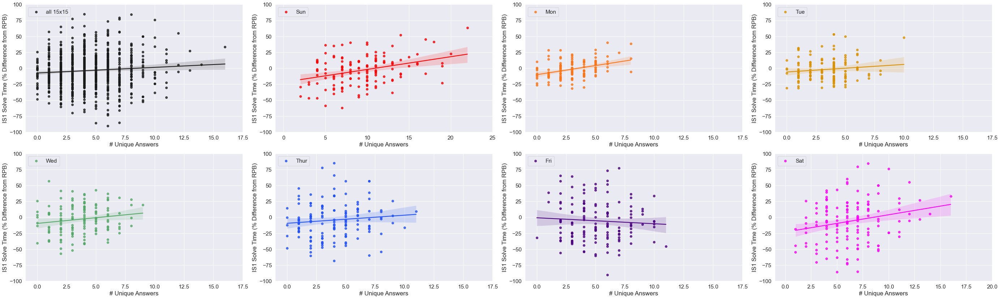

In [177]:
# Unique Answers # # vs IS1 Raw Solve Times
#RPB normed version
# Fig. 18

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Unique_Answers", y="IST_Diff%_from_IS_pds_l8_ndw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Unique Answers",
    ylabel="IS1 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,17.5))
p.axes[1].set_xlim((-1,25))
p.axes[2].set_xlim((-1,17.5))
p.axes[3].set_xlim((-1,17.5))
p.axes[4].set_xlim((-1,17.5))
p.axes[5].set_xlim((-1,17.5))
p.axes[6].set_xlim((-1,17.5))
p.axes[7].set_xlim((-1,20))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [178]:
# Calculate Pearson R for 15x15 grids for IS1 for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['IST(m)'].corr(IS1_15x15['Unique_Answers']))

0.35338496479304027


In [179]:
# Calculate Pearson R for 15x15 grids for GMS for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['GMST(m)'].corr(IS1_15x15['Unique_Answers']))

0.416146290742295


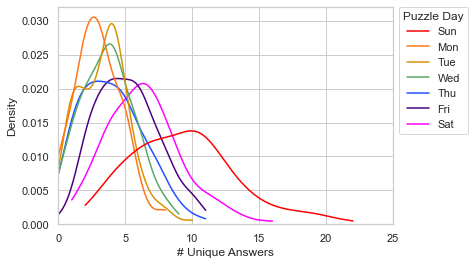

In [180]:
# Density plot of Unique Answers # in puzzles solved by IS1

IS1_df4 = IS1_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS1_df4, x = "Unique_Answers", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True, cut=0, clip=(0,25))

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(0, 25)
ax.set_xlabel("# Unique Answers")
plt.show()

In [181]:
IS1_df4["Unique_Answers"].agg(['min', 'max'])

min     0
max    22
Name: Unique_Answers, dtype: int64

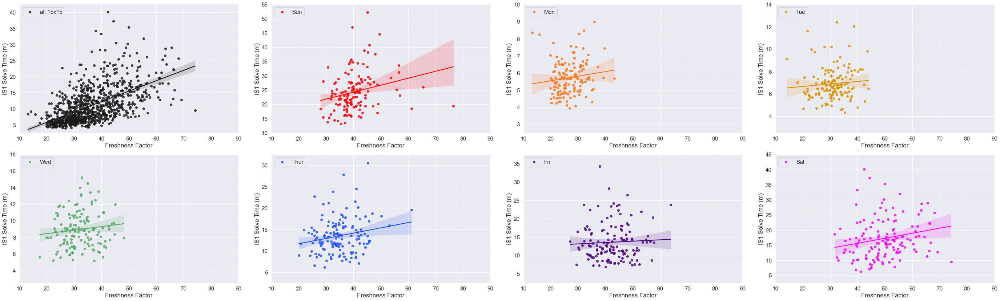

In [182]:
# Freshness Factor vs IS1 Raw Solve Times
# non-normed version
# Fig. 19

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Freshness_Factor", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "Freshness Factor",
    ylabel="IS1 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((10,90))
p.axes[1].set_xlim((10,90))
p.axes[2].set_xlim((10,90))
p.axes[3].set_xlim((10,90))
p.axes[4].set_xlim((10,90))
p.axes[5].set_xlim((10,90))
p.axes[6].set_xlim((10,90))
p.axes[7].set_xlim((10,90))

p.axes[0].set_ylim((2.5,42.5))
p.axes[1].set_ylim((10,55))
p.axes[2].set_ylim((2.5,10))
p.axes[3].set_ylim((2.5,14))
p.axes[4].set_ylim((2.5,18))
p.axes[5].set_ylim((2.5,32.5))
p.axes[6].set_ylim((2.5,37.5))
p.axes[7].set_ylim((2.5,45))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

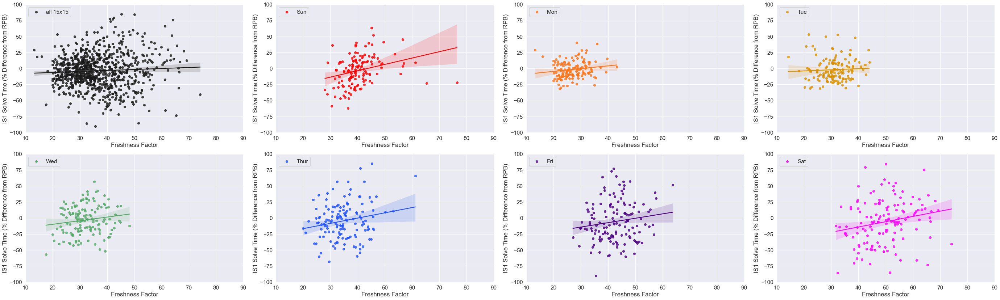

In [183]:
# Freshness Factor vs IS1 Raw Solve Times
# RPB normalized version
# Fig. 19

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Freshness_Factor", y="IST_Diff%_from_IS_pds_l8_ndw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "Freshness Factor",
    ylabel="IS1 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((10,90))
p.axes[1].set_xlim((10,90))
p.axes[2].set_xlim((10,90))
p.axes[3].set_xlim((10,90))
p.axes[4].set_xlim((10,90))
p.axes[5].set_xlim((10,90))
p.axes[6].set_xlim((10,90))
p.axes[7].set_xlim((10,90))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [184]:
# Calculate Pearson R for 15x15 grids for IS1 for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['IST(m)'].corr(IS1_15x15['Freshness_Factor']))

0.5631831703728051


In [185]:
# Calculate Pearson R for 15x15 grids for GMS for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['GMST(m)'].corr(IS1_15x15['Freshness_Factor']))

0.7081867978751567


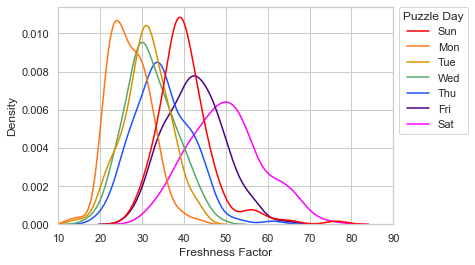

In [186]:
# Density plot of Freshness Factor in puzzles solved by IS1
# Rememember to use df3 because df4 has the copied-in data for plotting all completed puzzles together

IS1_df4 = IS1_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS1_df4, x = "Freshness_Factor", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(10, 90)
ax.set_xlabel("Freshness Factor")
plt.show()

In [187]:
IS1_df4["Freshness_Factor"].agg(['min', 'max'])

min    13.2
max    76.5
Name: Freshness_Factor, dtype: float64

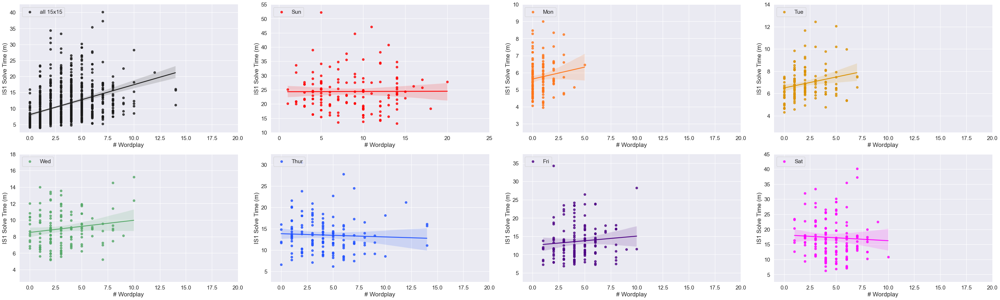

In [188]:
# Wordplay vs IS1 Raw Solve Times
# non-normed version
# Fig. 20

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Wordplay", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Wordplay",
    ylabel="IS1 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,20))
p.axes[1].set_xlim((-1,25))
p.axes[2].set_xlim((-1,20))
p.axes[3].set_xlim((-1,20))
p.axes[4].set_xlim((-1,20))
p.axes[5].set_xlim((-1,20))
p.axes[6].set_xlim((-1,20))
p.axes[7].set_xlim((-1,20))

p.axes[0].set_ylim((2.5,42.5))
p.axes[1].set_ylim((10,55))
p.axes[2].set_ylim((2.5,10))
p.axes[3].set_ylim((2.5,14))
p.axes[4].set_ylim((2.5,18))
p.axes[5].set_ylim((2.5,32.5))
p.axes[6].set_ylim((2.5,37.5))
p.axes[7].set_ylim((2.5,45))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

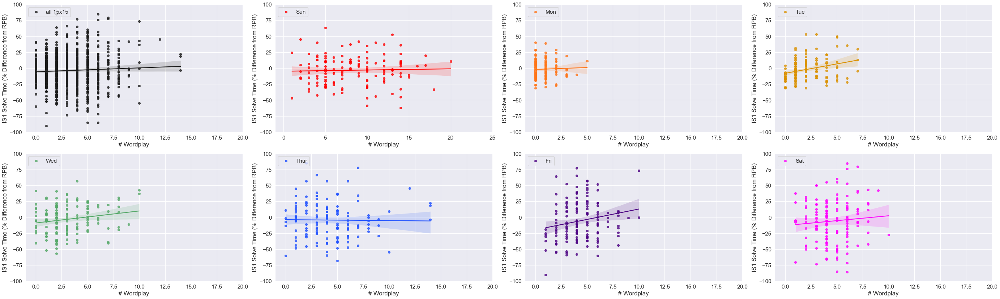

In [189]:
# Wordplay vs IS1 Raw Solve Times
#RPB normed version
# Fig. 20

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Wordplay", y="IST_Diff%_from_IS_pds_l8_ndw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Wordplay",
    ylabel="IS1 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,20))
p.axes[1].set_xlim((-1,25))
p.axes[2].set_xlim((-1,20))
p.axes[3].set_xlim((-1,20))
p.axes[4].set_xlim((-1,20))
p.axes[5].set_xlim((-1,20))
p.axes[6].set_xlim((-1,20))
p.axes[7].set_xlim((-1,20))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [190]:
# Calculate Pearson R for 15x15 grids for IS1 for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['IST(m)'].corr(IS1_15x15['Wordplay']))

0.3880950056153373


In [191]:
# Calculate Pearson R for 15x15 grids for GMS for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['GMST(m)'].corr(IS1_15x15['Wordplay']))

0.493161078787087


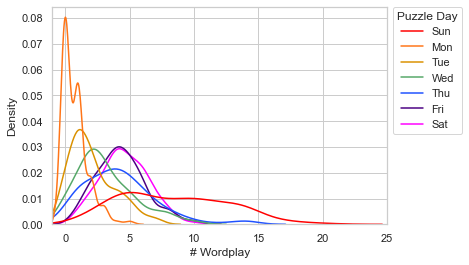

In [192]:
# Density plot of Wordplay in puzzles solved by IS1
# Rememember to use df3 because df4 has the copied-in data for plotting all completed puzzles together

IS1_df4 = IS1_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS1_df4, x = "Wordplay", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(-1, 25)
ax.set_xlabel("# Wordplay")
plt.show()

In [193]:
IS1_df4["Wordplay"].agg(['min', 'max'])

min     0.0
max    20.0
Name: Wordplay, dtype: float64

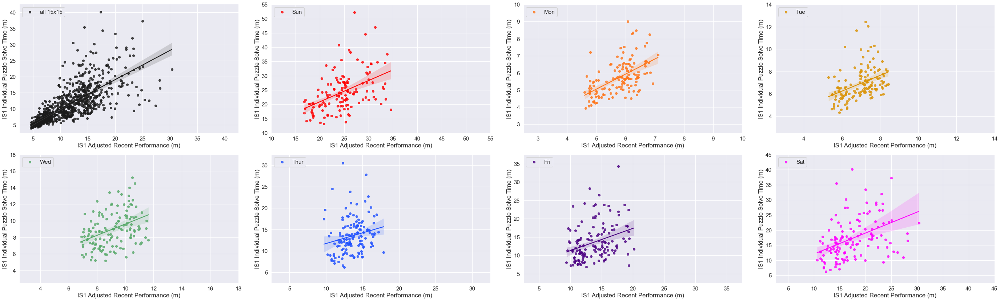

In [194]:
# IS1 Recent Past Performance (NON-Time-Decay Weighted Immediately Previous 8 Puzzles Prior to a given puzzle) vs IS1 Raw Solve Times
# Figure 21

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="IS_pds_l8_ndw", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "IS1 Adjusted Recent Performance (m)",
    ylabel="IS1 Individual Puzzle Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((2.5,42.5))
p.axes[1].set_xlim((10,55))
p.axes[2].set_xlim((2.5,10))
p.axes[3].set_xlim((2.5,14))
p.axes[4].set_xlim((2.5,18))
p.axes[5].set_xlim((2.5,32.5))
p.axes[6].set_xlim((2.5,37.5))
p.axes[7].set_xlim((2.5,45))

p.axes[0].set_ylim((2.5,42.5))
p.axes[1].set_ylim((10,55))
p.axes[2].set_ylim((2.5,10))
p.axes[3].set_ylim((2.5,14))
p.axes[4].set_ylim((2.5,18))
p.axes[5].set_ylim((2.5,32.5))
p.axes[6].set_ylim((2.5,37.5))
p.axes[7].set_ylim((2.5,45))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [195]:
# Calculate Pearson R for 15x15 grids for IS1 for this feature
#IS1_15x15 = IS1_df4.loc[IS1_df4["DOW"]!=("Sunday")]

print(IS1_15x15['IST(m)'].corr(IS1_15x15['IS_pds_l8_ndw']))

# Calculate Pearson R for each puzzle day for this feature
IS1_Sun = IS1_df4.loc[IS1_df4["DOW"]==("Sunday")]
print(IS1_Sun['IST(m)'].corr(IS1_Sun['IS_pds_l8_ndw']))

IS1_Mon = IS1_df4.loc[IS1_df4["DOW"]==("Monday")]
print(IS1_Mon['IST(m)'].corr(IS1_Mon['IS_pds_l8_ndw']))

IS1_Tue = IS1_df4.loc[IS1_df4["DOW"]==("Tuesday")]
print(IS1_Tue['IST(m)'].corr(IS1_Tue['IS_pds_l8_ndw']))

IS1_Wed = IS1_df4.loc[IS1_df4["DOW"]==("Wednesday")]
print(IS1_Wed['IST(m)'].corr(IS1_Wed['IS_pds_l8_ndw']))

IS1_Thu = IS1_df4.loc[IS1_df4["DOW"]==("Thursday")]
print(IS1_Thu['IST(m)'].corr(IS1_Thu['IS_pds_l8_ndw']))

IS1_Fri = IS1_df4.loc[IS1_df4["DOW"]==("Friday")]
print(IS1_Fri['IST(m)'].corr(IS1_Fri['IS_pds_l8_ndw']))

IS1_Sat = IS1_df4.loc[IS1_df4["DOW"]==("Saturday")]
print(IS1_Sat['IST(m)'].corr(IS1_Sat['IS_pds_l8_ndw']))

0.7395620701099614
0.4633770940957547
0.5534561382708469
0.40306809471826033
0.3796922498144395
0.2047143559614148
0.3268267988762899
0.408643877462502


In [196]:
IS1_Thu.to_csv('../data/IS1_Thu.csv', index=False)

### Data Supplement
Note: Supplementary Figures 1 and 2 calculated in the main figures and are labeled as such there. 

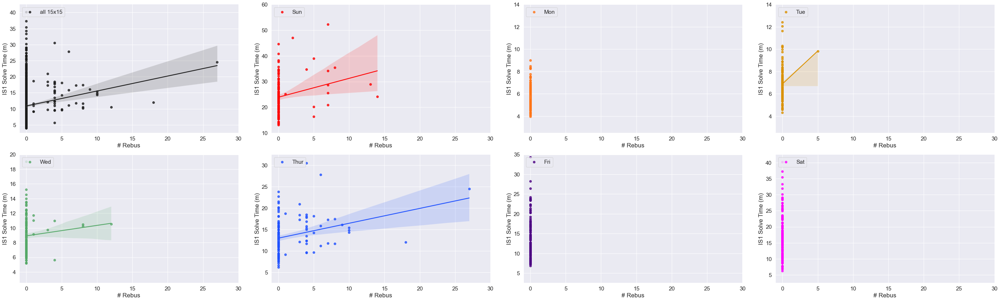

In [197]:
# Rebus vs IS1 Raw Solve Times
# non-normed version
#Fig. S3

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Rebus_Count", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Rebus",
    ylabel="IS1 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,30))
p.axes[1].set_xlim((-1,30))
p.axes[2].set_xlim((-1,30))
p.axes[3].set_xlim((-1,30))
p.axes[4].set_xlim((-1,30))
p.axes[5].set_xlim((-1,30))
p.axes[6].set_xlim((-1,30))
p.axes[7].set_xlim((-1,30))

p.axes[0].set_ylim((2.5,42.5))
p.axes[1].set_ylim((10,60))
p.axes[2].set_ylim((2.5,14))
p.axes[3].set_ylim((2.5,14))
p.axes[4].set_ylim((2.5,20))
p.axes[5].set_ylim((2.5,32.5))
p.axes[6].set_ylim((2.5,35))
p.axes[7].set_ylim((2.5,42.5))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

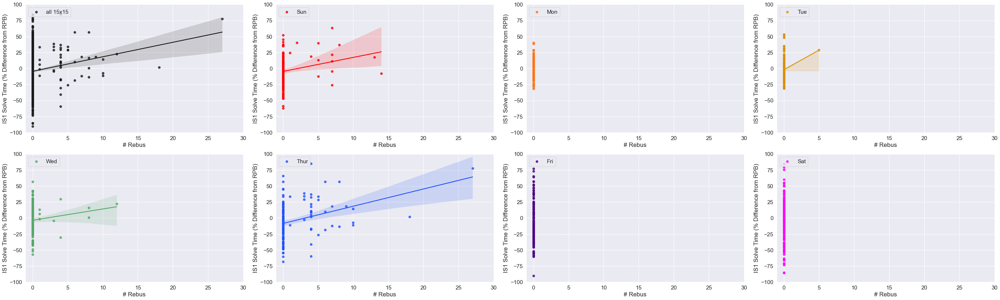

In [198]:
# Rebus vs IS1 Raw Solve Times
# Fig. S3
#RPB normed version

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Rebus_Count", y="IST_Diff%_from_IS_pds_l8_ndw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Rebus",
    ylabel="IS1 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,30))
p.axes[1].set_xlim((-1,30))
p.axes[2].set_xlim((-1,30))
p.axes[3].set_xlim((-1,30))
p.axes[4].set_xlim((-1,30))
p.axes[5].set_xlim((-1,30))
p.axes[6].set_xlim((-1,30))
p.axes[7].set_xlim((-1,30))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [199]:
# Calculate Pearson R for 15x15 grids for IS1 for this feature
#IS1_15x15 = IS1_df4.loc[IS1_df4["DOW"]!=("Sunday")]

print(IS1_15x15['IST(m)'].corr(IS1_15x15['Rebus_Count']))

# Calculate Pearson R for each puzzle day for this feature
IS1_Sun = IS1_df4.loc[IS1_df4["DOW"]==("Sunday")]
print(IS1_Sun['IST(m)'].corr(IS1_Sun['Rebus_Count']))

IS1_Mon = IS1_df4.loc[IS1_df4["DOW"]==("Monday")]
print(IS1_Mon['IST(m)'].corr(IS1_Mon['Rebus_Count']))

IS1_Tue = IS1_df4.loc[IS1_df4["DOW"]==("Tuesday")]
print(IS1_Tue['IST(m)'].corr(IS1_Tue['Rebus_Count']))

IS1_Wed = IS1_df4.loc[IS1_df4["DOW"]==("Wednesday")]
print(IS1_Wed['IST(m)'].corr(IS1_Wed['Rebus_Count']))

IS1_Thu = IS1_df4.loc[IS1_df4["DOW"]==("Thursday")]
print(IS1_Thu['IST(m)'].corr(IS1_Thu['Rebus_Count']))

IS1_Fri = IS1_df4.loc[IS1_df4["DOW"]==("Friday")]
print(IS1_Fri['IST(m)'].corr(IS1_Fri['Rebus_Count']))

IS1_Sat = IS1_df4.loc[IS1_df4["DOW"]==("Saturday")]
print(IS1_Sat['IST(m)'].corr(IS1_Sat['Rebus_Count']))

0.13405931163405901
0.24422423516012107
nan
0.1732541907067477
0.09208043471036437
0.29919255450020754
nan
nan


In [200]:
# Calculate Pearson R for 15x15 grids for GMST for this feature
#IS1_15x15 = IS1_df4.loc[IS1_df4["DOW"]!=("Sunday")]

print(IS1_15x15['GMST(m)'].corr(IS1_15x15['Rebus_Count']))

# Calculate Pearson R for each puzzle day for this feature
IS1_Sun = IS1_df4.loc[IS1_df4["DOW"]==("Sunday")]
print(IS1_Sun['GMST(m)'].corr(IS1_Sun['Rebus_Count']))

IS1_Mon = IS1_df4.loc[IS1_df4["DOW"]==("Monday")]
print(IS1_Mon['GMST(m)'].corr(IS1_Mon['Rebus_Count']))

IS1_Tue = IS1_df4.loc[IS1_df4["DOW"]==("Tuesday")]
print(IS1_Tue['GMST(m)'].corr(IS1_Tue['Rebus_Count']))

IS1_Wed = IS1_df4.loc[IS1_df4["DOW"]==("Wednesday")]
print(IS1_Wed['GMST(m)'].corr(IS1_Wed['Rebus_Count']))

IS1_Thu = IS1_df4.loc[IS1_df4["DOW"]==("Thursday")]
print(IS1_Thu['GMST(m)'].corr(IS1_Thu['Rebus_Count']))

IS1_Fri = IS1_df4.loc[IS1_df4["DOW"]==("Friday")]
print(IS1_Fri['GMST(m)'].corr(IS1_Fri['Rebus_Count']))

IS1_Sat = IS1_df4.loc[IS1_df4["DOW"]==("Saturday")]
print(IS1_Sat['GMST(m)'].corr(IS1_Sat['Rebus_Count']))

0.10941214822230177
0.3281369189334917
nan
0.20297346251718076
0.15232468770781932
0.20575672151120727
nan
nan


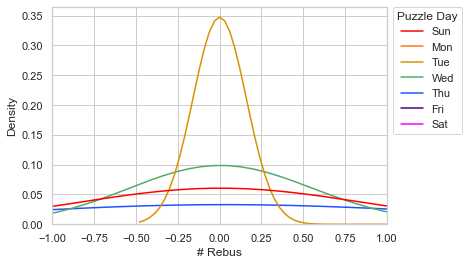

In [201]:
# Density plot of Rebus Count in puzzles solved by IS1
# Rememember to use df3 because df4 has the copied-in data for plotting all completed puzzles together

IS1_df4 = IS1_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS1_df4, x = "Rebus_Count", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(-1, 1)
ax.set_xlabel("# Rebus")
plt.show()

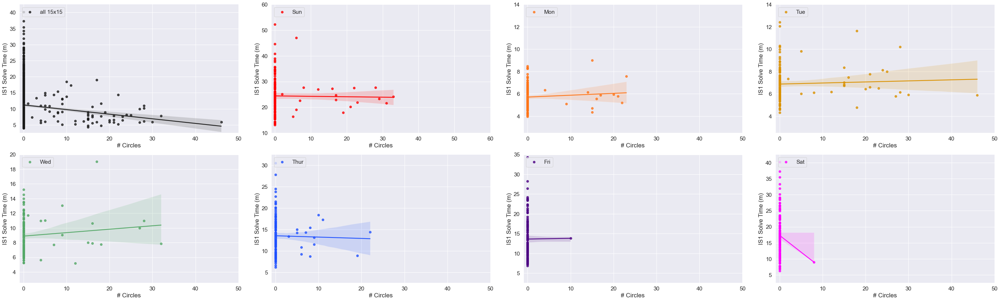

In [202]:
# Circles vs IS1 Raw Solve Times
# non-normed version
# Fig. S4

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Circle_Count", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Circles",
    ylabel="IS1 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,50))
p.axes[1].set_xlim((-1,60))
p.axes[2].set_xlim((-1,50))
p.axes[3].set_xlim((-1,50))
p.axes[4].set_xlim((-1,50))
p.axes[5].set_xlim((-1,50))
p.axes[6].set_xlim((-1,50))
p.axes[7].set_xlim((-1,50))

p.axes[0].set_ylim((2.5,42.5))
p.axes[1].set_ylim((10,60))
p.axes[2].set_ylim((2.5,14))
p.axes[3].set_ylim((2.5,14))
p.axes[4].set_ylim((2.5,20))
p.axes[5].set_ylim((2.5,32.5))
p.axes[6].set_ylim((2.5,35))
p.axes[7].set_ylim((2.5,42.5))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

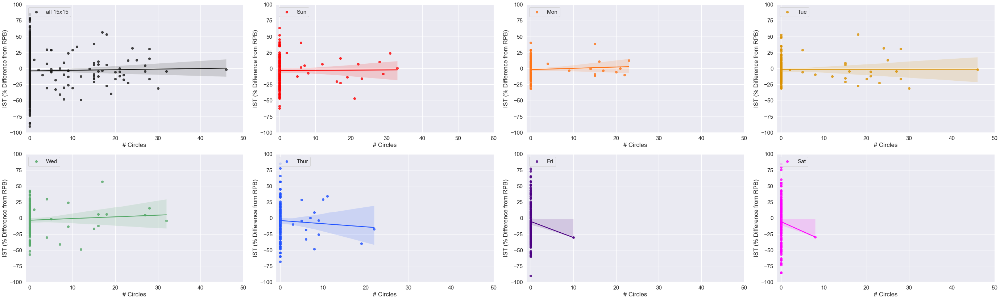

In [203]:
# Circles vs IS1 Raw Solve Times
#RPB normed version
# Fig. S4

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Circle_Count", y="IST_Diff%_from_IS_pds_l8_ndw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Circles",
    ylabel="IST (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,50))
p.axes[1].set_xlim((-1,60))
p.axes[2].set_xlim((-1,50))
p.axes[3].set_xlim((-1,50))
p.axes[4].set_xlim((-1,50))
p.axes[5].set_xlim((-1,50))
p.axes[6].set_xlim((-1,50))
p.axes[7].set_xlim((-1,50))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [204]:
# Calculate Pearson R for IS1 for 15x15 grids for this feature
#IS1_15x15 = IS1_df4.loc[IS1_df4["DOW"]!=("Sunday")]

print(IS1_15x15['IST(m)'].corr(IS1_15x15['Circle_Count']))

# Calculate Pearson R for each puzzle day for this feature
IS1_Sun = IS1_df4.loc[IS1_df4["DOW"]==("Sunday")]
print(IS1_Sun['IST(m)'].corr(IS1_Sun['Circle_Count']))

IS1_Mon = IS1_df4.loc[IS1_df4["DOW"]==("Monday")]
print(IS1_Mon['IST(m)'].corr(IS1_Mon['Circle_Count']))

IS1_Tue = IS1_df4.loc[IS1_df4["DOW"]==("Tuesday")]
print(IS1_Tue['IST(m)'].corr(IS1_Tue['Circle_Count']))

IS1_Wed = IS1_df4.loc[IS1_df4["DOW"]==("Wednesday")]
print(IS1_Wed['IST(m)'].corr(IS1_Wed['Circle_Count']))

IS1_Thu = IS1_df4.loc[IS1_df4["DOW"]==("Thursday")]
print(IS1_Thu['IST(m)'].corr(IS1_Thu['Circle_Count']))

IS1_Fri = IS1_df4.loc[IS1_df4["DOW"]==("Friday")]
print(IS1_Fri['IST(m)'].corr(IS1_Fri['Circle_Count']))

IS1_Sat = IS1_df4.loc[IS1_df4["DOW"]==("Saturday")]
print(IS1_Sat['IST(m)'].corr(IS1_Sat['Circle_Count']))

-0.1158738787387735
-0.016131952337532045
0.08033541410942947
0.052939050828590996
0.1090107838261399
-0.024183589860366332
0.003199169006799362
-0.0963390740758199


In [205]:
# Calculate Pearson R for 15x15 grids for GMS for this feature
#IS1_15x15 = IS1_df4.loc[IS1_df4["DOW"]!=("Sunday")]

print(IS1_15x15['GMST(m)'].corr(IS1_15x15['Circle_Count']))

# Calculate Pearson R for each puzzle day for this feature
IS1_Sun = IS1_df4.loc[IS1_df4["DOW"]==("Sunday")]
print(IS1_Sun['GMST(m)'].corr(IS1_Sun['Circle_Count']))

IS1_Mon = IS1_df4.loc[IS1_df4["DOW"]==("Monday")]
print(IS1_Mon['GMST(m)'].corr(IS1_Mon['Circle_Count']))

IS1_Tue = IS1_df4.loc[IS1_df4["DOW"]==("Tuesday")]
print(IS1_Tue['GMST(m)'].corr(IS1_Tue['Circle_Count']))

IS1_Wed = IS1_df4.loc[IS1_df4["DOW"]==("Wednesday")]
print(IS1_Wed['GMST(m)'].corr(IS1_Wed['Circle_Count']))

IS1_Thu = IS1_df4.loc[IS1_df4["DOW"]==("Thursday")]
print(IS1_Thu['GMST(m)'].corr(IS1_Thu['Circle_Count']))

IS1_Fri = IS1_df4.loc[IS1_df4["DOW"]==("Friday")]
print(IS1_Fri['GMST(m)'].corr(IS1_Fri['Circle_Count']))

IS1_Sat = IS1_df4.loc[IS1_df4["DOW"]==("Saturday")]
print(IS1_Sat['GMST(m)'].corr(IS1_Sat['Circle_Count']))

-0.14397715162120162
0.017983258887740543
0.23274980343630422
0.14004068813307002
0.08129824904769954
-0.1064548682316425
-0.07081490979861962
-0.038766100444573265


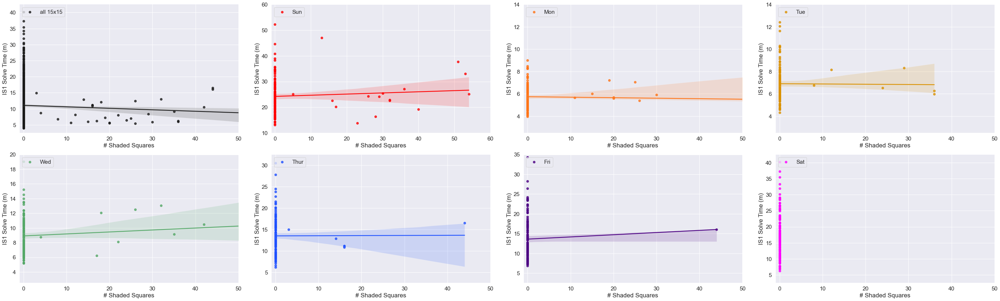

In [206]:
# Shaded Squares vs IS1 Raw Solve Times
# non-normed version
# Fig. S5

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Shade_Count", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Shaded Squares",
    ylabel="IS1 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,50))
p.axes[1].set_xlim((-1,60))
p.axes[2].set_xlim((-1,50))
p.axes[3].set_xlim((-1,50))
p.axes[4].set_xlim((-1,50))
p.axes[5].set_xlim((-1,50))
p.axes[6].set_xlim((-1,50))
p.axes[7].set_xlim((-1,50))

p.axes[0].set_ylim((2.5,42.5))
p.axes[1].set_ylim((10,60))
p.axes[2].set_ylim((2.5,14))
p.axes[3].set_ylim((2.5,14))
p.axes[4].set_ylim((2.5,20))
p.axes[5].set_ylim((2.5,32.5))
p.axes[6].set_ylim((2.5,35))
p.axes[7].set_ylim((2.5,42.5))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

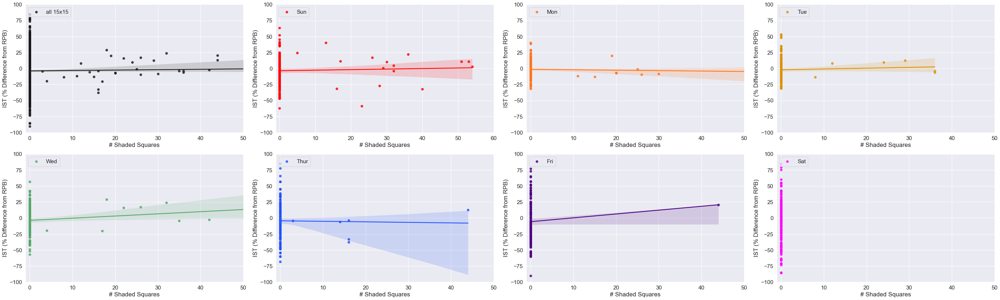

In [207]:
# Shaded Squares vs IS1 Raw Solve Times
# RPB normalized version
# Fig. S5

IS1_df4a = IS1_df4a.sort_values(by=['DOW_num'], ascending = True)

IS1_df4a['plot_seq_map'] = IS1_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS1_df4a, x="Shade_Count", y="IST_Diff%_from_IS_pds_l8_ndw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Shaded Squares",
    ylabel="IST (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,50))
p.axes[1].set_xlim((-1,60))
p.axes[2].set_xlim((-1,50))
p.axes[3].set_xlim((-1,50))
p.axes[4].set_xlim((-1,50))
p.axes[5].set_xlim((-1,50))
p.axes[6].set_xlim((-1,50))
p.axes[7].set_xlim((-1,50))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [208]:
# Calculate Pearson R for IS1 for 15x15 grids for this feature
#IS1_15x15 = IS1_df4.loc[IS1_df4["DOW"]!=("Sunday")]

print(IS1_15x15['IST(m)'].corr(IS1_15x15['Shade_Count']))

# Calculate Pearson R for each puzzle day for this feature
IS1_Sun = IS1_df4.loc[IS1_df4["DOW"]==("Sunday")]
print(IS1_Sun['IST(m)'].corr(IS1_Sun['Shade_Count']))

IS1_Mon = IS1_df4.loc[IS1_df4["DOW"]==("Monday")]
print(IS1_Mon['IST(m)'].corr(IS1_Mon['Shade_Count']))

IS1_Tue = IS1_df4.loc[IS1_df4["DOW"]==("Tuesday")]
print(IS1_Tue['IST(m)'].corr(IS1_Tue['Shade_Count']))

IS1_Wed = IS1_df4.loc[IS1_df4["DOW"]==("Wednesday")]
print(IS1_Wed['IST(m)'].corr(IS1_Wed['Shade_Count']))

IS1_Thu = IS1_df4.loc[IS1_df4["DOW"]==("Thursday")]
print(IS1_Thu['IST(m)'].corr(IS1_Thu['Shade_Count']))

IS1_Fri = IS1_df4.loc[IS1_df4["DOW"]==("Friday")]
print(IS1_Fri['IST(m)'].corr(IS1_Fri['Shade_Count']))

IS1_Sat = IS1_df4.loc[IS1_df4["DOW"]==("Saturday")]
print(IS1_Sat['IST(m)'].corr(IS1_Sat['Shade_Count']))

-0.06158435220069968
0.07094367557613578
-0.07042323825043074
-0.009118647468073502
0.09259246326426239
0.0036062931740138025
0.04131083307645083
nan


In [209]:
# Calculate Pearson R for GMS for 15x15 grids for this feature
#IS1_15x15 = IS1_df3.loc[IS1_df3["DOW"]!=("Sunday")]

print(IS1_15x15['GMST(m)'].corr(IS1_15x15['Shade_Count']))

# Calculate Pearson R for each puzzle day for this feature
IS1_Sun = IS1_df3.loc[IS1_df3["DOW"]==("Sunday")]
print(IS1_Sun['GMST(m)'].corr(IS1_Sun['Shade_Count']))

IS1_Mon = IS1_df3.loc[IS1_df3["DOW"]==("Monday")]
print(IS1_Mon['GMST(m)'].corr(IS1_Mon['Shade_Count']))

IS1_Tue = IS1_df3.loc[IS1_df3["DOW"]==("Tuesday")]
print(IS1_Tue['GMST(m)'].corr(IS1_Tue['Shade_Count']))

IS1_Wed = IS1_df3.loc[IS1_df3["DOW"]==("Wednesday")]
print(IS1_Wed['GMST(m)'].corr(IS1_Wed['Shade_Count']))

IS1_Thu = IS1_df3.loc[IS1_df3["DOW"]==("Thursday")]
print(IS1_Thu['GMST(m)'].corr(IS1_Thu['Shade_Count']))

IS1_Fri = IS1_df3.loc[IS1_df3["DOW"]==("Friday")]
print(IS1_Fri['GMST(m)'].corr(IS1_Fri['Shade_Count']))

IS1_Sat = IS1_df3.loc[IS1_df3["DOW"]==("Saturday")]
print(IS1_Sat['GMST(m)'].corr(IS1_Sat['Shade_Count']))

-0.06778646403416679
-0.12702672094153047
-0.05643000415432393
-0.01789920444297089
0.15963760363140977
0.12003365758219914
0.06496707176915538
nan
